# Zomato Classification Project 📈 📉 📊
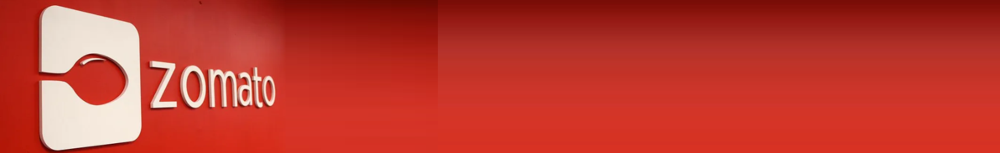

* <h2>Epsilon AI, Internship program
* **Project 1 -** Zomato Classification
* **Under Supervision of** : Eng. Karim Hamdy
* **Kaggel Link** : https://www.kaggle.com/datasets/himanshupoddar/zomato-bangalore-restaurants/data
* By : Osama Ahmed

### Zomato Dataset: Columns and Descriptions

| Column Name                    | Description                                                      |
|---------------------------------|------------------------------------------------------------------|
| `url`                           | The URL of the restaurant's Zomato page                          |
| `address`                       | Full address of the restaurant                                   |
| `name`                          | Name of the restaurant                                           |
| `online_order`                  | Whether online ordering is available (`Yes` or `No`)             |
| `book_table`                    | Whether table booking is available (`Yes` or `No`)               |
| `rate`                          | Average customer rating                                          |
| `votes`                         | Number of votes received for the rating                          |
| `phone`                         | Contact phone number(s) of the restaurant                        |
| `location`                      | General area or neighborhood where the restaurant is located     |
| `rest_type`                     | Type of restaurant (e.g., Casual Dining, Cafe, etc.)             |
| `dish_liked`                    | Most liked dishes based on customer reviews                      |
| `cuisines`                      | Cuisines offered at the restaurant                               |
| `approx_cost(for two people)`    | Approximate cost for two people to dine at the restaurant         |
| `reviews_list`                  | List of customer reviews                                         |
| `menu_item`                     | Menu items available at the restaurant                           |
| `listed_in(type)`               | Type of meal category (e.g., Buffet, Breakfast)                  |
| `listed_in(city)`               | City where the restaurant is listed                             |
                |


## ✅ 01 - Import Libraries

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from datasist.structdata import detect_outliers
import warnings
from sklearn.metrics import mutual_info_score
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_colwidth', 100)
warnings.filterwarnings("ignore")
# Maxmize jupyter width
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

### ⚠️ Functions Suppport

In [2]:
# Define Function for Crosstab visualization 
def HeatMapp(data , title , xlabel , ylabel , color):
    plt.figure(figsize=(15, 9))
    sns.heatmap( data , annot=True, fmt='g', cmap=color)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    return plt.show()

In [3]:
# BarPlot to give data,x,y only
def BarPlot (data  , x , y):
    # Define a color palette with two colors
    color_palette = ['#1f77b4', '#ff7f0e']  # Example colors: blue and orange
    
    # Plot using Matplotlib
    fig, ax = plt.subplots(figsize=(10, 5))  # Set figure size
    
    # Create bar plot
    ax.bar(data[x], data[y], color='skyblue' )
    
    # Add text labels (Text_Auto equivalent)
    for index, value in enumerate(data[y]):
        ax.text(index, value, str(value), ha='center', va='bottom', fontsize=10)
    
    # Set titles and labels
    ax.set_title(f'Count of Rate {x}', fontsize=16)
    ax.set_xlabel(f'{x}', fontsize=12)
    ax.set_ylabel(f'{y}', fontsize=12)
    
    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

In [4]:
# BivPlot with color to give data,x,y only
def BivPlot_color(data, x, y, color, title):
    plt.figure(figsize=(16, 6))
    ax = sns.barplot(data=data,
                     x=x,
                     y=y,
                     hue=color,
                     estimator=np.sum,
                     edgecolor='none')  # Remove the bar border
    
    # Set the background color
    plt.gcf().set_facecolor('lightgray')  # Set figure background color
    ax.set_facecolor('lightgray')    # Set axes background color
    
    # Add labels and title
    plt.title(title)
    plt.xlabel(x, size=18)
    plt.ylabel(y, size=18)
    plt.xticks(rotation=90)
    
    # Add value labels at the top of the bars
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()  # get the x and y coordinates of the rectangle
        ax.annotate(f'{height:.2f}',  # format the height value
                    (x + width / 2, y + height),  # position of the text at the top of the bar
                    ha='center', va='bottom', color='black', fontsize=9, rotation=90)  # text alignment, color, and rotation
    plt.show()

In [5]:
# Define OOP Class to Generate Deep Analysis using Crosstab method to display the below details :
    # calculate_col_counts : Extract unique cols and count occurrences
    # col_details : Crosstab (Pivot Analysis)
    # cols_above_median : Get cols above the median
    # analyze : Wrapper function to perform all analyses and plot heatmap

class  ColAnalysis:
    pd.options.display.float_format = '{:,.2f}'.format
    def __init__(self, df, column_name, quantile_list, bins_list, labels_list):
        self.df = df
        self.column_name = column_name
        self.quantile_list = quantile_list
        self.bins_list = bins_list
        self.labels_list = labels_list
        self.Col_counts_df = None
        self.Col_Details = None
        self.ColUnderMedian = None

    # Method 1: Extract unique cols and count occurrences
    def calculate_col_counts(self):
        Col = self.df[self.column_name].str.split(',').explode().str.strip().unique()
        Col_counts = {col: 0 for col in Col}
        
        for col in Col:
            Col_counts[col] = self.df[self.column_name].str.contains(col, na=False).sum()
        
        # Convert the dictionary to a DataFrame and sort it
        self.Col_counts_df = pd.DataFrame(list(Col_counts.items()), columns=[self.column_name, 'Count'])
        self.Col_counts_df = self.Col_counts_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

        # Binning
        self.Col_counts_df['binned'] = pd.cut(self.Col_counts_df['Count'], bins=self.bins_list, labels=self.labels_list, include_lowest=True)
        return self.Col_counts_df

    # Method 2: Crosstab (Pivot Analysis)
    def col_details(self):
        if self.Col_counts_df is None:
            self.calculate_col_counts()  # Ensure counts are calculated
        
        self.Col_Details = pd.crosstab(self.Col_counts_df[self.column_name], self.Col_counts_df['binned'], 
                                            values=self.Col_counts_df['Count'], aggfunc='sum').replace(np.nan, 0)
        self.Col_Details['All'] = self.Col_Details.sum(axis=1)
        self.Col_Details = self.Col_Details.sort_values(by='All', ascending=False)
        return self.Col_Details

    # Method 3: Get cols above the median
    def cols_above_median(self):
        if self.Col_Details is None:
            self.col_details()  # Ensure details are calculated
        
        median_value = self.Col_Details['All'].median()
        self.ColUnderMedian = self.Col_Details[self.Col_Details['All'] >= median_value]
        return self.ColUnderMedian

    # Method 5: Calculate quantiles for the 'Count' column
    def calculate_col_quantiles(self, quantile_intervals=None):
        if self.Col_counts_df is None:
            self.calculate_col_counts()  # Ensure counts are calculated
    
        # Use the class's quantile_list if no custom quantile intervals are provided
        if quantile_intervals is None:
            quantile_intervals = self.quantile_list
    
        # Calculate quantiles for the 'Count' column based on the specified intervals
        quantiles = self.Col_counts_df['Count'].quantile(quantile_intervals)
        return quantiles , print('\n') , quantiles.plot(kind = 'bar')

    # Method 4: Generate a heatmap
    def heatmap(self, data, title, xlabel, cmap='Greens'):
        plt.figure(figsize=(15, 11))
        sns.heatmap(data, annot=True, cmap=cmap , fmt='.0f', annot_kws={"size": 10})
        plt.title(title)
        plt.xlabel(xlabel)
        plt.ylabel("cols")
        plt.show()
        
    # Wrapper function to perform all analyses and plot heatmap
    def analyze(self):
        self.calculate_col_counts()
        self.col_details()
        col_median = self.cols_above_median()
        
        # Generate heatmap for cuisines above the median
        self.heatmap(col_median, f"Count of {self.column_name} above Median: {self.Col_Details['All'].median()}", self.column_name)


In [6]:
# mutual_info_score
def MIS(x):
    return mutual_info_score(x , df.score)

## ✔️ Read Data

In [7]:
org_df = 'zomato.csv'
df = pd.read_csv('zomato.csv')

In [8]:
df.head(1)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banashankari?context=eyJzZSI6eyJlIjpbNTg2OTQsIjE4Mzc1NDc0...,"942, 21st Main Road, 2nd Stage, Banashankari, Bangalore",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to dine in.The interiors take you back to the Mughal ...",[],Buffet,Banashankari


In [9]:
df.describe(include='all')

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
count,51717,51717,51717,51717,51717,43942,"51,717.00",50509,51696,51490,23639,51672,51371,51717,51717,51717,51717
unique,51717,11495,8792,2,2,64,NaN,14926,93,93,5271,2723,70,22513,9098,7,30
top,https://www.zomato.com/bangalore/jalsa-banashankari?context=eyJzZSI6eyJlIjpbNTg2OTQsIjE4Mzc1NDc0...,Delivery Only,Cafe Coffee Day,Yes,No,NEW,NaN,080 43334321,BTM,Quick Bites,Biryani,North Indian,300,[],[],Delivery,BTM
freq,1,128,96,30444,45268,2208,NaN,216,5124,19132,182,2913,7576,7595,39617,25942,3279
mean,NaN,NaN,NaN,NaN,NaN,NaN,283.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,803.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,7.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,41.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,198.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [11]:
df.isnull().mean()

url                           0.00
address                       0.00
name                          0.00
online_order                  0.00
book_table                    0.00
rate                          0.15
votes                         0.00
phone                         0.02
location                      0.00
rest_type                     0.00
dish_liked                    0.54
cuisines                      0.00
approx_cost(for two people)   0.01
reviews_list                  0.00
menu_item                     0.00
listed_in(type)               0.00
listed_in(city)               0.00
dtype: float64

## ✅ 02 - Data Cleaning & Exploration

### ⭕️ Columns Name Update

In [12]:
df.columns.tolist()

['url',
 'address',
 'name',
 'online_order',
 'book_table',
 'rate',
 'votes',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)',
 'reviews_list',
 'menu_item',
 'listed_in(type)',
 'listed_in(city)']

In [13]:
# Rename Some long Columns Name
df.rename(columns={
    'approx_cost(for two people)':'approx_cost',
    'listed_in(type)':'listed_type',
    'listed_in(city)':'listed_city'},inplace=True)

df.columns.tolist()

['url',
 'address',
 'name',
 'online_order',
 'book_table',
 'rate',
 'votes',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost',
 'reviews_list',
 'menu_item',
 'listed_type',
 'listed_city']

In [14]:
# Exploring Head 1 in Transpose view to explore the unnecessary clomuns to drop
df.sample(3).T

,30989,5441,48586
url,https://www.zomato.com/bangalore/indulge-by-innerchef-koramangala-7th-block?context=eyJzZSI6eyJl...,https://www.zomato.com/bangalore/ging-royal-orchid-central-mg-road?context=eyJzZSI6eyJlIjpbIjU5M...,https://www.zomato.com/bangalore/indian-durbar-conrad-bengaluru-ulsoor?context=eyJzZSI6eyJlIjpbI...
address,"1st Floor, 1st Cross, Besides Bosch, Koramangala 7th Block, Bangalore","Royal Orchid Central, Level 10,Manipal Centre, Cubbon Road, Off MG Road,Bangalore","Conrad Hotels, kensington Road, Ulsoor, Bangalore"
name,INDULGE by InnerChef,Ging - Royal Orchid Central,Indian Durbar - Conrad Bengaluru
online_order,Yes,Yes,No
book_table,No,Yes,Yes
rate,3.6 /5,4.3/5,3.7 /5
votes,29,225,57
phone,080 41202278\r\n+91 7829745705,+91 9902000063,+91 8884400194\n+91 8884358678
location,Koramangala 7th Block,MG Road,Ulsoor
rest_type,Bakery,"Bar, Casual Dining",Fine Dining


In [15]:
df.rate.count()

43942

In [16]:
# Exploring Number if Unique to explore the unnecessary clomuns to drop
reusults = []
for c in df.columns:
    unique_count = df[c].nunique()
    ValCount = df[c].count()
    NullVal = df[c].isnull().sum()
    reusults.append({'ColName' : c, 'Nunique' : unique_count, 'ValCount' : ValCount ,'NullVal' : NullVal})
pd.DataFrame(reusults)

,ColName,Nunique,ValCount,NullVal
0,url,51717,51717,0
1,address,11495,51717,0
2,name,8792,51717,0
3,online_order,2,51717,0
4,book_table,2,51717,0
5,rate,64,43942,7775
6,votes,2328,51717,0
7,phone,14926,50509,1208
8,location,93,51696,21
9,rest_type,93,51490,227


* After Check, we see that the below columns list is not important Initially:
    * url, address, dish_liked, reviews_list

In [17]:
# Review MenueItems columns details, saw 77% of resturants without menue and the value to menue items was [] "empty list"
print("- Empty menu" , round ( df[df.menu_item == '[]']['menu_item'].count()/df.shape[0] , 2) , ' %')
print("- Not Empty menu" , round ( df[df.menu_item != '[]']['menu_item'].count()/df.shape[0] , 2) , ' %')

- Empty menu 0.77  %
- Not Empty menu 0.23  %


In [18]:
df.cuisines.unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ...,
       'North Indian, Street Food, Biryani', 'Chinese, Mughlai',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

### ⭕️ Initially Drop not important Columns

In [19]:
# Deop url, address, dish_liked, reviews_list
print("Before Drop",df.shape)
df.drop(['url', 'address', 'dish_liked', 'reviews_list'] , axis=1, inplace=True)
print("After Drop",df.shape)

Before Drop (51717, 17)
After Drop (51717, 13)


In [20]:
df.head(4)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
0,Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,[],Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,[],Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,[],Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,"South Indian, North Indian",300,[],Buffet,Banashankari


### ⭕️ Name

In [21]:
df.name.nunique()

8792

In [22]:
df.name.value_counts().sort_values(ascending=False)

name
Cafe Coffee Day                                            96
Onesta                                                     85
Just Bake                                                  73
Empire Restaurant                                          71
Five Star Chicken                                          70
                                                           ..
Homies                                                      1
Jai Bhavani Savaji Hotel                                    1
Angel's Kitchen                                             1
Hunan Express                                               1
Plunge - Sheraton Grand Bengaluru Whitefield Hotel &...     1
Name: count, Length: 8792, dtype: int64

### ⭕️ Rate

In [23]:
df.rate.unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [24]:
df[df.rate == '-']

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
3068,House of Tasty Food,No,No,-,0,+91 9538004054,Wilson Garden,Quick Bites,North Indian,400,[],Delivery,Basavanagudi
3069,Super Chef's (New Royal treat),No,No,-,0,NaN,Bannerghatta Road,Quick Bites,"North Indian, Chinese, South Indian",NaN,[],Delivery,Basavanagudi
3373,Right Pizza,Yes,No,-,0,+91 9980473473\n+91 9845338098,Basavanagudi,Quick Bites,Pizza,300,[],Dine-out,Basavanagudi
3378,Mezban Family Restaurant,Yes,No,-,0,+91 9344609944\n+91 8072284844,Basavanagudi,Quick Bites,"Chinese, North Indian",300,[],Dine-out,Basavanagudi
3387,Mota Bawarchi,No,No,-,0,+91 9380109284,Basavanagudi,Quick Bites,"North Indian, Biryani, Fast Food",300,[],Dine-out,Basavanagudi
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33454,Deepam Tiffins,No,No,-,0,+91 7003050054\n+91 9748122867,BTM,Quick Bites,"South Indian, North Indian, Chinese",300,[],Delivery,Koramangala 6th Block
33463,Hotel Orchid,No,No,-,0,+91 9972304268,BTM,Casual Dining,"North Indian, South Indian, Chinese, Kerala",500,[],Delivery,Koramangala 6th Block
45646,Sri Udupi,Yes,No,-,0,+91 8105663135\n+91 9845888813,Old Airport Road,Quick Bites,"South Indian, North Indian, Chinese, Beverages",400,[],Dine-out,Old Airport Road
45647,Frozen Bite,Yes,No,-,0,+91 9591922994\n+91 8041600292,Old Airport Road,Beverage Shop,Beverages,250,[],Dine-out,Old Airport Road


In [25]:
# Calculate "NAN" , "-" , "New" rows 
df.rate = df.rate.fillna('NAN')
df[(df.rate == '-') | (df.rate == 'NEW') | (df.rate == 'NAN')]['rate'].value_counts()

rate
NAN    7775
NEW    2208
-        69
Name: count, dtype: int64

In [26]:
# Check Value count of RATE rows that have value : ('-' , 'NEW' , 'NAN') 
pd.crosstab(df[(df.rate == '-') | (df.rate == 'NEW') | (df.rate == 'NAN')]['rate'] , df.rate , values=df.votes , aggfunc='count').replace(np.nan , '').reset_index()

rate,rate,-,NAN,NEW
0,-,69.00,,
1,NAN,,"7,775.00",
2,NEW,,,"2,208.00"


In [27]:
# Drpo rows contains ('-' , 'NEW' , 'NAN') as no longer to rate them as target as Good/Not Good
print("Before Drop",df.shape)
df = df[~df.rate.isin(['-' , 'NEW' , 'NAN'])].reset_index(drop = True)
print("After Drop",df.shape)

Before Drop (51717, 13)
After Drop (41665, 13)


In [28]:
df.rate.unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', '2.9/5', '3.5/5', '2.6/5', '3.8 /5', '3.4/5', '4.5/5',
       '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5', '3.4 /5',
       '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5', '4.1 /5',
       '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5', '3.5 /5',
       '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5', '4.3 /5',
       '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5', '4.9 /5',
       '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5', '2.1 /5',
       '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [29]:
# Define a Function to handle the Unique Value of our Target "Rate" to be statndrize
def RATE (x):
    if "/" in x.replace(" ",""):
        return float(x.split('/')[0])
    else:
        return 0
print("Test Case 1 :" , RATE ('2.9 /5'))
print("Test Case 2 :" , RATE ('New '))
print("Test Case 3 :" , RATE ('2.0/5'))
print("Final Case Unique :" , df.rate.apply(RATE).unique().tolist())

Test Case 1 : 2.9
Test Case 2 : 0
Test Case 3 : 2.0
Final Case Unique : [4.1, 3.8, 3.7, 3.6, 4.6, 4.0, 4.2, 3.9, 3.1, 3.0, 3.2, 3.3, 2.8, 4.4, 4.3, 2.9, 3.5, 2.6, 3.4, 4.5, 2.5, 2.7, 4.7, 2.4, 2.2, 2.3, 4.8, 4.9, 2.1, 2.0, 1.8]


In [30]:
# Apply RATE Function
df.rate = df.rate.apply(RATE)

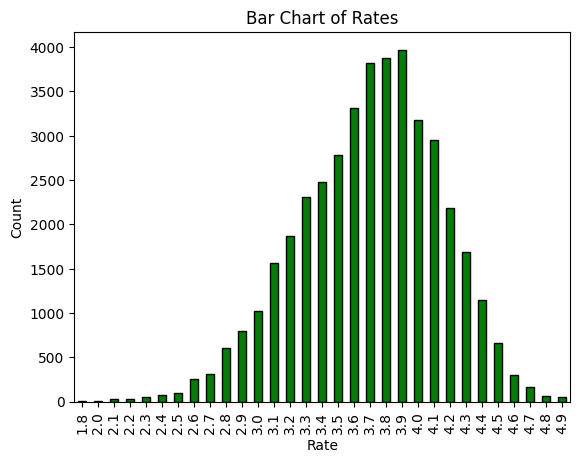

In [31]:
# Chcke after apply
import statistics as sta
df.rate.value_counts().sort_index().plot(kind = 'bar', color='green', edgecolor='black')
plt.xlabel('Rate')
plt.ylabel('Count')
plt.title('Bar Chart of Rates')
plt.xticks(rotation=90);

In [32]:
df.votes.describe()

count   41,665.00
mean       351.65
std        881.80
min          0.00
25%         21.00
50%         73.00
75%        276.00
max     16,832.00
Name: votes, dtype: float64

### ⭕️ Votes

In [33]:
df.votes.unique()

array([ 775,  787,  918, ..., 4957, 2382,  843], dtype=int64)

In [34]:
# Cast Votes to Float 
df.votes = df.votes.apply(lambda x: int(x))
print("Done : " , df.votes.isnull().sum())

Done :  0


### ⭕️ Online_order	& Book_table

In [35]:
# Check the Value Count of "Online_order & Book_table" in order to conver "YES/No" to binary "0/1"
for i in ['online_order' , 'book_table']:
    print(i)
    display(df[i].value_counts().reset_index())

online_order


,online_order,count
0,Yes,27206
1,No,14459


book_table


,book_table,count
0,No,35361
1,Yes,6304


In [36]:
# Define Function to Convert "YES/No" to "0/1"
df['online_order'] = df['online_order'].map({"Yes" : 1, "No": 0})
df['book_table'] = df['book_table'].map({"Yes" : 1, "No": 0})

# Recheck output
for i in ['online_order' , 'book_table']:
    print(i)
    display(df[i].value_counts().reset_index())

online_order


,online_order,count
0,1,27206
1,0,14459


book_table


,book_table,count
0,0,35361
1,1,6304


### ⭕️ Phone

In [37]:
df.phone.describe()

count            40851
unique           12198
top       080 43334321
freq               181
Name: phone, dtype: object

In [38]:
df.phone.isnull().sum()

814

In [39]:
# Define Function to convert all Phone availabilty to "count of phone lines in each resturant" - For testing result
def PHONE (x):
    if pd.isna(x):
        return 0
    else:
        return len(x.split('\r\n'))
print("Test Case 1 :" , PHONE ('080 25287379\r\r\r\n+91 9845100909'))
print("Test Case 2 :" , PHONE (' +91 9986236425\r\n+91 9986969992 '))
print("Test Case 3 :" , PHONE ('+91 9886808462\n+91 8884308040'))
print("Final Case Unique :" , df.phone.apply(PHONE).unique().tolist())

Test Case 1 : 2
Test Case 2 : 2
Test Case 3 : 1
Final Case Unique : [2, 1, 0]


In [40]:
# Now after check the count of phone lines in all data, see to set the defult value "YES/No" instated of "count of phone lines in each resturant"
def PHONE_1 (x):
    if pd.isna(x):
        return 0
    else:
        return 1
print("Test Case 1 :" , PHONE ('080 25287379\r\r\r\n+91 9845100909'))
print("Test Case 2 :" , PHONE (' +91 9986236425\r\n+91 9986969992 '))
print("Test Case 3 :" , PHONE ('+91 9886808462\n+91 8884308040'))
print("Final Case Unique :" , df.phone.apply(PHONE_1).unique().tolist())

Test Case 1 : 2
Test Case 2 : 2
Test Case 3 : 1
Final Case Unique : [1, 0]


In [41]:
# Apply PHONE_1 to phone column
df.phone = df.phone.apply(PHONE_1)

In [42]:
# Check after apply
df.phone.value_counts()

phone
1    40851
0      814
Name: count, dtype: int64

In [43]:
# Check after apply
df.head(2)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
0,Jalsa,1,1,4.10,775,1,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,[],Buffet,Banashankari
1,Spice Elephant,1,0,4.10,787,1,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,[],Buffet,Banashankari


### ⭕️ Location
* No change in Location Column

In [44]:
# Veiw Null
df.isnull().sum()

name              0
online_order      0
book_table        0
rate              0
votes             0
phone             0
location          0
rest_type       149
cuisines         11
approx_cost     247
menu_item         0
listed_type       0
listed_city       0
dtype: int64

In [45]:
# Check Location Unique
df.location.unique().tolist()

['Banashankari',
 'Basavanagudi',
 'Mysore Road',
 'Jayanagar',
 'Kumaraswamy Layout',
 'Rajarajeshwari Nagar',
 'Vijay Nagar',
 'Uttarahalli',
 'JP Nagar',
 'South Bangalore',
 'City Market',
 'Bannerghatta Road',
 'BTM',
 'Kanakapura Road',
 'Bommanahalli',
 'Electronic City',
 'Sarjapur Road',
 'Wilson Garden',
 'Shanti Nagar',
 'Koramangala 5th Block',
 'Richmond Road',
 'HSR',
 'Koramangala 7th Block',
 'Bellandur',
 'Marathahalli',
 'Whitefield',
 'East Bangalore',
 'Old Airport Road',
 'Indiranagar',
 'Koramangala 1st Block',
 'Frazer Town',
 'MG Road',
 'Brigade Road',
 'Lavelle Road',
 'Church Street',
 'Ulsoor',
 'Residency Road',
 'Shivajinagar',
 'Infantry Road',
 'St. Marks Road',
 'Cunningham Road',
 'Race Course Road',
 'Commercial Street',
 'Vasanth Nagar',
 'Domlur',
 'Koramangala 8th Block',
 'Ejipura',
 'Jeevan Bhima Nagar',
 'Old Madras Road',
 'Seshadripuram',
 'Kammanahalli',
 'Koramangala 6th Block',
 'Majestic',
 'Langford Town',
 'Central Bangalore',
 'Brookefi

In [46]:
# Exploring "location" Types overall data
Loca = df.location.str.split(',').explode().str.strip().unique()
print(len(Loca))
Loca

92


array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Bannerghatta Road', 'BTM', 'Kanakapura Road', 'Bommanahalli',
       'Electronic City', 'Sarjapur Road', 'Wilson Garden',
       'Shanti Nagar', 'Koramangala 5th Block', 'Richmond Road', 'HSR',
       'Koramangala 7th Block', 'Bellandur', 'Marathahalli', 'Whitefield',
       'East Bangalore', 'Old Airport Road', 'Indiranagar',
       'Koramangala 1st Block', 'Frazer Town', 'MG Road', 'Brigade Road',
       'Lavelle Road', 'Church Street', 'Ulsoor', 'Residency Road',
       'Shivajinagar', 'Infantry Road', 'St. Marks Road',
       'Cunningham Road', 'Race Course Road', 'Commercial Street',
       'Vasanth Nagar', 'Domlur', 'Koramangala 8th Block', 'Ejipura',
       'Jeevan Bhima Nagar', 'Old Madras Road', 'Seshadripuram',
       'Kammanahalli', 'Koramangala 6th Block', 'Majestic'

In [47]:
# Extract unique locations
Loca = df['location'].str.split(',').explode().str.strip().unique()

# Initialize a dictionary to store counts
location_counts = {loc: 0 for loc in Loca}

# Count occurrences of each location
for loc in Loca:
    location_counts[loc] = df['location'].str.contains(loc).sum()

# Convert the dictionary to a DataFrame
location_counts_df = pd.DataFrame(list(location_counts.items()), columns=['Location', 'Count'])

# Sort the DataFrame by count in descending order
location_counts_df = location_counts_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

# Define bins and labels
bins = [0, 500, 1000, 3000, 6000, 7000]
labels = ["0-500", "500-1000", "1000-3000", "3000-6000" , "6000-7000"]

# Apply pd.cut to 'Count' column at the whole DataFrame
location_counts_df['binned'] = pd.cut(location_counts_df['Count'], bins=bins, labels=labels, include_lowest=True)

# Print the DataFrame
location_counts_df

,Location,Count,binned
0,Koramangala,6689,6000-7000
1,BTM,3930,3000-6000
2,Koramangala 5th Block,2319,1000-3000
3,HSR,2019,1000-3000
4,Indiranagar,1847,1000-3000
...,...,...,...
87,Yelahanka,5,0-500
88,West Bangalore,3,0-500
89,Rajarajeshwari Nagar,2,0-500
90,Nagarbhavi,1,0-500


In [48]:
# Pivoting Analysis for Locations 
Locations_Details = pd.crosstab( location_counts_df['Location'] , location_counts_df.binned , values=location_counts_df.Count , aggfunc='sum' , margins=True).sort_values(by='All' , ascending=False)
Locations_Details

binned,0-500,500-1000,1000-3000,3000-6000,6000-7000,All
Location,,,,,,
All,8074,11625,18170,3930,6689,48488
Koramangala,0,0,0,0,6689,6689
BTM,0,0,0,3930,0,3930
Koramangala 5th Block,0,0,2319,0,0,2319
HSR,0,0,2019,0,0,2019
...,...,...,...,...,...,...
Yelahanka,5,0,0,0,0,5
West Bangalore,3,0,0,0,0,3
Rajarajeshwari Nagar,2,0,0,0,0,2


### ⭕️ Rest_type
* After Check below , see to drop 149 rows is the best solution than impute the null as the count of rows is few.

In [49]:
# Check Sample
df.sample(5)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
17292,Cafe Bollywood,0,0,3.40,25,1,JP Nagar,Quick Bites,Street Food,200,[],Dine-out,Jayanagar
27331,Skywalk Restobar,0,0,3.30,5,1,Koramangala 1st Block,"Casual Dining, Bar","North Indian, South Indian",700,[],Dine-out,Koramangala 6th Block
26754,Meal In A Box,0,0,3.60,15,1,Koramangala 7th Block,Delivery,Street Food,300,[],Delivery,Koramangala 6th Block
5783,Spellbound,1,0,3.30,4,1,Whitefield,Quick Bites,"Street Food, Burger, Beverages, Fast Food, Sandwich, Finger Food",400,"['Dal Kachori', 'Aloo Bonda', 'Paneer Burger', 'Veg Burger', 'Paneer Burger', 'Spinach Corn Burg...",Delivery,Brookefield
2115,Ishta Cafe,1,0,3.90,40,1,Jayanagar,Quick Bites,"Pizza, South Indian, Healthy Food",500,[],Delivery,Basavanagudi


In [50]:
# View null count
df.rest_type.isnull().sum()

149

In [51]:
# Explore the Unique count of "Rest Type"
df.rest_type.nunique()

87

In [52]:
# Exploring "rest_type" Types overall data
RestType = df.rest_type.str.split(',').explode().str.strip().unique()
print(len(RestType))
RestType

25


array(['Casual Dining', 'Cafe', 'Quick Bites', 'Delivery', 'Mess',
       'Dessert Parlor', 'Bakery', 'Pub', 'Takeaway', 'Fine Dining',
       'Beverage Shop', 'Sweet Shop', 'Bar', 'Kiosk', 'Food Truck',
       'Microbrewery', 'Lounge', 'Food Court', nan, 'Dhaba', 'Club',
       'Irani Cafee', 'Confectionery', 'Bhojanalya', 'Meat Shop'],
      dtype=object)

* Check Null Data

In [53]:
# Check Null data
df[df.rest_type.isnull()]

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
852,Mughlai Kitchen,1,0,3.50,269,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,"['Fry Chicken Kabab [5 Pieces]', 'Fry Chicken Hariyali Kabab [5 Pieces]', 'Paneer Tikka', 'Bonel...",Delivery,Bannerghatta Road
1119,Eat & Joy Restaurant,1,0,3.00,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,Bannerghatta Road
1180,Kababish Restaurant,1,0,3.60,15,1,BTM,NaN,"North Indian, Chinese, Arabian",700,[],Delivery,Bannerghatta Road
1353,Ammi's Biryani,0,0,2.40,392,1,Bannerghatta Road,NaN,"Biryani, North Indian",500,[],Delivery,Bannerghatta Road
1621,Ammi's Biryani,0,0,2.40,392,1,Bannerghatta Road,NaN,"Biryani, North Indian",500,[],Dine-out,Bannerghatta Road
...,...,...,...,...,...,...,...,...,...,...,...,...,...
40303,Paratha's Kitchen,1,0,2.80,33,1,Bellandur,NaN,"North Indian, South Indian",200,"['Paneer Paratha', 'Sathu Paratha', 'Aloo Paratha Combo with Chole', 'Sathu Paratha Combo with C...",Dine-out,Sarjapur Road
40340,New Andhra Spicy,1,0,3.60,11,1,Bellandur,NaN,"North Indian, Chinese, Andhra, South Indian, Biryani",200,[],Dine-out,Sarjapur Road
40659,Special Biryani House,1,0,3.20,202,1,Whitefield,NaN,"North Indian, Biryani, Chinese",400,[],Delivery,Whitefield
41007,Vijayawada Heights,1,0,3.20,8,1,Whitefield,NaN,North Indian,600,[],Delivery,Whitefield


In [54]:
df[df.name == 'Mughlai Kitchen']

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
852,Mughlai Kitchen,1,0,3.50,269,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,"['Fry Chicken Kabab [5 Pieces]', 'Fry Chicken Hariyali Kabab [5 Pieces]', 'Paneer Tikka', 'Bonel...",Delivery,Bannerghatta Road
1927,Mughlai Kitchen,1,0,3.50,269,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,[],Dine-out,Bannerghatta Road
7569,Mughlai Kitchen,1,0,3.50,270,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,[],Delivery,BTM
8443,Mughlai Kitchen,1,0,3.50,270,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,"['Fry Chicken Kabab [5 Pieces]', 'Fry Chicken Hariyali Kabab [5 Pieces]', 'Chicken 65', 'Chilli ...",Dine-out,BTM
17572,Mughlai Kitchen,1,0,3.50,270,1,BTM,NaN,"Mughlai, North Indian, Chinese, Momos",600,[],Delivery,JP Nagar


In [55]:
df[df.name == 'Eat & Joy Restaurant']

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
1119,Eat & Joy Restaurant,1,0,3.00,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,Bannerghatta Road
1847,Eat & Joy Restaurant,1,0,3.00,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Dine-out,Bannerghatta Road
8013,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,BTM
16044,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,Jayanagar
17886,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,JP Nagar
18590,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Dine-out,JP Nagar


In [56]:
df[ (df.rest_type.isnull()) & (df.name == 'Eat & Joy Restaurant')]

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
1119,Eat & Joy Restaurant,1,0,3.00,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,Bannerghatta Road
1847,Eat & Joy Restaurant,1,0,3.00,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Dine-out,Bannerghatta Road
8013,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,BTM
16044,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,Jayanagar
17886,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Delivery,JP Nagar
18590,Eat & Joy Restaurant,1,0,3.10,7,1,JP Nagar,NaN,"Fast Food, Finger Food",300,[],Dine-out,JP Nagar


In [57]:
# Drop Null Values of "Rest Type"
print("Before Drop",df.shape)
df.dropna(subset='rest_type' , inplace=True)
print("After Drop",df.shape)

Before Drop (41665, 13)
After Drop (41516, 13)


In [58]:
df.rest_type.value_counts()[:10].reset_index()

,rest_type,count
0,Quick Bites,13944
1,Casual Dining,9659
2,Cafe,3405
3,Dessert Parlor,1864
4,Delivery,1680
5,"Takeaway, Delivery",1292
6,"Casual Dining, Bar",1110
7,Bakery,704
8,Bar,651
9,Beverage Shop,642


In [59]:
# Check the rows that contains multiple types in same row
df[ (df.rest_type.str.contains(',')) & (df.cuisines.str.contains(',')) ]

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
2,San Churro Cafe,1,0,3.80,918,1,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,[],Buffet,Banashankari
7,Onesta,1,1,4.60,2556,1,Banashankari,"Casual Dining, Cafe","Pizza, Cafe, Italian",600,[],Cafes,Banashankari
14,San Churro Cafe,1,0,3.80,918,1,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,[],Cafes,Banashankari
23,My Tea House,1,0,3.60,62,1,Banashankari,"Quick Bites, Cafe","Italian, Fast Food, Cafe, European",600,[],Cafes,Banashankari
26,Coffee Tindi,1,0,3.80,75,1,Banashankari,"Cafe, Quick Bites","Cafe, South Indian",200,[],Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41656,Izakaya Gastro Pub,1,1,3.80,128,1,Whitefield,"Bar, Casual Dining","North Indian, Continental, Mediterranean","1,200",[],Pubs and bars,Whitefield
41659,Keys Cafe - Keys Hotel,0,0,2.80,161,1,Whitefield,"Casual Dining, Bar","Chinese, Continental, North Indian","1,200",[],Pubs and bars,Whitefield
41660,The Farm House Bar n Grill,0,0,3.70,34,1,Whitefield,"Casual Dining, Bar","North Indian, Continental",800,[],Pubs and bars,Whitefield
41661,Bhagini,0,0,2.50,81,1,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800,[],Pubs and bars,Whitefield


### ⭕️ Cuisines

In [60]:
df.sample(4)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
6518,UBCR,1,0,3.60,9,1,Marathahalli,Cafe,"Italian, American, Chinese, Arabian, North Indian, Cafe","1,000",[],Dine-out,Brookefield
39912,Bhagini,0,0,2.30,132,1,Bellandur,Casual Dining,"Andhra, South Indian, Chinese, North Indian",800,[],Delivery,Sarjapur Road
6349,AB's - Absolute Barbecues,0,1,4.80,2882,1,Whitefield,Casual Dining,"European, Mediterranean, North Indian, BBQ","1,600",[],Dine-out,Brookefield
34970,Beijing Bites,1,0,3.80,265,1,Richmond Road,Casual Dining,"Chinese, Thai",850,"['Veg Fried Rice', 'Veg Schezwan Fried Rice', 'Egg Fried Rice', 'Chicken Fried Rice', 'Prawns Fr...",Dine-out,MG Road


In [61]:
# Check Null Count
df.cuisines.isnull().sum()

11

In [62]:
# Drop the few rows of cuisines
print("Before Drop" , df.shape)
df.dropna(subset='cuisines' , inplace=True)
print("After Drop" , df.shape)

Before Drop (41516, 13)
After Drop (41505, 13)


In [63]:
# Check Unique Values counts
df.cuisines.nunique()

2374

In [64]:
# Check Unique Values
df.cuisines.unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ..., 'Tibetan, Nepalese',
       'North Indian, Street Food, Biryani',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [65]:
# Check Sample
df.cuisines.sample(10)

15543     Biryani, North Indian, Charcoal Chicken, Chinese, Seafood, Rolls
15202                                                Biryani, South Indian
24238                                                North Indian, Chinese
6367                                                         Chinese, Thai
21351                                           North Indian, Chinese, BBQ
39636    Cafe, Arabian, Continental, Turkish, Fast Food, Burger, Beverages
38983                                       North Indian, Chinese, Mughlai
10664                                                          Finger Food
26496                                Fast Food, Burger, Italian, Beverages
35207                                                North Indian, Chinese
Name: cuisines, dtype: object

In [66]:
# Exploring "cuisines" Types overall data
CusLst = df.cuisines.str.split(',').explode().str.strip().unique()
print(len(CusLst.tolist()))
CusLst

105


array(['North Indian', 'Mughlai', 'Chinese', 'Thai', 'Cafe', 'Mexican',
       'Italian', 'South Indian', 'Rajasthani', 'Andhra', 'Pizza',
       'Continental', 'Momos', 'Beverages', 'Fast Food', 'American',
       'French', 'European', 'Bakery', 'Burger', 'Desserts', 'Biryani',
       'Street Food', 'Rolls', 'Ice Cream', 'Healthy Food', 'Salad',
       'Asian', 'Korean', 'Indonesian', 'Japanese', 'Goan', 'Seafood',
       'Kebab', 'Steak', 'Mithai', 'Iranian', 'Sandwich', 'Mangalorean',
       'Juices', 'Vietnamese', 'Hyderabadi', 'Bengali', 'Arabian', 'BBQ',
       'Tea', 'Afghani', 'Lebanese', 'Finger Food', 'Tibetan',
       'Charcoal Chicken', 'Middle Eastern', 'Mediterranean', 'Kerala',
       'Oriya', 'Bihari', 'Roast Chicken', 'Bohri', 'African', 'Nepalese',
       'Maharashtrian', 'Tamil', 'Tex-Mex', 'Belgian', 'Gujarati',
       'South American', 'Konkan', 'Chettinad', 'Wraps', 'Coffee',
       'Turkish', 'Afghan', 'Modern Indian', 'Lucknowi', 'Australian',
       'Spanish', 

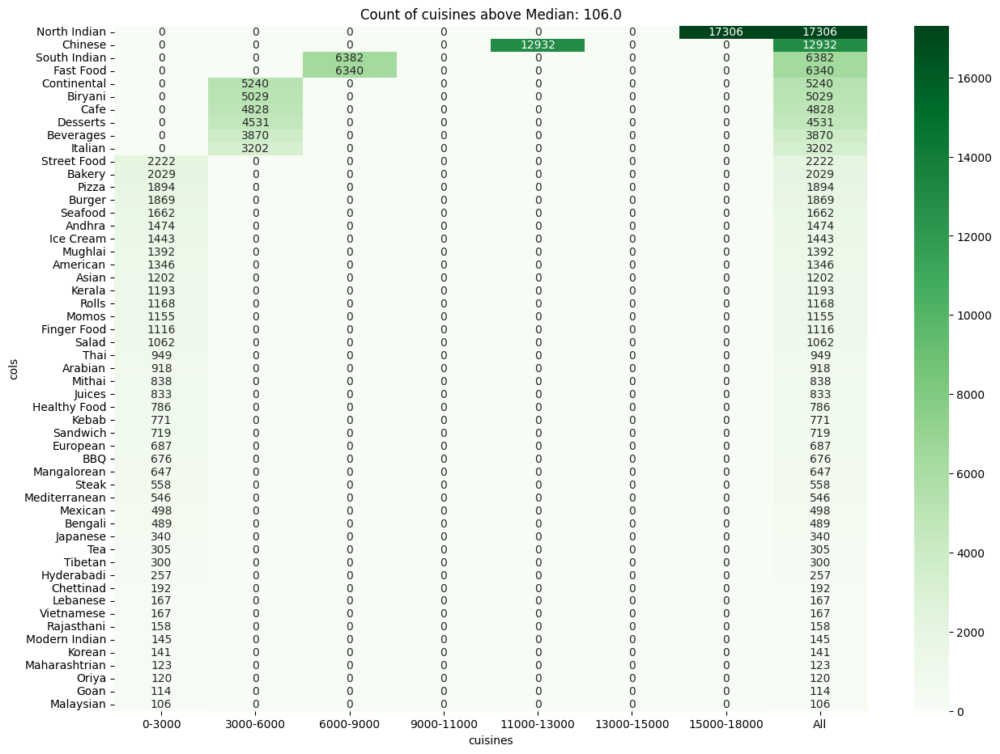

count      105.00
mean     1,010.58
std      2,412.05
min          1.00
25%         23.00
50%        106.00
75%        918.00
max     17,306.00
Name: Count, dtype: float64

(0.00        1.00
 0.20       14.40
 0.40       60.40
 0.50      106.00
 0.75      918.00
 0.95    4,988.80
 0.97    6,208.00
 1.00   17,306.00
 Name: Count, dtype: float64,
 None,
 <Axes: >)

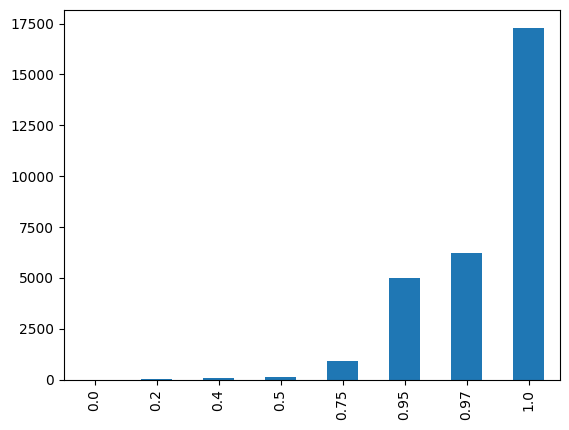

In [67]:
# cuisines Col_Analyzer
cuisines_analyzer = ColAnalysis(
    df,  
    'cuisines', 
    quantile_list=[0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1] , 
    bins_list=[0, 3000, 6000, 9000, 11000, 13000 , 15000 , 18000], 
    labels_list=["0-3000", "3000-6000", "6000-9000", "9000-11000", "11000-13000" , "13000-15000" , "15000-18000"] )  
cuisines_analyzer.analyze()

# Describe Filltered Data
display( cuisines_analyzer.calculate_col_counts()['Count'].describe() )

# Plot Quantiles [0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1]
display( cuisines_analyzer.calculate_col_quantiles())

In [68]:
# cuisines Output
cuisines_analyzer.calculate_col_counts()

,cuisines,Count,binned
0,North Indian,17306,15000-18000
1,Chinese,12932,11000-13000
2,South Indian,6382,6000-9000
3,Fast Food,6340,6000-9000
4,Continental,5240,3000-6000
...,...,...,...
100,Sindhi,4,0-3000
101,Hot dogs,3,0-3000
102,Belgian,3,0-3000
103,Paan,2,0-3000


Text(0.5, 1.0, 'cuisines_analyzer of Quantile Distribution')

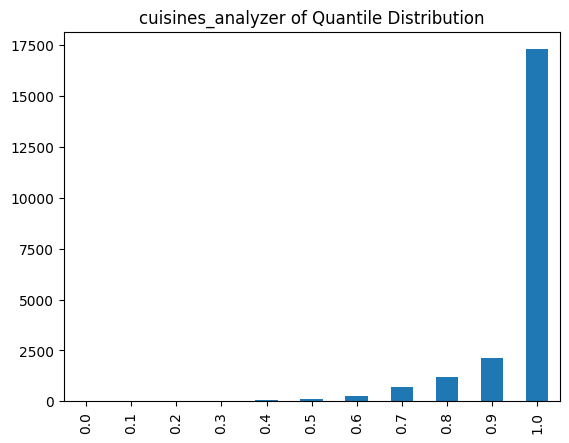

In [69]:
# cuisines 
cuisines_analyzer.calculate_col_counts()['Count'].quantile([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]).plot(kind='bar')
plt.title('cuisines_analyzer of Quantile Distribution')

* Expore Cuisines Under Median from all data

### ⭕️ Approx Cost

In [70]:
df.head(1)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
0,Jalsa,1,1,4.10,775,1,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,[],Buffet,Banashankari


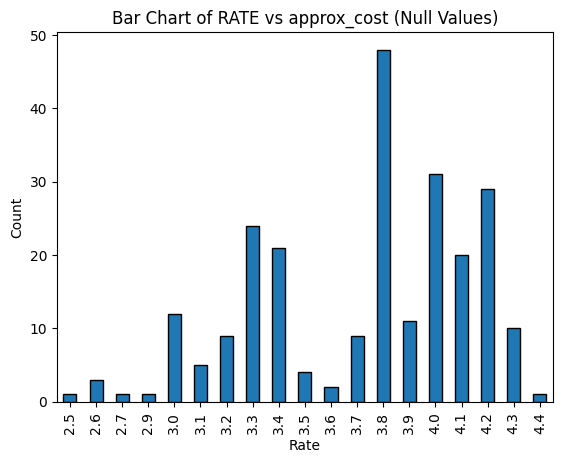

In [71]:
# Explore distribution of null values of "approx_cost"
df[df.approx_cost.isnull()].groupby('rate')['name'].count().plot(kind='bar', edgecolor='black')
plt.xlabel('Rate')
plt.ylabel('Count')
plt.title('Bar Chart of RATE vs approx_cost (Null Values)')
plt.xticks(rotation=90);

In [72]:
# Drop Null Values if "approx_cost"
print("Before Drop" , df.shape)
df.dropna(subset='approx_cost' , inplace=True)
print("After Drop" , df.shape)

Before Drop (41505, 13)
After Drop (41263, 13)


In [73]:
# Final Chcek for null status
df.isnull().sum()

name            0
online_order    0
book_table      0
rate            0
votes           0
phone           0
location        0
rest_type       0
cuisines        0
approx_cost     0
menu_item       0
listed_type     0
listed_city     0
dtype: int64

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41263 entries, 0 to 41664
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          41263 non-null  object 
 1   online_order  41263 non-null  int64  
 2   book_table    41263 non-null  int64  
 3   rate          41263 non-null  float64
 4   votes         41263 non-null  int64  
 5   phone         41263 non-null  int64  
 6   location      41263 non-null  object 
 7   rest_type     41263 non-null  object 
 8   cuisines      41263 non-null  object 
 9   approx_cost   41263 non-null  object 
 10  menu_item     41263 non-null  object 
 11  listed_type   41263 non-null  object 
 12  listed_city   41263 non-null  object 
dtypes: float64(1), int64(4), object(8)
memory usage: 4.4+ MB


In [75]:
df.approx_cost.unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '1,100', '1,600', '230',
       '130', '1,700', '1,350', '2,200', '1,400', '2,000', '1,800',
       '1,900', '180', '330', '2,500', '2,100', '3,000', '2,800', '3,400',
       '50', '40', '1,250', '3,500', '4,000', '2,400', '2,600', '1,450',
       '70', '3,200', '240', '6,000', '1,050', '2,300', '4,100', '120',
       '5,000', '3,700', '1,650', '2,700', '4,500', '80'], dtype=object)

In [76]:
# Defin Function to convert Object type to Float Type
def AppCost (x):
    if "," in x:
        return float(x.replace("," , ""))
    else:
        return float(x)

print("Test Case 1 :" , AppCost ('2,600'))
print("Test Case 2 :" , AppCost ('199'))
print("Test Case 3 :" , AppCost ('4,500'))
print("Final Case Unique :" , df.approx_cost.apply(AppCost).unique().tolist())

Test Case 1 : 2600.0
Test Case 2 : 199.0
Test Case 3 : 4500.0
Final Case Unique : [800.0, 300.0, 600.0, 700.0, 550.0, 500.0, 450.0, 650.0, 400.0, 900.0, 200.0, 750.0, 150.0, 850.0, 100.0, 1200.0, 350.0, 250.0, 950.0, 1000.0, 1500.0, 1300.0, 199.0, 1100.0, 1600.0, 230.0, 130.0, 1700.0, 1350.0, 2200.0, 1400.0, 2000.0, 1800.0, 1900.0, 180.0, 330.0, 2500.0, 2100.0, 3000.0, 2800.0, 3400.0, 50.0, 40.0, 1250.0, 3500.0, 4000.0, 2400.0, 2600.0, 1450.0, 70.0, 3200.0, 240.0, 6000.0, 1050.0, 2300.0, 4100.0, 120.0, 5000.0, 3700.0, 1650.0, 2700.0, 4500.0, 80.0]


In [77]:
# Apply the Function
df.approx_cost = df.approx_cost.apply(AppCost)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41263 entries, 0 to 41664
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          41263 non-null  object 
 1   online_order  41263 non-null  int64  
 2   book_table    41263 non-null  int64  
 3   rate          41263 non-null  float64
 4   votes         41263 non-null  int64  
 5   phone         41263 non-null  int64  
 6   location      41263 non-null  object 
 7   rest_type     41263 non-null  object 
 8   cuisines      41263 non-null  object 
 9   approx_cost   41263 non-null  float64
 10  menu_item     41263 non-null  object 
 11  listed_type   41263 non-null  object 
 12  listed_city   41263 non-null  object 
dtypes: float64(2), int64(4), object(7)
memory usage: 4.4+ MB


### ⭕️ Menu Item

In [78]:
df.sample(3)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
2,San Churro Cafe,1,0,3.80,918,1,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.00,[],Buffet,Banashankari
14365,Pathy's Kitchen,1,0,3.50,21,1,Indiranagar,Quick Bites,Andhra,500.00,[],Delivery,Indiranagar
2172,Steaming Mugs,1,0,3.90,240,1,Basavanagudi,Cafe,Cafe,700.00,[],Delivery,Basavanagudi


In [79]:
# Define Function to convert all menu_item availabilty to "count of menu_item in each resturant" - For testing result
def MENU (x):
    if "[]" in x:
        return 0
    else:
        return 1
print("Test Case 1 :" , MENU( df[df.menu_item != '[]']['menu_item'][:1] ))
print("Final Case Unique :" , df.menu_item.apply(MENU).unique().tolist())
display("Final Case Value Counts :" , df.menu_item.apply(MENU).value_counts().reset_index())

Test Case 1 : 1
Final Case Unique : [0, 1]


'Final Case Value Counts :'

,menu_item,count
0,0,30337
1,1,10926


In [80]:
# Apply Function Menu Items
df.menu_item = df.menu_item.apply(MENU)
df.menu_item.value_counts().reset_index()

,menu_item,count
0,0,30337
1,1,10926


In [81]:
df.sample(5)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
30232,The Flying Squirrel,0,0,4.00,27,1,Brigade Road,Cafe,Cafe,450.00,0,Cafes,Lavelle Road
35463,D-Zaprino,1,0,4.00,449,1,Sanjay Nagar,"Takeaway, Delivery","Fast Food, Pizza",400.00,1,Delivery,New BEL Road
13543,Bindu Garden Bar & Restaurant,1,0,3.10,36,1,HSR,Casual Dining,"North Indian, Chinese",550.00,0,Dine-out,HSR
18639,Sandwichwallas,1,0,3.60,33,1,JP Nagar,Quick Bites,Fast Food,200.00,1,Dine-out,JP Nagar
6419,Aahar Vihar,1,0,4.00,68,1,Marathahalli,Quick Bites,North Indian,250.00,0,Dine-out,Brookefield


### ⭕️ Listed_type

In [82]:
df.listed_type.value_counts()

listed_type
Delivery              20452
Dine-out              14066
Desserts               2709
Cafes                  1511
Drinks & nightlife     1045
Buffet                  848
Pubs and bars           632
Name: count, dtype: int64

### ⭕️ Listed_city

In [83]:
df.listed_city.isnull().sum()

0

In [84]:
df.listed_city.value_counts()

listed_city
BTM                      2586
Koramangala 7th Block    2361
Koramangala 4th Block    2254
Koramangala 5th Block    2250
Koramangala 6th Block    2121
Jayanagar                1918
JP Nagar                 1633
Indiranagar              1538
Church Street            1518
MG Road                  1514
Brigade Road             1483
Lavelle Road             1451
Residency Road           1345
HSR                      1330
Marathahalli             1294
Bannerghatta Road        1208
Whitefield               1201
Old Airport Road         1173
Brookefield              1139
Basavanagudi             1072
Kammanahalli             1020
Sarjapur Road            1018
Kalyan Nagar              993
Bellandur                 956
Frazer Town               953
Malleshwaram              946
Rajajinagar               872
Electronic City           820
Banashankari              727
New BEL Road              569
Name: count, dtype: int64

In [85]:
# Define the function to compare values
def compare(x, y):
    if x == y:
        return 'Match'
    else:
        return 'Not Match'

# Use apply to compare each row
df['Match'] = df.apply(lambda row: compare(row['listed_city'], row['location']), axis=1)

# Display the resulting DataFrame
df[['listed_city', 'location', 'Match']]

,listed_city,location,Match
0,Banashankari,Banashankari,Match
1,Banashankari,Banashankari,Match
2,Banashankari,Banashankari,Match
3,Banashankari,Banashankari,Match
4,Banashankari,Basavanagudi,Not Match
...,...,...,...
41660,Whitefield,Whitefield,Match
41661,Whitefield,Whitefield,Match
41662,Whitefield,Whitefield,Match
41663,Whitefield,"ITPL Main Road, Whitefield",Not Match


In [86]:
df.Match.value_counts()

Match
Not Match    28664
Match        12599
Name: count, dtype: int64

In [87]:
df[df.Match == 'Not Match'][['location' , 'listed_city']]

,location,listed_city
4,Basavanagudi,Banashankari
5,Basavanagudi,Banashankari
6,Mysore Road,Banashankari
29,Basavanagudi,Banashankari
30,Basavanagudi,Banashankari
...,...,...
41595,KR Puram,Whitefield
41597,Brookefield,Whitefield
41632,"ITPL Main Road, Whitefield",Whitefield
41663,"ITPL Main Road, Whitefield",Whitefield


In [88]:
df = df.drop('Match' , axis=1).reset_index(drop = True)

* `No need to drop any of location or listed_city "right now" as they are not duplicate, and may drop them/one of them next during check the correlation.`

In [89]:
# Check & Drop Duplicated
print("✔️ Before Drop" , df.shape)
print("✔️ Duplicated Count" , df.duplicated().sum() )
df.drop_duplicates(inplace=True)
print("✔️ After Drop" , df.shape)

✔️ Before Drop (41263, 13)
✔️ Duplicated Count 58
✔️ After Drop (41205, 13)


## ✅ 03 - Feature Engineering

### 🔻 Create Our Target Based on "Rating" & "Voting" 🔻

In [90]:
df.sample(2)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city
12304,Hammered,1,1,4.70,4678,1,Cunningham Road,"Pub, Cafe","North Indian, Thai, Japanese, Continental, Cafe","1,300.00",0,Dine-out,Frazer Town
897,Darjeeling Momos & Fast Food Center,1,0,3.80,37,1,Bannerghatta Road,Quick Bites,"Fast Food, Momos",250.00,0,Delivery,Bannerghatta Road


In [91]:
# Check Value Count if Create the Target "Score" from 'Rate' Only
def NormalRate(x):
    if x > 3.75:
        return 1
    else:
        return 0
df.rate.apply(NormalRate).value_counts()

rate
0    21159
1    20046
Name: count, dtype: int64

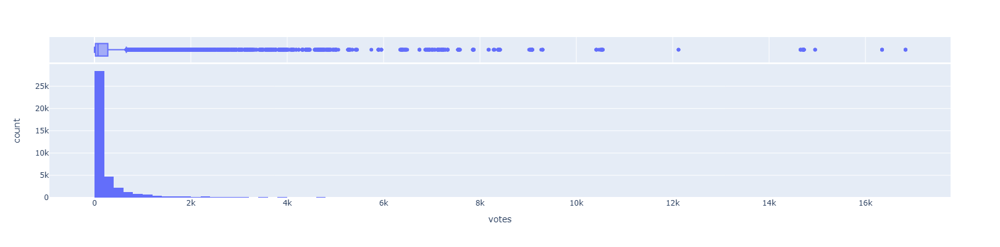

In [92]:
# Check the distribution of Votes
px.histogram(df , 'votes' , width= 900 , height=400 ,nbins=100 ,marginal = 'box' )

* By Check Above, See to Use "Robust Scaling Technique" to normlize both " 'rate' , 'votes' " then change the wight of each one by 70/30 as kpi to include "Vote" in Target output
    * Robust Scaling will handling the outliers at "Votes"

In [93]:
# Apply Robust Scaling Solution
Scaling = 'Robust Scaling'

# Normalize the data using Robust Scaling
scaler = RobustScaler()
df[['rate_1', 'votes_1']] = scaler.fit_transform(df[['rate', 'votes']])
print(f"\nNormalize the data (({Scaling}))")
display(df.sample(2))

# Create a composite score
df['score'] = df['rate'] * 0.7 + df['votes'] * 0.3
print(f"\nCreate a composite score (({Scaling}))")
display(df.sample(2))

# Define threshold and create target
threshold = df['score'].median()
print("median=" , threshold)

df['score'] = df['score'].apply(lambda x: 1 if x >= threshold else 0)

print(f"\nDefine threshold and create target (({Scaling}))")
df.sample(2)


Normalize the data ((Robust Scaling))


,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,rate_1,votes_1
11035,Pugals Biriyani,0,0,3.60,25,1,Electronic City,Quick Bites,"Kerala, Biryani, Chinese, North Indian",400.00,0,Delivery,Electronic City,-0.17,-0.19
13065,Sip N Bite,0,0,3.30,11,1,Bommanahalli,Quick Bites,"Fast Food, North Indian, South Indian, Chinese",300.00,0,Delivery,HSR,-0.67,-0.24



Create a composite score ((Robust Scaling))


,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,rate_1,votes_1,score
22509,Tibetan Mother's Kitchen,1,0,4.00,960,1,Koramangala 7th Block,Casual Dining,"Tibetan, Chinese, Momos",500.00,0,Dine-out,Koramangala 4th Block,0.50,3.46,290.80
22603,Cafemoto,1,0,4.00,201,1,Koramangala 5th Block,Cafe,"Cafe, Continental, Italian, Burger",800.00,1,Dine-out,Koramangala 4th Block,0.50,0.50,63.10


median= 24.56

Define threshold and create target ((Robust Scaling))


,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,rate_1,votes_1,score
1370,Kulfi & More,1,0,3.70,46,1,BTM,Dessert Parlor,"Ice Cream, Desserts, Juices",150.00,0,Delivery,Bannerghatta Road,0.00,-0.11,0
24891,Gallop Bar - Davanam Sarovar Portico Suites,0,0,3.50,11,1,Koramangala 2nd Block,Lounge,Finger Food,"1,600.00",0,Dine-out,Koramangala 5th Block,-0.33,-0.24,0


In [94]:
# drop 'rate_1','votes_1'
df.drop(['rate_1','votes_1'] , axis=1 , inplace=True)
df.sample(3) 

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,score
22805,Falafel's - The Lebanese Haus,0,0,2.90,53,1,Koramangala 7th Block,Quick Bites,Lebanese,300.00,0,Dine-out,Koramangala 4th Block,0
25618,Savoury - Sea Shell Restaurant,1,0,3.90,468,1,BTM,Casual Dining,"Arabian, North Indian, Chinese, Fast Food",700.00,1,Delivery,Koramangala 6th Block,1
34287,Sri Rama,0,0,3.20,4,0,Shivajinagar,Quick Bites,South Indian,200.00,0,Delivery,MG Road,0


In [95]:
# Values count for new Feature "Score" NEW TARGET
df.score.value_counts()

score
1    20610
0    20595
Name: count, dtype: int64

* ✌️ Balance Data ✌️

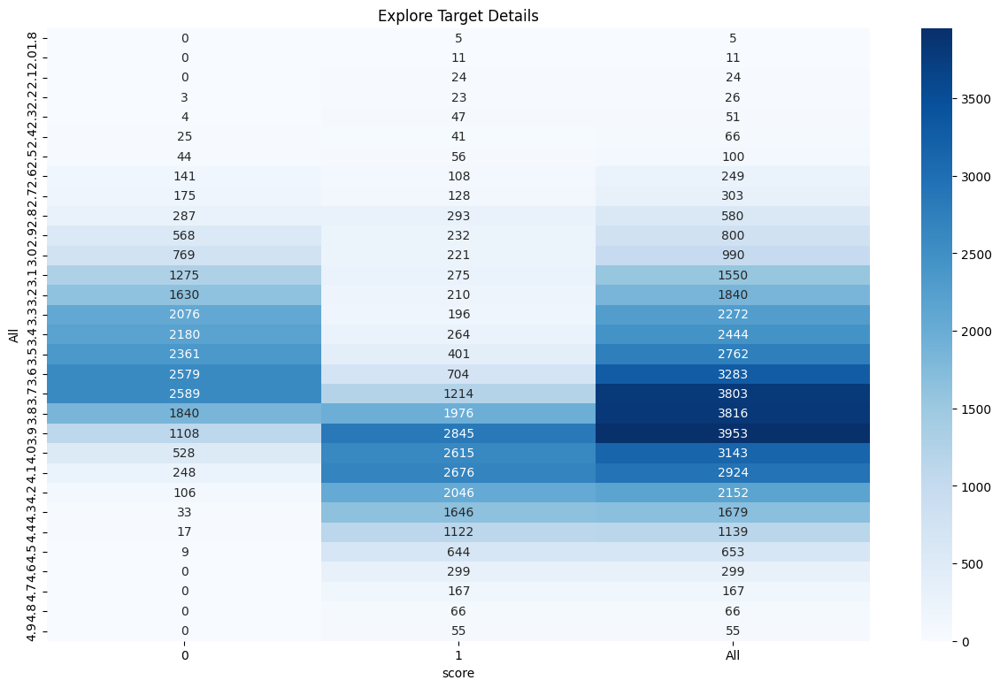

In [96]:
# Explore Target Details
Target_Details = pd.crosstab(df['rate'] , columns= df['score'] , values= df['name'] , aggfunc='count' ).replace(np.nan , 0)
Target_Details['All'] = Target_Details.sum(axis=1)
HeatMapp(Target_Details , "Explore Target Details" , 'score' , 'All', "Blues")

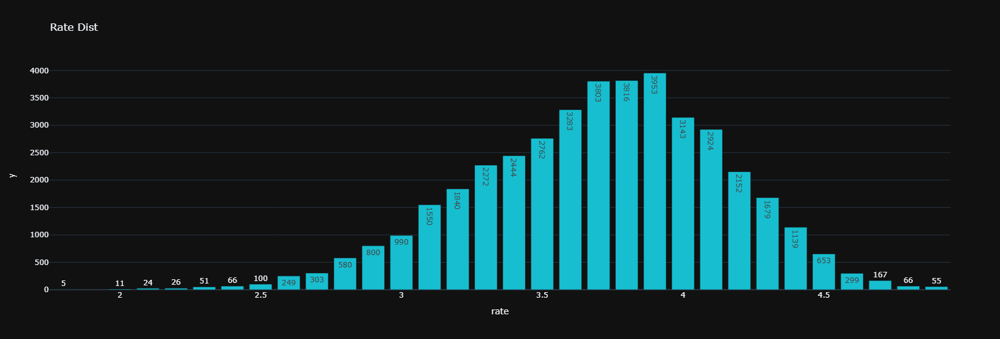

In [97]:
# Explore the Rate Count in BarChart
RateDist = df.groupby('rate')['name'].count()
px.bar(RateDist , x = RateDist.index , y = RateDist.values, width=800 , height=550 , 
       text_auto=True , template = 'plotly_dark', color_discrete_sequence = px.colors.qualitative.D3_r , title='Rate Dist')

#### ✔️ RowCount for EDA

In [98]:
df['RowCount'] = 1
df.sample(3)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,score,RowCount
19831,New York Burrito,0,0,3.10,7,1,Banaswadi,Quick Bites,Mexican,400.00,0,Dine-out,Kalyan Nagar,0,1
25471,Starbucks,0,0,4.10,1359,0,Koramangala 7th Block,Cafe,"Cafe, Desserts",700.00,0,Cafes,Koramangala 6th Block,1,1
11525,Cafe Arabica,0,0,4.10,147,1,Frazer Town,"Quick Bites, Bakery","Cafe, Bakery",700.00,0,Cafes,Frazer Town,1,1


#### ✔️ rateRange for EDA

In [99]:
# rateRange
Bins = [0 ,1, 2, 3, 4, 5]
Labes = ['0-1','1-2','2-3', '3-4', '4-5']
df['rateRange'] = pd.cut(df['rate'] ,bins=Bins , labels=Labes )
df['rateRange'].value_counts().sort_index()

rateRange
0-1        0
1-2       16
2-3     3189
3-4    28866
4-5     9134
Name: count, dtype: int64

#### ✔️ approx_cost_Range for EDA

In [100]:
# approx_cost
AC_Bins = [0 , 100 , 200 , 500, 1000, 2000, 3000, 4000, 5000, 6000]
AC_Labes = ['0 : 100' , '100 : 200' , '200 : 500' , '500 : 1000', '1000 : 2000', '2000 : 3000', '3000 : 4000', '4000 : 5000', '5000 : 6000']
df['approx_cost_Range'] = pd.cut(df['approx_cost'] ,bins=AC_Bins , labels=AC_Labes )
df['approx_cost_Range'].value_counts().sort_index()

approx_cost_Range
0 : 100          652
100 : 200       4493
200 : 500      19290
500 : 1000     11655
1000 : 2000     4499
2000 : 3000      537
3000 : 4000       70
4000 : 5000        7
5000 : 6000        2
Name: count, dtype: int64

#### ✔️ Votes_Range for EDA

In [101]:
df.votes.describe()

count   41,205.00
mean       352.13
std        883.41
min          0.00
25%         21.00
50%         73.00
75%        277.00
max     16,832.00
Name: votes, dtype: float64

In [102]:
# Votes
votes_Bins = [df['votes'].min(), 1000, 3000, 5000, 7000, 9000, 11000, 13000, 15000,df['votes'].max()]
votes_Labels = ['0 : 1000', '1000 : 3000', '3000 : 5000', '5000 : 7000', '7000 : 9000', '9000 : 11000', '11000 : 13000', '13000 : 15000', '15000 : 17000']

# Create the 'votes_Range' feature
df['votes_Range'] = pd.cut(df['votes'], bins=votes_Bins, labels=votes_Labels)
display(df['votes_Range'].value_counts().sort_index())

print('')
print("Total Null : ",df.votes_Range.isnull().sum())

votes_Range
0 : 1000         37583
1000 : 3000       2802
3000 : 5000        567
5000 : 7000         89
7000 : 9000         80
9000 : 11000        40
11000 : 13000        2
13000 : 15000       17
15000 : 17000        6
Name: count, dtype: int64


Total Null :  19


In [103]:
df[df.votes_Range.isnull()][['votes' , 'votes_Range']]

,votes,votes_Range
392,0,NaN
6591,0,NaN
16788,0,NaN
16797,0,NaN
16812,0,NaN
16827,0,NaN
16899,0,NaN
16903,0,NaN
16916,0,NaN
16940,0,NaN


In [104]:
df['votes_Range'] = df.votes_Range.fillna('0 : 1000')

In [105]:
df[df.votes_Range.isnull()][['votes' , 'votes_Range']]

,votes,votes_Range


In [106]:
display(df['votes_Range'].value_counts().sort_index())

votes_Range
0 : 1000         37602
1000 : 3000       2802
3000 : 5000        567
5000 : 7000         89
7000 : 9000         80
9000 : 11000        40
11000 : 13000        2
13000 : 15000       17
15000 : 17000        6
Name: count, dtype: int64

#### ✔️ Test get_dmuies Solution for (Cuisines)
    ☑️ By Testing get_dmuies Solution, See that a big number of Columns has been created.
        And by check the Correlation found that almost columns has poor Correlation.
        So this solution will effect to underfitting on Modeling, So we reject it.

In [107]:
# Copy DF
NDF = df.copy()
NDF.drop(['rate' , 'votes', 'RowCount', 'rateRange'] , axis = 1 , inplace = True)

# Split Step
cuisines_split = NDF['cuisines'].str.get_dummies(sep = ', ')

# Combine Step
NDF = pd.concat([NDF , cuisines_split , cuisines_split] , axis = 1)

# Drop Old Data Step
NDF.drop(['cuisines'] , axis = 1 , inplace = True)

# remove duplicate columns
NDF = NDF.loc[:, ~NDF.columns.duplicated()]

# Display the combined DataFrame
display(NDF.sample(3))

,name,online_order,book_table,phone,location,rest_type,approx_cost,menu_item,listed_type,listed_city,...,Sushi,Tamil,Tea,Tex-Mex,Thai,Tibetan,Turkish,Vegan,Vietnamese,Wraps
3556,Smokin Bites,1,0,1,Sarjapur Road,Quick Bites,200.00,0,Delivery,Bellandur,...,0,0,0,0,0,0,0,0,0,0
40054,Amruth Parkland,0,0,1,Sarjapur Road,"Bar, Casual Dining",900.00,0,Pubs and bars,Sarjapur Road,...,0,0,0,0,0,0,0,0,0,0
30584,Baskin Robbins,1,0,1,Church Street,Dessert Parlor,250.00,1,Desserts,Lavelle Road,...,0,0,0,0,0,0,0,0,0,0


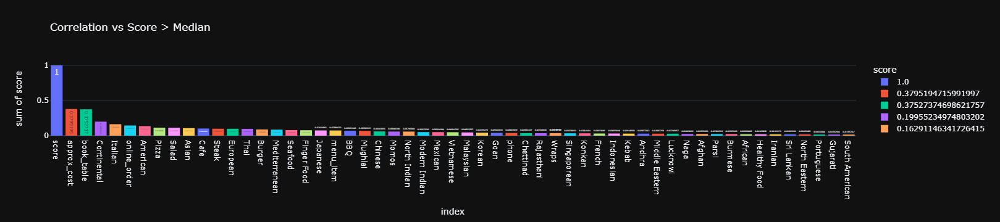

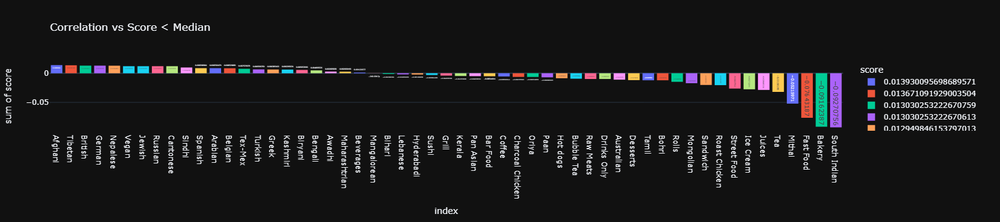

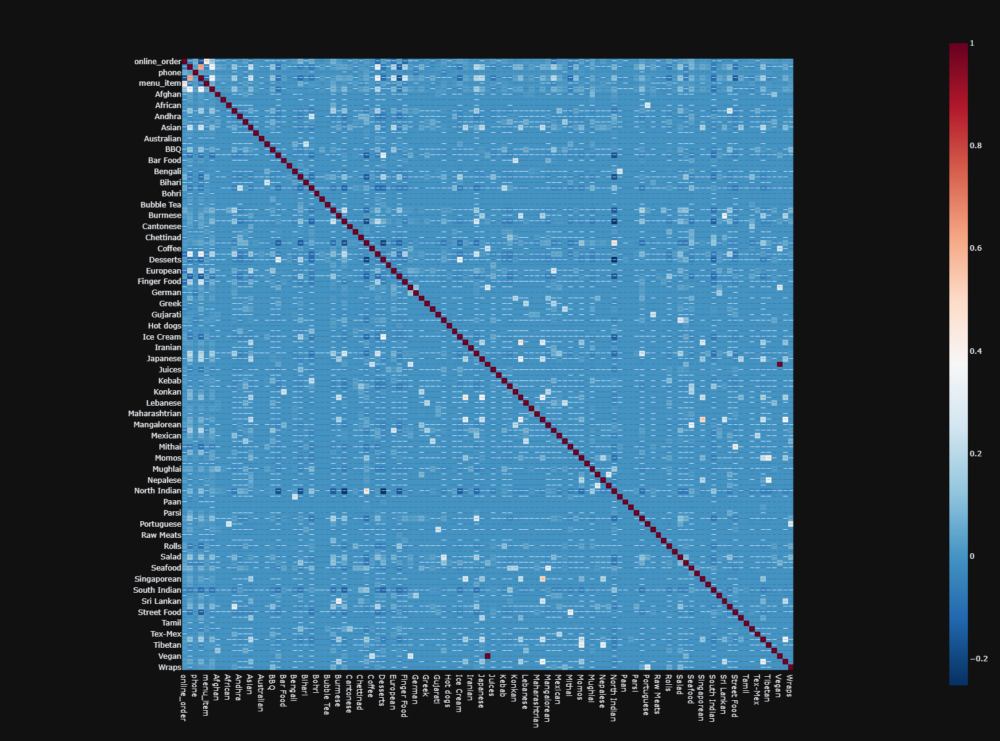

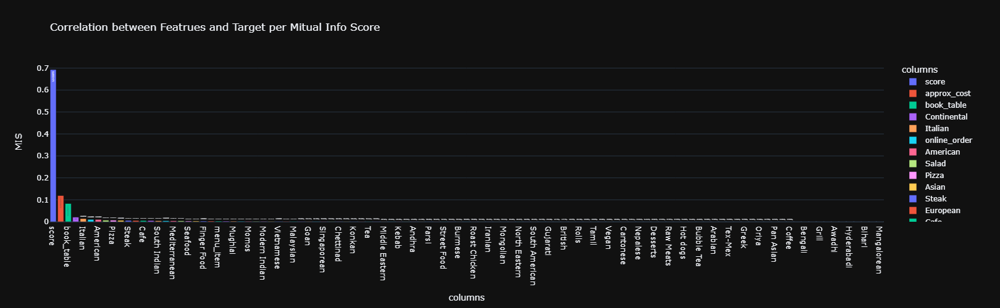

In [108]:
# Check Correlation
# MIS : Is a Function to explore the correlation rete between feature and target

Corr = NDF.select_dtypes(include = 'number').corr()['score'].sort_values(ascending = False).reset_index()

# Correlation vs Score > Median
px.histogram(Corr[Corr['score'] > Corr['score'].median()] , x= 'index' , y='score' , text_auto = True , color = 'score' , title = 'Correlation vs Score > Median', template='plotly_dark').show()
print('')

# Correlation vs Score < Median
px.histogram(Corr[Corr['score'] < Corr['score'].median()] , x= 'index' , y='score' , text_auto = True , color = 'score' , title = 'Correlation vs Score < Median', template='plotly_dark').show()
print("")

# Correlation imshow
px.imshow(NDF.select_dtypes(include = 'number').corr() , template='plotly_dark',width=1200,height=1200,color_continuous_scale='RdBu_r', text_auto=True).show()
print("")

MIScore_NDF = NDF.select_dtypes(include= 'number').apply(MIS).sort_values(ascending=False).reset_index().rename(columns={"index" : "columns" , 0 : "MIS"})
px.bar(MIScore_NDF , x='columns' , y='MIS' , text_auto=True , template="plotly_dark" , color="columns" , width=900 , height=500, title = 'Correlation between Featrues and Target per Mitual Info Score')

#### ✔️ Grouping Solution (Cuisines) - (The Best)

In [109]:
# Define cuisine groups as dictionaries
cuisine_groups = {
    'Total_North_Indian': ['Awadhi', 'Bihari', 'Kashmiri', 'Lucknowi', 'Mughlai', 'Punjabi', 'Rajasthani'],
    'Total_South_Indian': ['Andhra', 'Chettinad', 'Hyderabadi', 'Kerala', 'Mangalorean', 'Tamil', 'Udupi'],
    'Total_East_Indian':  ['Assamese', 'Bengali', 'Oriya'],
    'Total_West_Indian':  ['Gujarati', 'Maharashtrian', 'Goan', 'Sindhi'],
    'Total_International':['American', 'British', 'French', 'German', 'Greek', 'Italian', 'Japanese', 'Lebanese',
                              'Mediterranean', 'Mexican', 'Portuguese', 'Spanish', 'Turkish', 'Vietnamese', 'Russian',
                              'South American', 'Sri Lankan', 'Tibetan', 'Middle Eastern', 'Asian', 'European'],
    'Total_Asian': ['Burmese', 'Cantonese', 'Chinese', 'Indonesian', 'Korean', 'Mongolian', 'Nepali', 'North Eastern',
                          'Pan Asian', 'Singaporean', 'Thai', 'Tibetan', 'Vietnamese', 'Japanese'],
    'Total_Grill/BBQ/Bar_Food': ['BBQ', 'Bar Food', 'Charcoal Chicken', 'Grill', 'Kebab', 'Roast Chicken', 'Rolls', 'Steak'],
    'Total_Fast_Food': ['Burger', 'Fast Food', 'Finger Food', 'Hot dogs', 'Sandwich', 'Street Food', 'Wraps', 'Tex-Mex'],
    'Total_Beverages/Desserts': ['Beverages', 'Bubble Tea', 'Coffee', 'Desserts', 'Ice Cream', 'Juices', 'Mithai', 'Paan', 'Tea'],
    'Total_Healthy/Fusion': ['Healthy Food', 'Vegan', 'Modern Indian', 'Salad'],
    'Total_Bakery': ['Bakery', 'Parsi', 'Cake', 'Sweets']}

# Function to map and count cuisines for each group
def count_cuisines_per_group(cuisines):
    cuisines_list = [c.strip() for c in cuisines.split(',')]
    group_counts = {group: 0 for group in cuisine_groups}
    
    for cuisine in cuisines_list:
        for group, cuisine_types in cuisine_groups.items():
            if cuisine in cuisine_types:
                group_counts[group] += 1
    
    return group_counts

# Apply the function to the 'cuisines' column and create a DataFrame with the counts for each group
df_counts = df['cuisines'].apply(count_cuisines_per_group).apply(pd.Series)

# Add the counts back to the original DataFrame
df_2 = pd.concat([df, df_counts], axis=1)
df_2.drop('cuisines' , axis=1 , inplace=True)

# Display the updated DataFrame with cuisine counts per group
df_2.sample (5).T

,32060,32374,40222,31568,16798
name,Pure & Natural,Yo! Chow,Spicy Onion,Shree Guru Sagar Fast Food,Kailash Parbat
online_order,0,1,1,1,0
book_table,0,1,0,0,0
rate,2.60,4.40,3.60,3.60,3.90
votes,30,1810,30,28,79
phone,1,1,1,1,1
location,Malleshwaram,Marathahalli,Whitefield,Rajajinagar,Jayanagar
rest_type,Quick Bites,Casual Dining,Casual Dining,Quick Bites,Food Court
approx_cost,500.00,800.00,400.00,300.00,"1,200.00"
menu_item,0,0,0,1,0


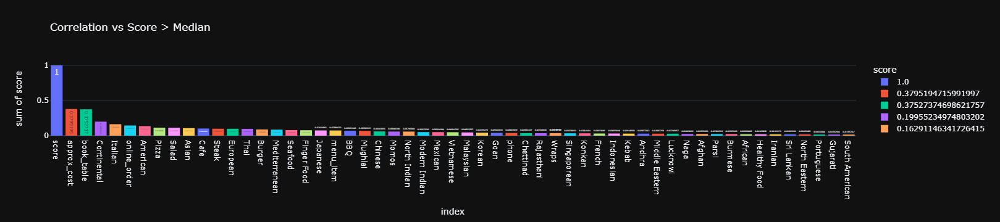

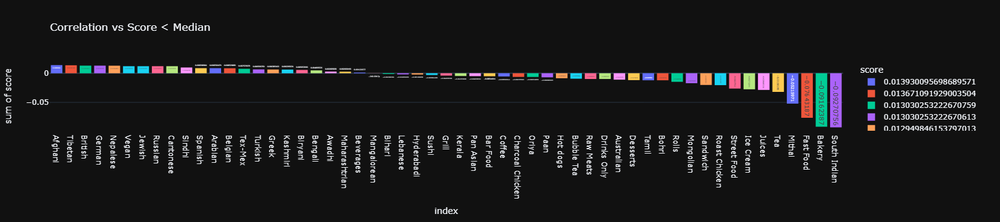

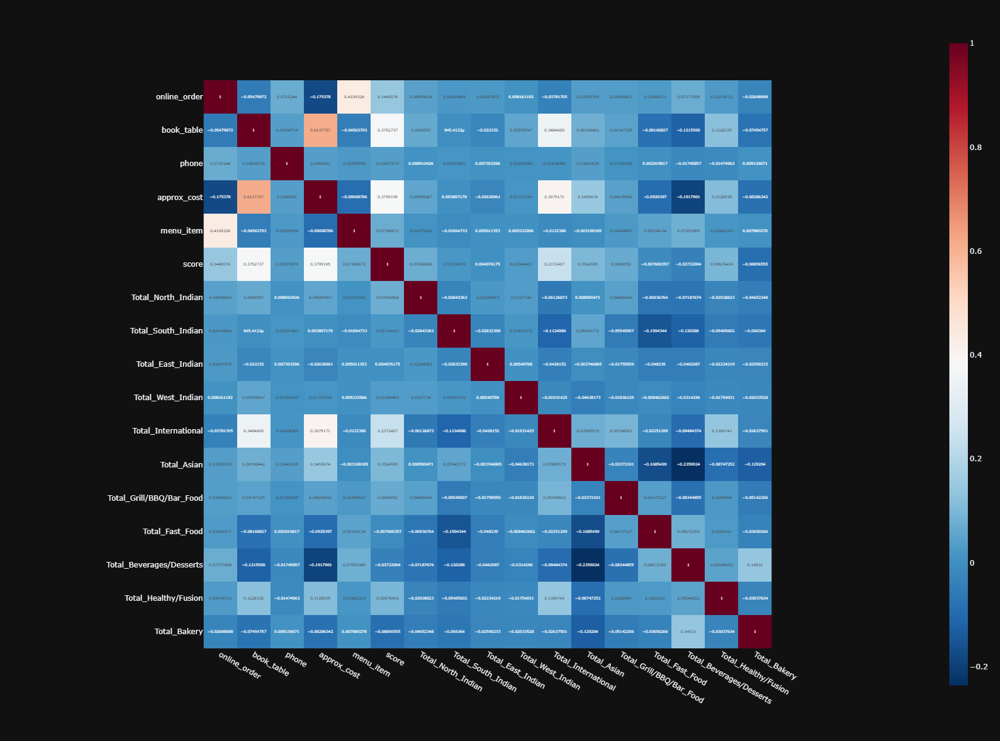

In [110]:
# Check Correlation
Corr_df_2 = NDF.select_dtypes(include = 'number').corr()['score'].sort_values(ascending = False).reset_index()

# Correlation vs Score > Median
px.histogram(Corr_df_2[Corr_df_2['score'] > Corr_df_2['score'].median()] , x= 'index' , y='score' , text_auto = True , color = 'score' , title = 'Correlation vs Score > Median', template='plotly_dark').show()
print('')

# Correlation vs Score < Median
px.histogram(Corr_df_2[Corr_df_2['score'] < Corr_df_2['score'].median()] , x= 'index' , y='score' , text_auto = True , color = 'score' , title = 'Correlation vs Score < Median', template='plotly_dark').show()
print("")

# Correlation imshow
px.imshow(df_2.select_dtypes(include = 'number').drop(['RowCount' , 'votes' , 'rate'] , axis=1).corr() , template='plotly_dark',width=1200,height=1200,color_continuous_scale='RdBu_r', text_auto=True).show()

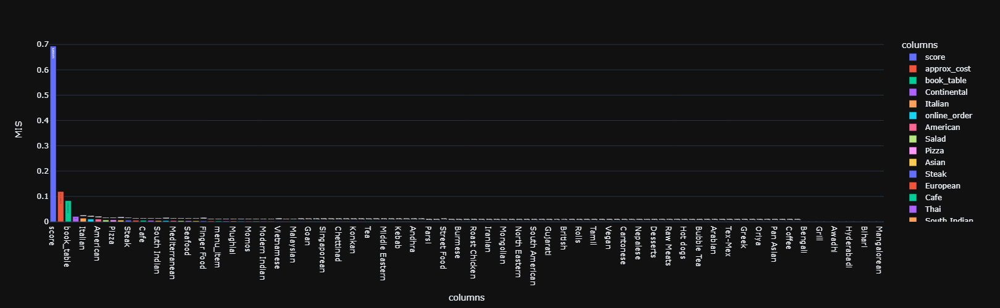

In [111]:
# mutual_info_score
MIScore = NDF.select_dtypes(include= 'number').apply(MIS).sort_values(ascending=False).reset_index().rename(columns={"index" : "columns" , 0 : "MIS"})
px.bar(MIScore , x='columns' , y='MIS' , text_auto=True , template="plotly_dark" , color="columns" , width=900 , height=500)

#### ✔️ Apply get_dumuies for (rest_type)

In [112]:
df.sample(2)

,name,online_order,book_table,rate,votes,phone,location,rest_type,cuisines,approx_cost,menu_item,listed_type,listed_city,score,RowCount,rateRange,approx_cost_Range,votes_Range
17530,Bhavani Chats,1,0,3.60,34,1,Bannerghatta Road,Quick Bites,Street Food,100.00,1,Delivery,JP Nagar,0,1,3-4,0 : 100,0 : 1000
33362,Chatorezz,1,0,3.60,26,1,Marathahalli,Quick Bites,"North Indian, Chinese",250.00,0,Dine-out,Marathahalli,0,1,3-4,200 : 500,0 : 1000


In [113]:
# explode all Rest_Type Contains
df['rest_type'].str.split(', ').explode().str.strip().unique()

array(['Casual Dining', 'Cafe', 'Quick Bites', 'Delivery', 'Mess',
       'Dessert Parlor', 'Bakery', 'Pub', 'Takeaway', 'Fine Dining',
       'Beverage Shop', 'Sweet Shop', 'Bar', 'Kiosk', 'Food Truck',
       'Microbrewery', 'Lounge', 'Food Court', 'Dhaba', 'Club',
       'Irani Cafee', 'Confectionery', 'Bhojanalya', 'Meat Shop'],
      dtype=object)

In [114]:
# Step 1: Explode the 'rest_type' column and get unique values
Rest_Test_DF = df.copy()
rest_types_group = Rest_Test_DF['rest_type'].str.split(', ').explode().str.strip().unique().tolist()

# Split Step
Rest_split = Rest_Test_DF['rest_type'].str.get_dummies(sep = ', ')
Rest_split.columns = [f'Rest_{col}' for col in Rest_split.columns]

# Combine Step
Rest_Test_DF_1 = pd.concat([Rest_Test_DF , Rest_split] , axis = 1)

# Drop Old Data Step
Rest_Test_DF_1.drop(['rest_type'] , axis = 1 , inplace = True)

# remove duplicate columns
# Rest_Test_DF_1 = Rest_Test_DF_1.loc[:, ~Rest_Test_DF_1.columns.duplicated()]

# Display the combined DataFrame
display(Rest_Test_DF_1.sample(3).T)
display(Rest_Test_DF_1.describe().T)

,31404,7813,1988
name,Gullu's Chat,Cafe Fattoush,Sea Green Cafe
online_order,1,1,0
book_table,0,0,0
rate,3.70,3.80,3.30
votes,594,24,4
phone,1,1,1
location,Seshadripuram,BTM,Banashankari
cuisines,"Fast Food, Street Food, Juices","Cafe, Lebanese","Cafe, Fast Food, Beverages"
approx_cost,250.00,700.00,500.00
menu_item,1,0,0


,count,mean,std,min,25%,50%,75%,max
online_order,"41,205.00",0.66,0.47,0.00,0.00,1.00,1.00,1.00
book_table,"41,205.00",0.15,0.36,0.00,0.00,0.00,0.00,1.00
rate,"41,205.00",3.70,0.44,1.80,3.40,3.70,4.00,4.90
votes,"41,205.00",352.13,883.41,0.00,21.00,73.00,277.00,"16,832.00"
phone,"41,205.00",0.99,0.12,0.00,1.00,1.00,1.00,1.00
approx_cost,"41,205.00",603.62,464.70,40.00,300.00,500.00,750.00,"6,000.00"
menu_item,"41,205.00",0.26,0.44,0.00,0.00,0.00,1.00,1.00
score,"41,205.00",0.50,0.50,0.00,0.00,1.00,1.00,1.00
RowCount,"41,205.00",1.00,0.00,1.00,1.00,1.00,1.00,1.00
Rest_Bakery,"41,205.00",0.03,0.18,0.00,0.00,0.00,0.00,1.00


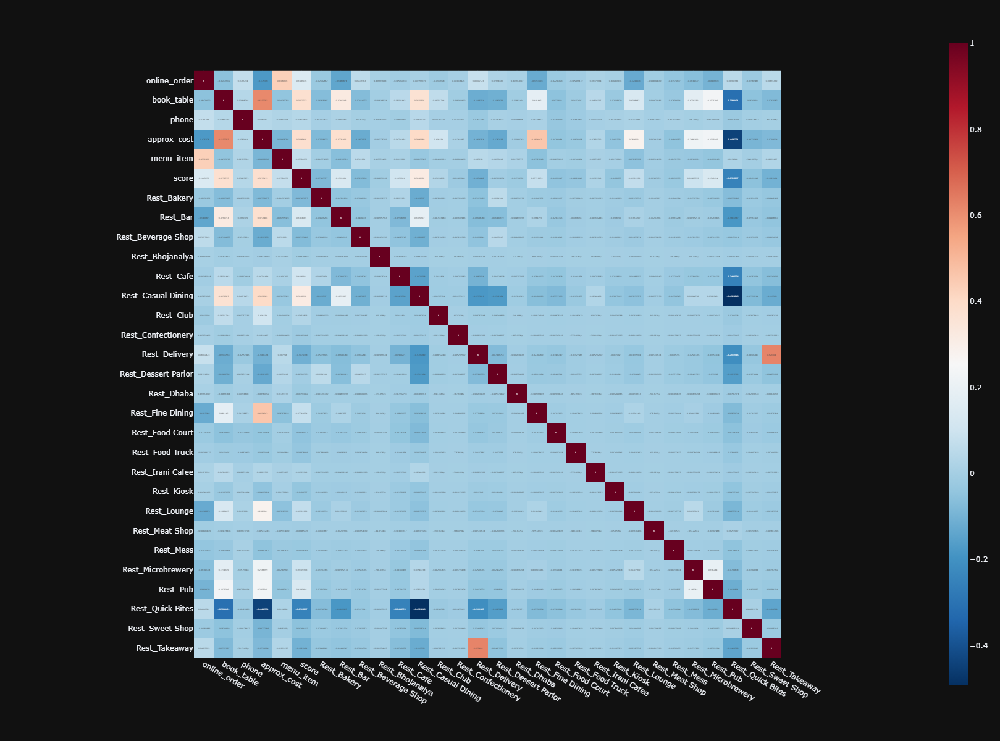

In [115]:
# Correlation imshow
px.imshow(Rest_Test_DF_1.select_dtypes(include = 'number').drop(['RowCount' , 'votes' , 'rate'] , axis=1).corr() , template='plotly_dark',width=1200,height=1200,color_continuous_scale='RdBu_r', text_auto=True).show()

#### ☑️ Apply The Actions `(Cuisines "Apply Summetion Funaction" , Rest_Type "Get_Dumies" (For testing) )`

In [116]:
df['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ..., 'Tibetan, Nepalese',
       'North Indian, Street Food, Biryani',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [117]:
# Apply the function to the 'cuisines' column and create a DataFrame with the counts for each group
df_counts = df['cuisines'].apply(count_cuisines_per_group).apply(pd.Series)

# Add the counts back to the original DataFrame
df = pd.concat([df, df_counts], axis=1)

# Apply ge_dumies on rest_type
rest_types_group = Rest_Test_DF['rest_type'].str.split(', ').explode().str.strip().unique().tolist()

# Split Step
Rest_split = Rest_Test_DF['rest_type'].str.get_dummies(sep = ', ')
Rest_split.columns = [f'Rest_{col}' for col in Rest_split.columns]

# Combine Step
df = pd.concat([df , Rest_split] , axis = 1)

# remove duplicate columns
df = df.loc[:, ~df.columns.duplicated()]

df.head(1).T

,0
name,Jalsa
online_order,1
book_table,1
rate,4.10
votes,775
phone,1
location,Banashankari
rest_type,Casual Dining
cuisines,"North Indian, Mughlai, Chinese"
approx_cost,800.00


In [118]:
df.columns.tolist()

['name',
 'online_order',
 'book_table',
 'rate',
 'votes',
 'phone',
 'location',
 'rest_type',
 'cuisines',
 'approx_cost',
 'menu_item',
 'listed_type',
 'listed_city',
 'score',
 'RowCount',
 'rateRange',
 'approx_cost_Range',
 'votes_Range',
 'Total_North_Indian',
 'Total_South_Indian',
 'Total_East_Indian',
 'Total_West_Indian',
 'Total_International',
 'Total_Asian',
 'Total_Grill/BBQ/Bar_Food',
 'Total_Fast_Food',
 'Total_Beverages/Desserts',
 'Total_Healthy/Fusion',
 'Total_Bakery',
 'Rest_Bakery',
 'Rest_Bar',
 'Rest_Beverage Shop',
 'Rest_Bhojanalya',
 'Rest_Cafe',
 'Rest_Casual Dining',
 'Rest_Club',
 'Rest_Confectionery',
 'Rest_Delivery',
 'Rest_Dessert Parlor',
 'Rest_Dhaba',
 'Rest_Fine Dining',
 'Rest_Food Court',
 'Rest_Food Truck',
 'Rest_Irani Cafee',
 'Rest_Kiosk',
 'Rest_Lounge',
 'Rest_Meat Shop',
 'Rest_Mess',
 'Rest_Microbrewery',
 'Rest_Pub',
 'Rest_Quick Bites',
 'Rest_Sweet Shop',
 'Rest_Takeaway']

In [119]:
# check null / duplicated
print("Null Values : " , df.isnull().sum())
print("duplicated rows count : " , df.duplicated().sum())

Null Values :  name                        0
online_order                0
book_table                  0
rate                        0
votes                       0
phone                       0
location                    0
rest_type                   0
cuisines                    0
approx_cost                 0
menu_item                   0
listed_type                 0
listed_city                 0
score                       0
RowCount                    0
rateRange                   0
approx_cost_Range           0
votes_Range                 0
Total_North_Indian          0
Total_South_Indian          0
Total_East_Indian           0
Total_West_Indian           0
Total_International         0
Total_Asian                 0
Total_Grill/BBQ/Bar_Food    0
Total_Fast_Food             0
Total_Beverages/Desserts    0
Total_Healthy/Fusion        0
Total_Bakery                0
Rest_Bakery                 0
Rest_Bar                    0
Rest_Beverage Shop          0
Rest_Bhojanalya          

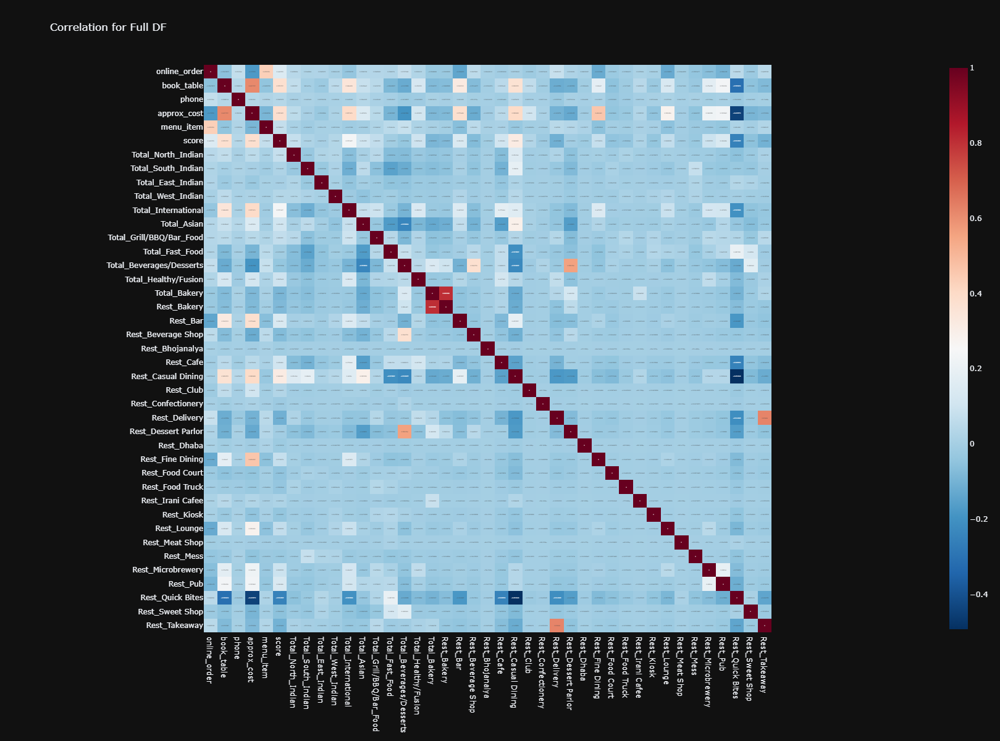

In [120]:
# Correlation imshow
px.imshow(df.select_dtypes(include = 'number').drop(['RowCount' , 'votes' , 'rate'] , axis=1).corr() , 
          template='plotly_dark',width=1200,height=1200,color_continuous_scale='RdBu_r', text_auto=True ,
          title = 'Correlation for Full DF').show()

#### ☑️ Apply Plan 3 The Actions `(Rest_Type "Apply Summetion Funaction")`

In [121]:
df.rest_type.unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Dessert Parlor, Sweet Shop', 'Bakery, Quick Bites',
       'Sweet Shop, Quick Bites', 'Kiosk', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Beverage Shop, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Microbrewery, Casual Dining', 'Lounge',
       'Bar, Casual Dining', 'Food Court', 'Cafe, Bakery', 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Quick Bites, Beverage Shop',
       'Pub, Bar', 'Casual Dining, Pub', 'Lounge, Bar',
       'Dessert Parlor, Quick Bites', 'Food Court, 

In [122]:
# Split, explode, strip, and calculate value counts for all rest types
rest_type_counts = df.rest_type.str.split(', ').explode().str.strip().value_counts().reset_index()

# Rename columns for clarity
rest_type_counts.columns = ['rest_type', 'count']

# List of specific rest types to filter for
rest_types_list = ['Cafe', 'Casual Dining', 'Dhaba', 'Fine Dining', 'Food Court', 'Mess', 'Quick Bites']

# Filter the dataframe for only the specified rest types
filtered_rest_type_counts = rest_type_counts[rest_type_counts['rest_type'].isin(rest_types_list)]

# Display the result
display(filtered_rest_type_counts)

,rest_type,count
0,Quick Bites,15124
1,Casual Dining,12165
2,Cafe,4601
11,Food Court,612
13,Fine Dining,400
15,Mess,184
19,Dhaba,17


In [123]:
df.rest_type.str.split(', ').explode().str.strip().value_counts().reset_index()

,rest_type,count
0,Quick Bites,15124
1,Casual Dining,12165
2,Cafe,4601
3,Delivery,2943
4,Dessert Parlor,2695
5,Bar,2265
6,Bakery,1387
7,Takeaway,1356
8,Beverage Shop,1128
9,Pub,903


In [124]:
# Copy Testing DF
df_1 = df.copy().drop(['Rest_Bakery' , 'Rest_Bar' , 'Rest_Beverage Shop' , 'Rest_Bhojanalya' , 'Rest_Cafe' , 'Rest_Casual Dining' , 'Rest_Club' , 'Rest_Confectionery' , 'Rest_Delivery' ,
'Rest_Dessert Parlor'	, 'Rest_Dhaba' , 'Rest_Dhaba' , 'Rest_Food Court' , 'Rest_Food Truck' , 'Rest_Irani Cafee' , 'Rest_Kiosk' ,
'Rest_Lounge' , 'Rest_Meat Shop'	, 'Rest_Mess' , 'Rest_Microbrewery', 'Rest_Pub' , 'Rest_Quick Bites' , 'Rest_Sweet Shop' , 'Rest_Takeaway'] , axis=1 )

# Define cuisine groups as dictionaries
rest_type_groups = {
    'Rest_SweetOrBakery': ['Bakery', 'Confectionery', 'Dessert Parlor', 'Sweet Shop'],
    'Rest_Drink_Oriented_Establishments': ['Bar', 'Club', 'Lounge', 'Microbrewery', 'Pub'],
    'Rest_Specialty_Shops': ['Beverage Shop', 'Bhojanalya', 'Food Truck', 'Irani Cafee', 'Kiosk', 'Meat Shop'],
    'Rest_Dining_Establishments': ['Cafe', 'Casual Dining', 'Dhaba', 'Fine Dining', 'Food Court', 'Mess', 'Quick Bites'],
    'Rest_Takeaway_and_Delivery': ['Delivery', 'Takeaway']
}

# Function to map and count restaurant types for each group
def count_rest_type_per_group(rest_type):
    rest_type_list = [c.strip() for c in rest_type.split(', ')]
    group_counts = {group: 0 for group in rest_type_groups}
    
    # Count occurrences of each restaurant type
    for rest_type in rest_type_list:
        for group, rest_type_types in rest_type_groups.items():
            if rest_type in rest_type_types:
                group_counts[group] += 1
    
    return group_counts

# Apply the function to the 'rest_type' column and create a DataFrame with the counts for each group
df_counts_1 = df_1['rest_type'].apply(count_rest_type_per_group).apply(pd.Series)

# Add the counts back to the original DataFrame
df_3 = pd.concat([df_1, df_counts_1], axis=1)

# Display the updated DataFrame with restaurant type counts per group
df_3.sample(5).T

,33426,33954,5388,2104,36426
name,Chai Galli,Umami & Beyond,Iyengar's Bakery,Swathi Deluxe Restaurant,Cafe Coffee Day
online_order,1,1,0,1,1
book_table,0,0,0,0,0
rate,4.10,3.70,3.50,3.00,2.80
votes,825,24,11,73,34
phone,1,1,1,1,1
location,Brookefield,Indiranagar,Koramangala 6th Block,Shanti Nagar,Old Airport Road
rest_type,Cafe,"Takeaway, Delivery",Bakery,Casual Dining,Cafe
cuisines,"Cafe, Street Food","Continental, Healthy Food, Beverages",Bakery,North Indian,"Cafe, Fast Food"
approx_cost,300.00,400.00,200.00,500.00,900.00


In [125]:
for i in ['Rest_SweetOrBakery' , 'Rest_Drink_Oriented_Establishments' , 'Rest_Specialty_Shops' , 'Rest_Dining_Establishments' , 'Rest_Takeaway_and_Delivery']:
    display(df_3[i].value_counts())
    print('\n')

Rest_SweetOrBakery
0    36702
1     4297
2      206
Name: count, dtype: int64

Rest_Drink_Oriented_Establishments
0    37332
1     3643
2      230
Name: count, dtype: int64

Rest_Specialty_Shops
0    39832
1     1373
Name: count, dtype: int64

Rest_Dining_Establishments
1    31665
0     8821
2      719
Name: count, dtype: int64

Rest_Takeaway_and_Delivery
0    38183
1     1745
2     1277
Name: count, dtype: int64

In [126]:
# Validate Rest_Dining_Establishments Total
Rest_Sweet_Bakery = ['Bakery', 'Confectionery', 'Dessert Parlor', 'Sweet Shop']
Rest_Drink_Oriented_Establishments =  ['Bar', 'Club', 'Lounge', 'Microbrewery', 'Pub']
Rest_Specialty_Shops = ['Beverage Shop', 'Bhojanalya', 'Food Truck', 'Irani Cafee', 'Kiosk', 'Meat Shop']
Rest_Dining_Establishments = ['Cafe', 'Casual Dining', 'Dhaba', 'Fine Dining', 'Food Court', 'Mess', 'Quick Bites']
Rest_Takeaway_and_Delivery = ['Delivery', 'Takeaway']

for i in [Rest_Sweet_Bakery , Rest_Drink_Oriented_Establishments , Rest_Specialty_Shops , Rest_Dining_Establishments , Rest_Takeaway_and_Delivery]:
    print(i)
    CountRestType = df.rest_type.str.split(', ').explode().str.strip().value_counts().reset_index()
    Fillter_CountRestType = CountRestType[CountRestType.rest_type.isin ( i )]
    display(Fillter_CountRestType)
    display( CountRestType['count'].sum())
    
    # Show Rest_Dining_Establishments Total
    Fillter_df_3 = df_3[df_3.rest_type.isin ( i )]
    display(Fillter_df_3['rest_type'].value_counts())
    print('\n')

['Bakery', 'Confectionery', 'Dessert Parlor', 'Sweet Shop']


,rest_type,count
4,Dessert Parlor,2695
6,Bakery,1387
10,Sweet Shop,612
21,Confectionery,15


47587

rest_type
Dessert Parlor    1850
Bakery             704
Sweet Shop         346
Confectionery       15
Name: count, dtype: int64



['Bar', 'Club', 'Lounge', 'Microbrewery', 'Pub']


,rest_type,count
5,Bar,2265
9,Pub,903
12,Lounge,540
14,Microbrewery,354
18,Club,41


47587

rest_type
Bar             640
Lounge          381
Pub             350
Club             37
Microbrewery     28
Name: count, dtype: int64



['Beverage Shop', 'Bhojanalya', 'Food Truck', 'Irani Cafee', 'Kiosk', 'Meat Shop']


,rest_type,count
8,Beverage Shop,1128
16,Kiosk,155
17,Food Truck,68
20,Irani Cafee,15
22,Meat Shop,4
23,Bhojanalya,3


47587

rest_type
Beverage Shop    638
Kiosk            152
Food Truck        68
Bhojanalya         3
Name: count, dtype: int64



['Cafe', 'Casual Dining', 'Dhaba', 'Fine Dining', 'Food Court', 'Mess', 'Quick Bites']


,rest_type,count
0,Quick Bites,15124
1,Casual Dining,12165
2,Cafe,4601
11,Food Court,612
13,Fine Dining,400
15,Mess,184
19,Dhaba,17


47587

rest_type
Quick Bites      13865
Casual Dining     9600
Cafe              3366
Food Court         496
Fine Dining        342
Mess               180
Dhaba               17
Name: count, dtype: int64



['Delivery', 'Takeaway']


,rest_type,count
3,Delivery,2943
7,Takeaway,1356


47587

rest_type
Delivery    1666
Takeaway      79
Name: count, dtype: int64

In [127]:
# Drop Old Plan
df.drop(df.columns[df.columns.str.contains('Rest_')].tolist() , axis=1 , inplace=True)

In [128]:
df.head(1).T

,0
name,Jalsa
online_order,1
book_table,1
rate,4.10
votes,775
phone,1
location,Banashankari
rest_type,Casual Dining
cuisines,"North Indian, Mughlai, Chinese"
approx_cost,800.00


##### - Apply

In [129]:
# Apply to Master DF
# Define cuisine groups as dictionaries
rest_type_groups = {
    'Rest_SweetOrBakery': ['Bakery', 'Confectionery', 'Dessert Parlor', 'Sweet Shop'],
    'Rest_Drink_Oriented_Establishments': ['Bar', 'Club', 'Lounge', 'Microbrewery', 'Pub'],
    'Rest_Specialty_Shops': ['Beverage Shop', 'Bhojanalya', 'Food Truck', 'Irani Cafee', 'Kiosk', 'Meat Shop'],
    'Rest_Dining_Establishments': ['Cafe', 'Casual Dining', 'Dhaba', 'Fine Dining', 'Food Court', 'Mess', 'Quick Bites'],
    'Rest_Takeaway_and_Delivery': ['Delivery', 'Takeaway']
}

# Function to map and count restaurant types for each group
def count_rest_type_per_group(rest_type):
    rest_type_list = [c.strip() for c in rest_type.split(', ')]
    group_counts = {group: 0 for group in rest_type_groups}
    
    # Count occurrences of each restaurant type
    for rest_type in rest_type_list:
        for group, rest_type_types in rest_type_groups.items():
            if rest_type in rest_type_types:
                group_counts[group] += 1
    
    return group_counts

# Apply the function to the 'rest_type' column and create a DataFrame with the counts for each group
df_counts_1 = df['rest_type'].apply(count_rest_type_per_group).apply(pd.Series)

# Add the counts back to the original DataFrame
df = pd.concat([df_1, df_counts_1], axis=1)

# Display the updated DataFrame with restaurant type counts per group
df.sample(5).T

,23307,23524,4575,15479,35545
name,Chaat Street,Lot Like Crepes,Lakeview Milkbar,Five Star Chicken,Just Bake
online_order,1,1,0,1,1
book_table,0,0,0,0,0
rate,4.00,4.60,4.00,3.90,2.60
votes,293,1026,1443,62,84
phone,1,1,1,1,1
location,Koramangala 6th Block,Koramangala 7th Block,MG Road,JP Nagar,New BEL Road
rest_type,Kiosk,"Cafe, Dessert Parlor","Dessert Parlor, Cafe",Quick Bites,"Bakery, Quick Bites"
cuisines,"Street Food, North Indian","Cafe, Desserts, Continental","Desserts, Cafe, Fast Food","Burger, Fast Food, Roast Chicken, Finger Food",Bakery
approx_cost,250.00,550.00,500.00,300.00,400.00


## ✅ 04 - EDA

### 🚩 Univariate Analysis

In [130]:
# Create Categorical/Numerical Variables for ploting
Cat_Col = df.select_dtypes("O")
Num_Col = df.select_dtypes(exclude="O")

# Display Samples
display(Cat_Col.sample(3))
display(Num_Col.sample(3))

,name,location,rest_type,cuisines,listed_type,listed_city
18748,MDP Coffee House,Jayanagar,Quick Bites,South Indian,Dine-out,JP Nagar
39363,La Casa Brewery And Kitchen,Sarjapur Road,"Microbrewery, Casual Dining","Finger Food, Continental, Seafood",Delivery,Sarjapur Road
11369,New Aastha,Electronic City,Quick Bites,"North Indian, Chinese",Dine-out,Electronic City


,online_order,book_table,rate,votes,phone,approx_cost,menu_item,score,RowCount,rateRange,...,Total_Fast_Food,Total_Beverages/Desserts,Total_Healthy/Fusion,Total_Bakery,Rest_Fine Dining,Rest_SweetOrBakery,Rest_Drink_Oriented_Establishments,Rest_Specialty_Shops,Rest_Dining_Establishments,Rest_Takeaway_and_Delivery
7327,1,0,4.10,90,1,600.00,0,1,1,4-5,...,0,0,0,0,0,0,0,0,1,0
22088,0,0,3.80,62,1,150.00,0,0,1,3-4,...,0,1,0,0,0,2,0,0,0,0
27405,0,0,3.50,11,1,400.00,0,0,1,3-4,...,0,0,0,0,0,1,0,0,1,0


In [131]:
# Explore the Count of Unique in columns with dtype
InfoDic = {}
for i in df.columns:
    InfoDic[i] = {"NuniqueCount" : df[i].nunique() , "DType" : df[i].dtypes}
DataInfo = pd.DataFrame.from_dict(InfoDic , orient="index").reset_index().rename(columns={'index' : 'ColName'})
DataInfo

,ColName,NuniqueCount,DType
0,name,6602,object
1,online_order,2,int64
2,book_table,2,int64
3,rate,31,float64
4,votes,2323,int64
5,phone,2,int64
6,location,92,object
7,rest_type,87,object
8,cuisines,2367,object
9,approx_cost,63,float64


In [132]:
# Check Unique Values:
for i in Num_Col:
    print(i)
    display (df[i].unique())
    print('')

online_order


array([1, 0], dtype=int64)


book_table


array([1, 0], dtype=int64)


rate


array([4.1, 3.8, 3.7, 3.6, 4.6, 4. , 4.2, 3.9, 3.1, 3. , 3.2, 3.3, 2.8,
       4.4, 4.3, 2.9, 3.5, 2.6, 3.4, 4.5, 2.5, 2.7, 4.7, 2.4, 2.2, 2.3,
       4.8, 4.9, 2.1, 2. , 1.8])


votes


array([ 775,  787,  918, ..., 4957, 2382,  843], dtype=int64)


phone


array([1, 0], dtype=int64)


approx_cost


array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199., 1100., 1600.,  230.,  130.,
       1700., 1350., 2200., 1400., 2000., 1800., 1900.,  180.,  330.,
       2500., 2100., 3000., 2800., 3400.,   50.,   40., 1250., 3500.,
       4000., 2400., 2600., 1450.,   70., 3200.,  240., 6000., 1050.,
       2300., 4100.,  120., 5000., 3700., 1650., 2700., 4500.,   80.])


menu_item


array([0, 1], dtype=int64)


score


array([1, 0], dtype=int64)


RowCount


array([1], dtype=int64)


rateRange


['4-5', '3-4', '2-3', '1-2']
Categories (5, object): ['0-1' < '1-2' < '2-3' < '3-4' < '4-5']


approx_cost_Range


['500 : 1000', '200 : 500', '100 : 200', '0 : 100', '1000 : 2000', '2000 : 3000', '3000 : 4000', '5000 : 6000', '4000 : 5000']
Categories (9, object): ['0 : 100' < '100 : 200' < '200 : 500' < '500 : 1000' ... '2000 : 3000' < '3000 : 4000' < '4000 : 5000' < '5000 : 6000']


votes_Range


['0 : 1000', '1000 : 3000', '3000 : 5000', '5000 : 7000', '7000 : 9000', '15000 : 17000', '9000 : 11000', '13000 : 15000', '11000 : 13000']
Categories (9, object): ['0 : 1000' < '1000 : 3000' < '3000 : 5000' < '5000 : 7000' ... '9000 : 11000' < '11000 : 13000' < '13000 : 15000' < '15000 : 17000']


Total_North_Indian


array([1, 0, 2], dtype=int64)


Total_South_Indian


array([0, 1, 2, 4, 3], dtype=int64)


Total_East_Indian


array([0, 1, 2], dtype=int64)


Total_West_Indian


array([0, 1, 2], dtype=int64)


Total_International


array([0, 2, 1, 3, 4], dtype=int64)


Total_Asian


array([1, 2, 0, 5, 3, 4], dtype=int64)


Total_Grill/BBQ/Bar_Food


array([0, 1, 3, 2], dtype=int64)


Total_Fast_Food


array([0, 1, 2, 3, 4, 5], dtype=int64)


Total_Beverages/Desserts


array([0, 1, 2, 3, 4], dtype=int64)


Total_Healthy/Fusion


array([0, 2, 1], dtype=int64)


Total_Bakery


array([0, 1], dtype=int64)


Rest_Fine Dining


array([0, 1], dtype=int64)


Rest_SweetOrBakery


array([0, 1, 2], dtype=int64)


Rest_Drink_Oriented_Establishments


array([0, 1, 2], dtype=int64)


Rest_Specialty_Shops


array([0, 1], dtype=int64)


Rest_Dining_Establishments


array([1, 2, 0], dtype=int64)


Rest_Takeaway_and_Delivery


array([0, 1, 2], dtype=int64)

* `Top/Less count for` (name , cuisines , location , rest_type ).
* `Distribution for` (listed_city , listed_type , online_order , online_order , book_table , phone , menu_item , score).

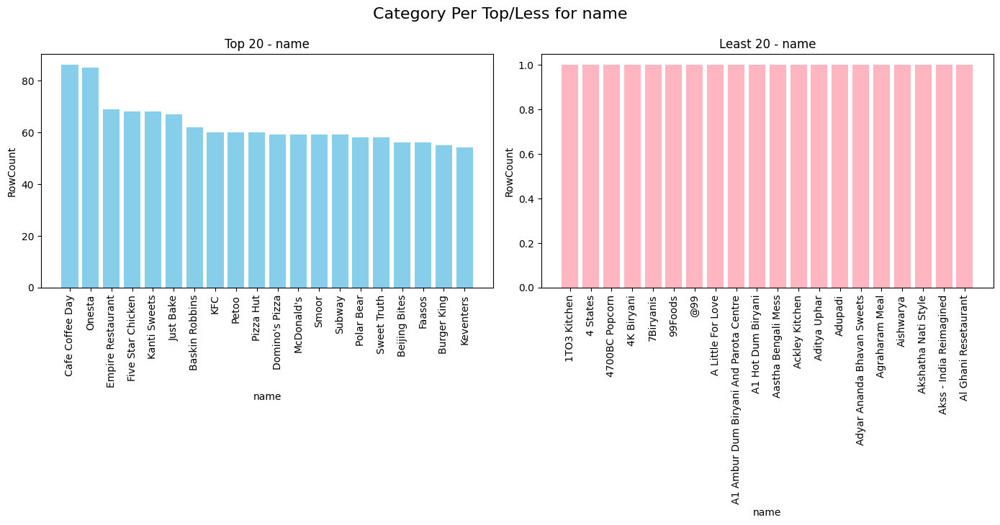

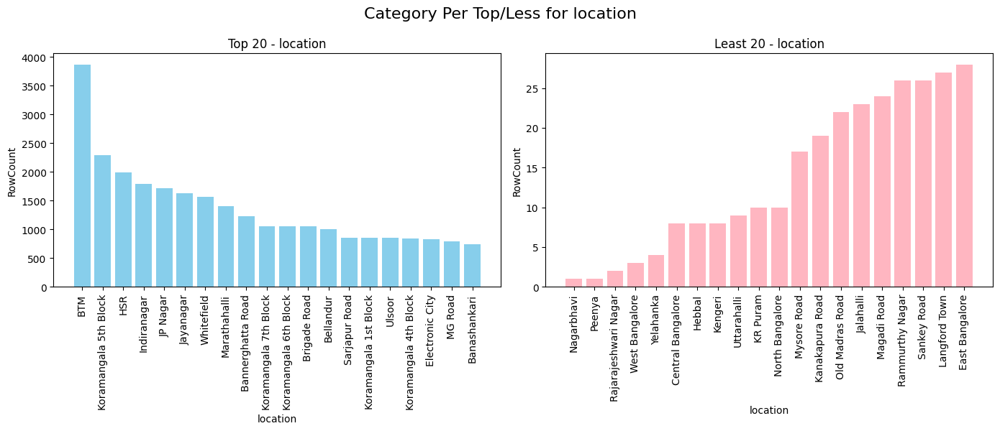

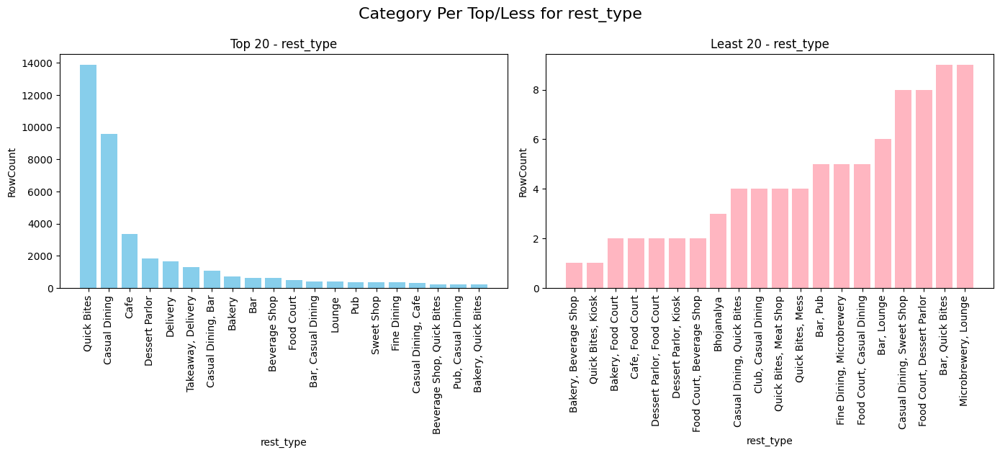

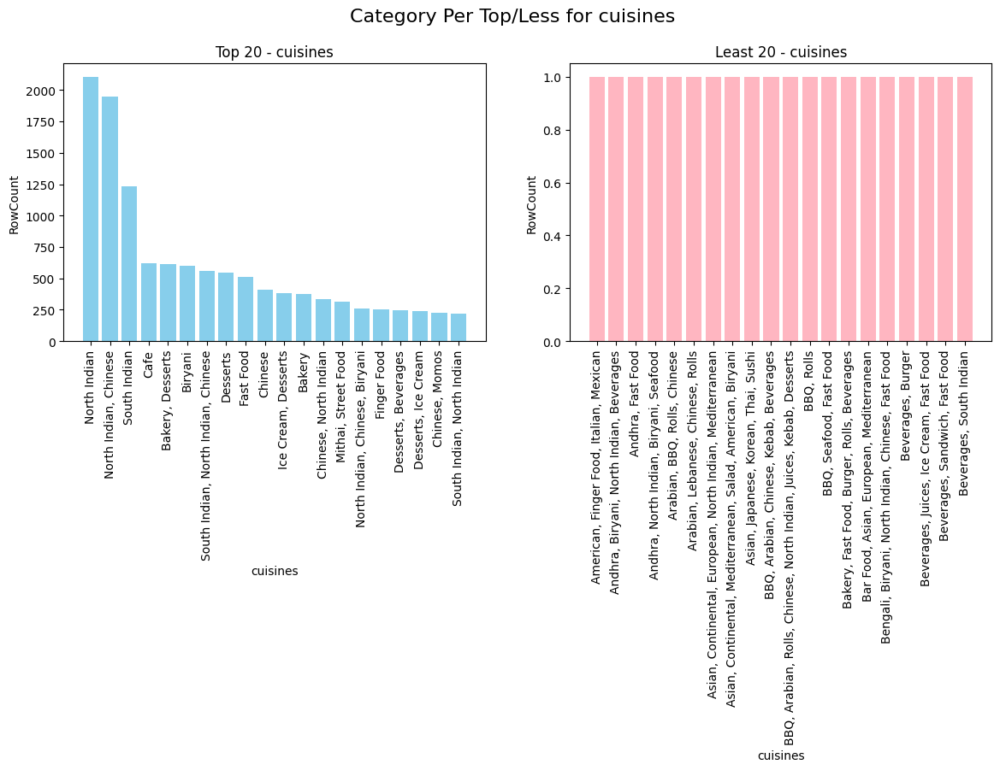

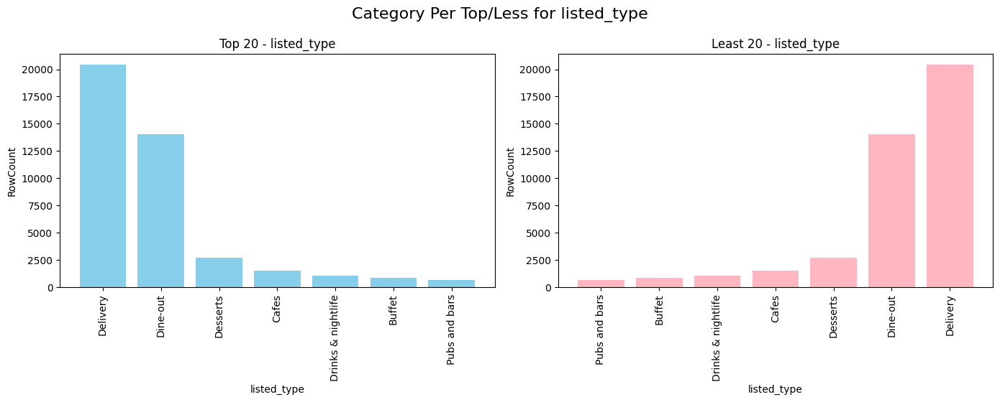

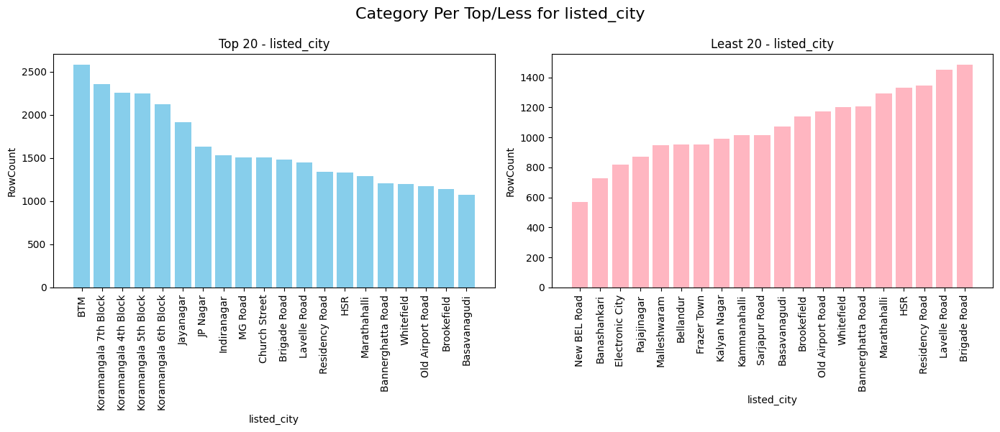

In [133]:
for i in Cat_Col.columns.tolist():
    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 columns
    
    # Group and get the top and least 20 categories
    Top_cat = df.groupby(i)['RowCount'].count().nlargest(20).reset_index()
    Less_cat = df.groupby(i)['RowCount'].count().nsmallest(20).reset_index()
    
    # Plot top 20 categories on the first subplot (axes[0])
    axes[0].bar(Top_cat[i], Top_cat['RowCount'], color='skyblue')
    axes[0].set_title(f"Top 20 - {i}")
    axes[0].set_xlabel(i)
    axes[0].set_ylabel('RowCount')
    axes[0].tick_params(axis='x', rotation=90)  # Rotate x-axis labels

    # Plot least 20 categories on the second subplot (axes[1])
    axes[1].bar(Less_cat[i], Less_cat['RowCount'], color='lightpink')
    axes[1].set_title(f"Least 20 - {i}")
    axes[1].set_xlabel(i)
    axes[1].set_ylabel('RowCount')
    axes[1].tick_params(axis='x', rotation=90)  # Rotate x-axis labels

    # Set a common title for the figure
    fig.suptitle(f"Category Per Top/Less for {i}", fontsize=16)

    # Apply tight layout and then adjust margins
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # This should fix most overlap issues
    
    # Manually adjust bottom and top margins if needed
    plt.subplots_adjust(top=0.85, bottom=0.2)  # Adjust margins if there's still overlap
    
    # Show plot
    plt.show();


* `'listed_city','listed_type','online_order','online_order','book_table','phone','menu_item','score'`

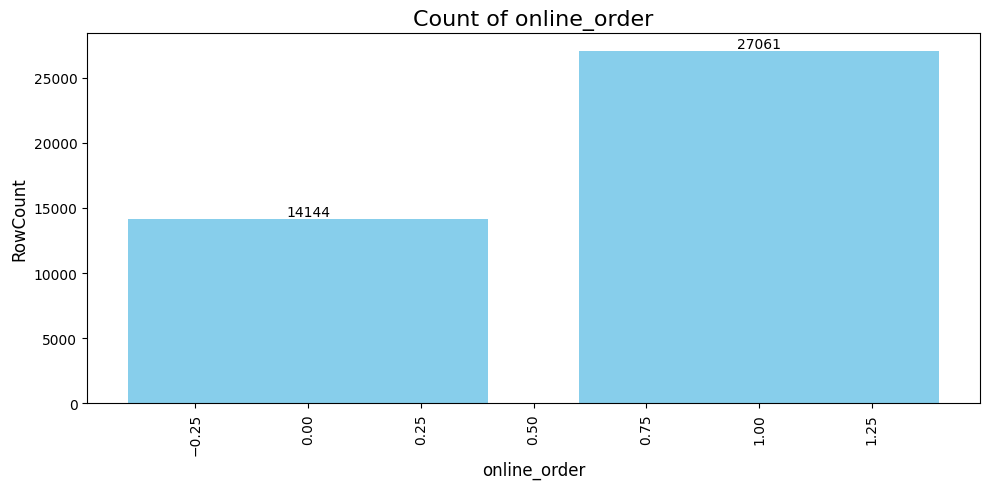

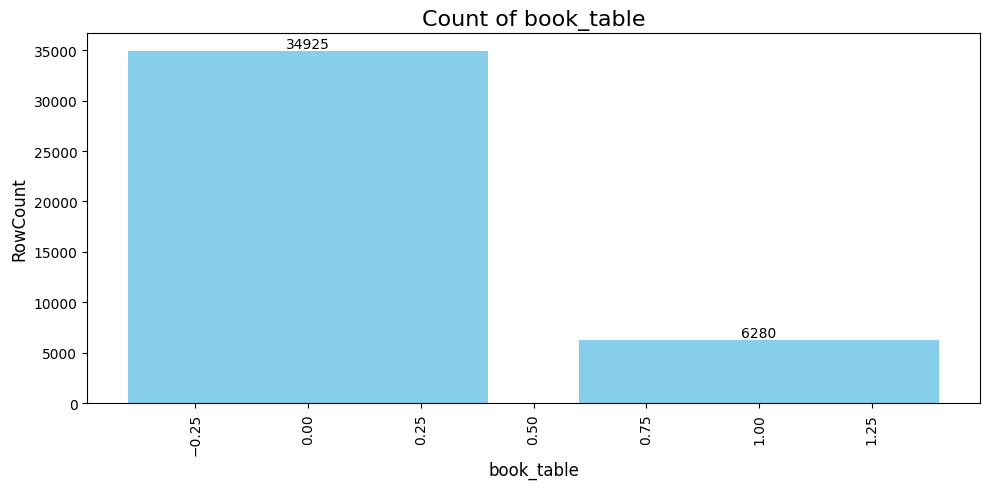

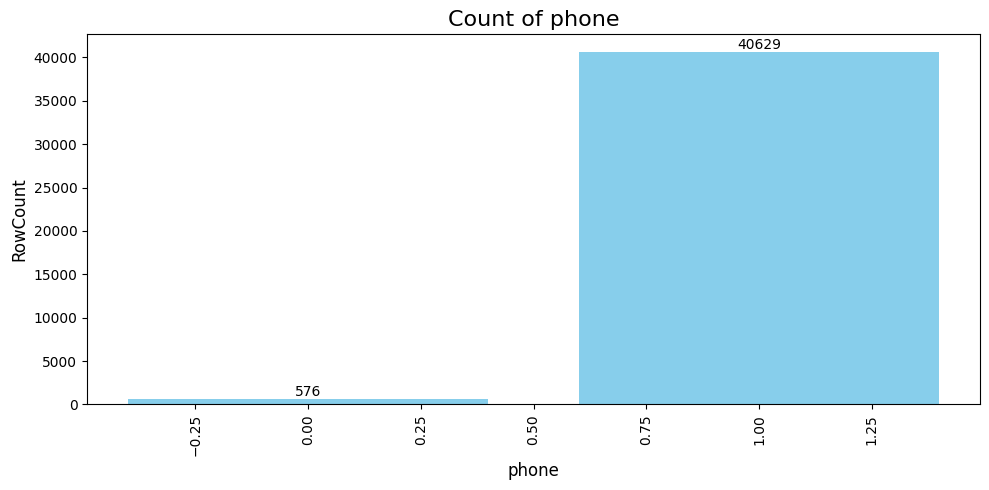

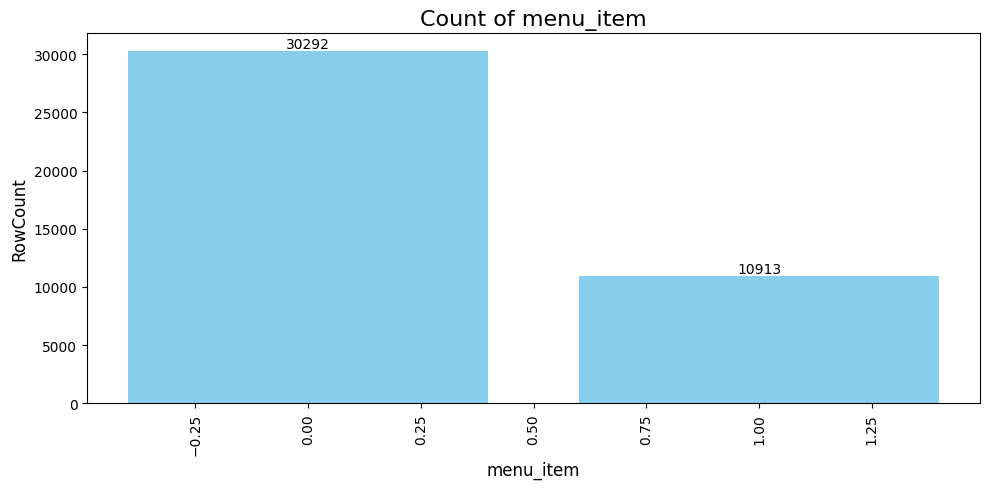

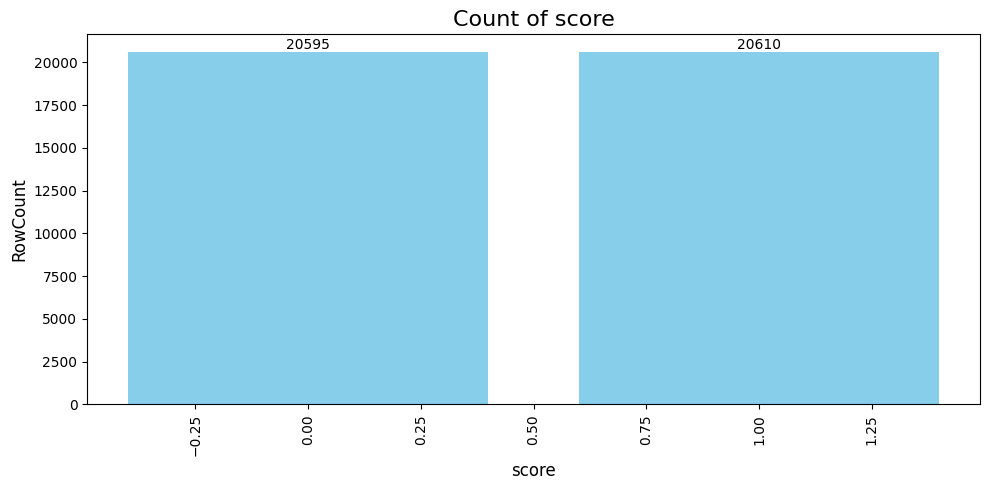

...

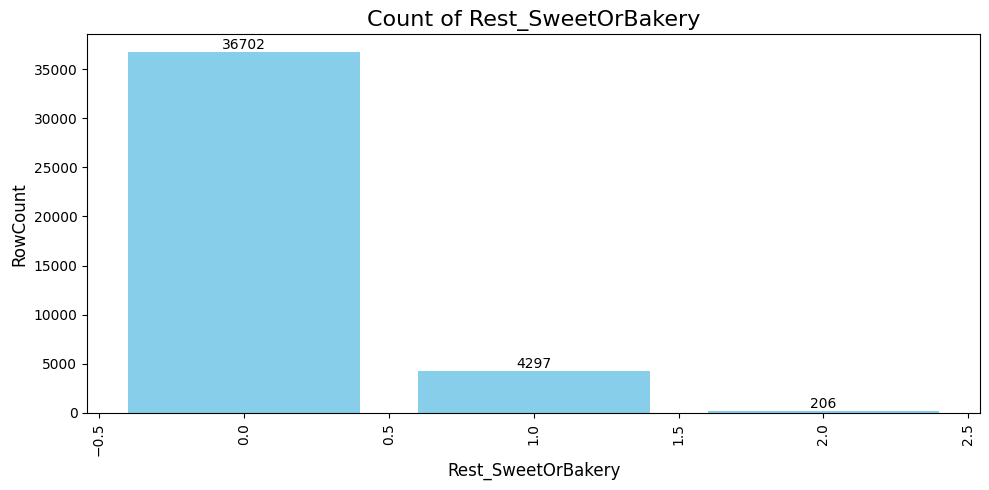

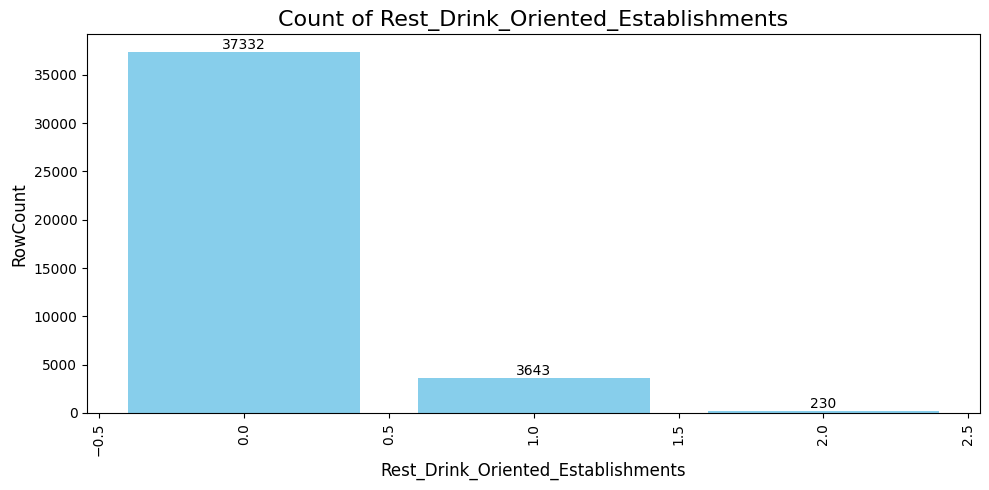

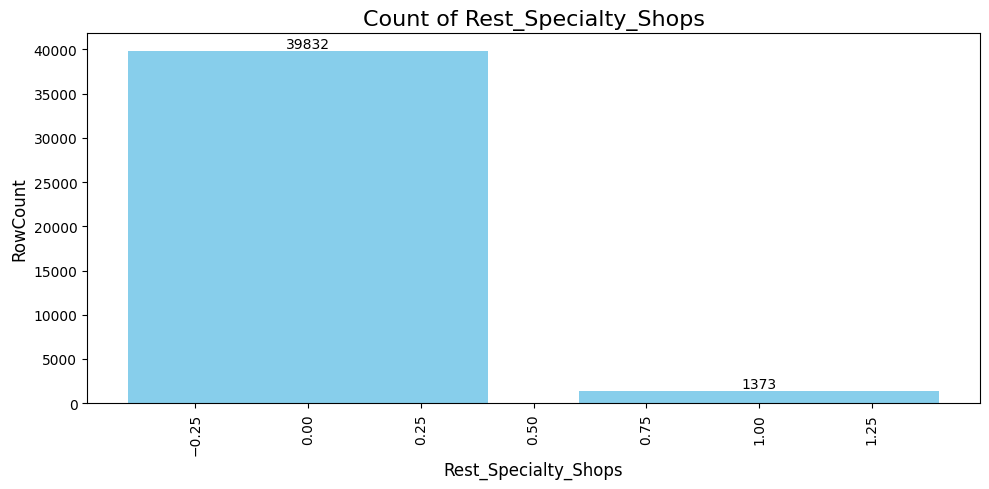

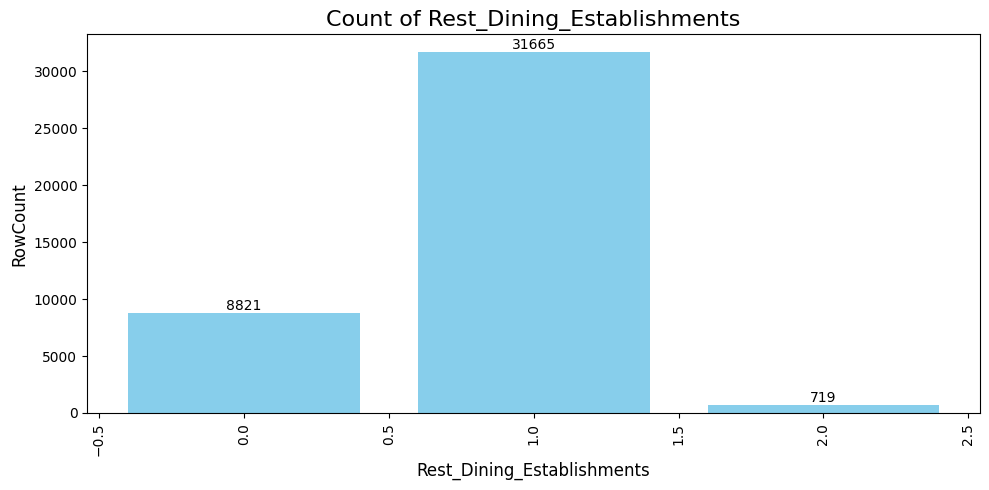

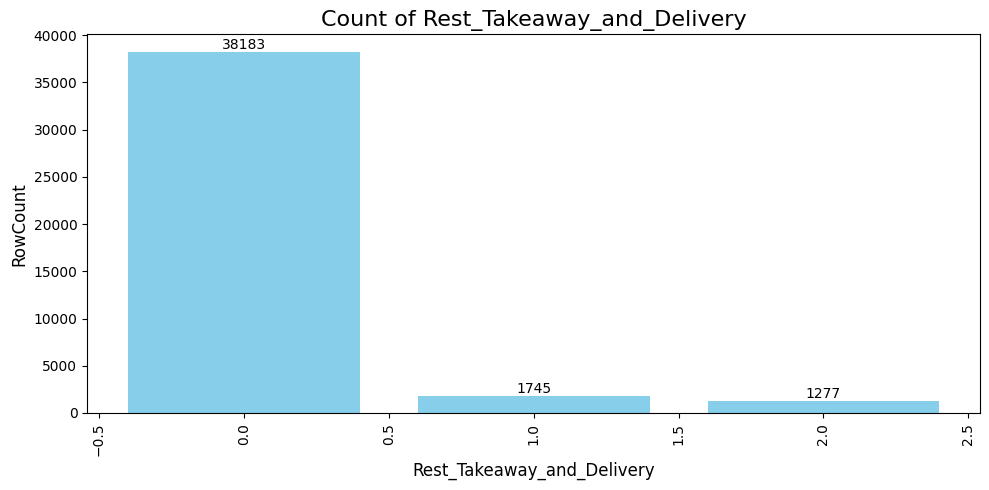

In [134]:
# Loop through the specified columns
for i in Num_Col.drop(['rate' , 'votes' , 'approx_cost' , 'RowCount'] , axis=1):
    # Group the data by 'i' and count the 'RowCount'
    count_cat = df.groupby(i)['RowCount'].count().reset_index()
    
    # Create a bar plot with Matplotlib
    fig, ax = plt.subplots(figsize=(10, 5))  # Set the figure size
    
    ax.bar(count_cat[i], count_cat['RowCount'], color='skyblue')  # Use skyblue color for bars
    
    # Add title and labels
    ax.set_title(f'Count of {i}', fontsize=16)
    ax.set_xlabel(i, fontsize=12)
    ax.set_ylabel('RowCount', fontsize=12)
    
    # Rotate x-axis labels for better readability if necessary
    plt.xticks(rotation=90)
    
    # Add the data labels on top of the bars
    for index, value in enumerate(count_cat['RowCount']):
        ax.text(index, value, str(value), ha='center', va='bottom')  # ha=center aligns text horizontally
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    
    # Show the plot
    plt.show()

    # Print a blank line for spacing (mimicking the original `print('')`)
    print('')


* `Rate , Votes , approx_cost`

In [135]:
df.head(1).T

,0
name,Jalsa
online_order,1
book_table,1
rate,4.10
votes,775
phone,1
location,Banashankari
rest_type,Casual Dining
cuisines,"North Indian, Mughlai, Chinese"
approx_cost,800.00


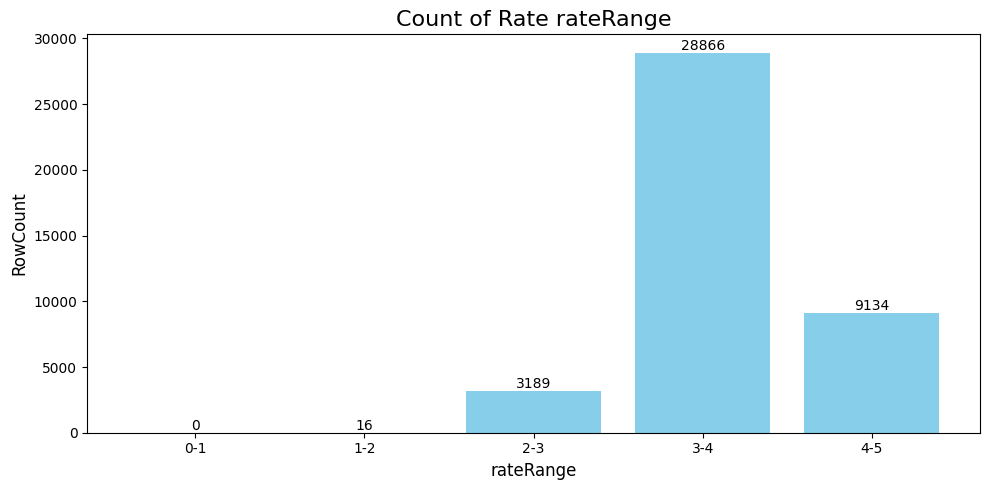

In [136]:
# Rate
Rate_msk = df.groupby('rateRange')['RowCount'].sum().reset_index()
BarPlot (Rate_msk , 'rateRange' , 'RowCount')

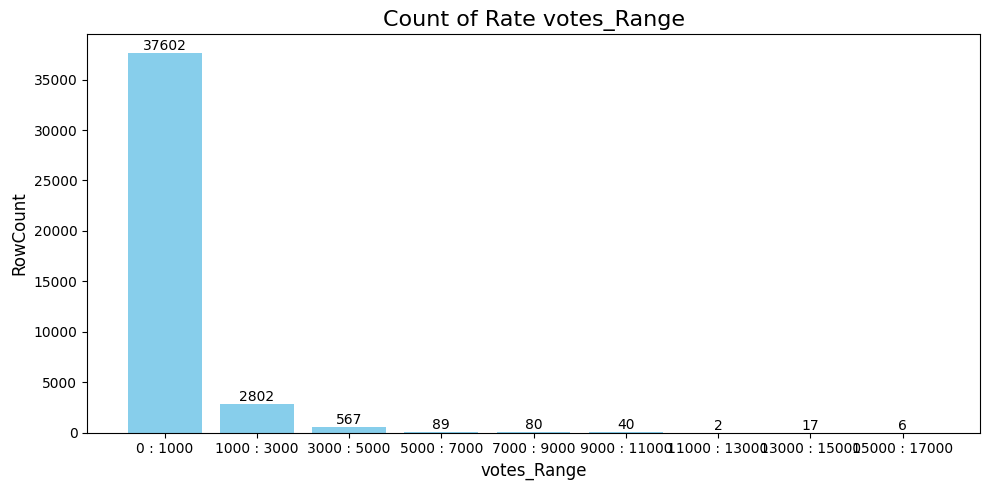

In [137]:
# Votes
Votes_Dist = df.groupby('votes_Range')['RowCount'].sum().reset_index()
BarPlot (Votes_Dist , 'votes_Range' , 'RowCount')

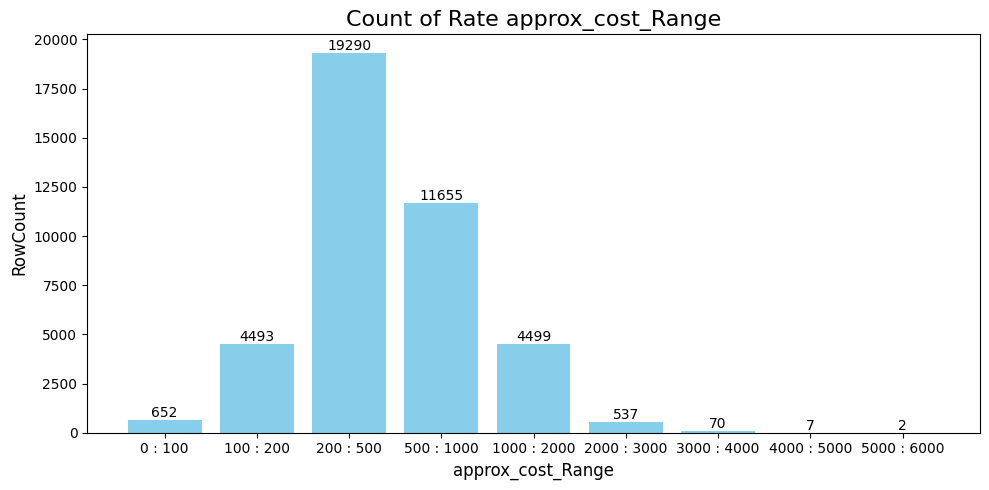

In [138]:
# approx_cost
approx_cost_Dist = df.groupby('approx_cost_Range')['RowCount'].sum().reset_index()
BarPlot (approx_cost_Dist , 'approx_cost_Range' , 'RowCount')

### 🚩 Bivariate Analysis

#### - Categorical
    * Name , Cuisines , Location , Listed_city , Rest_type , Listed_type

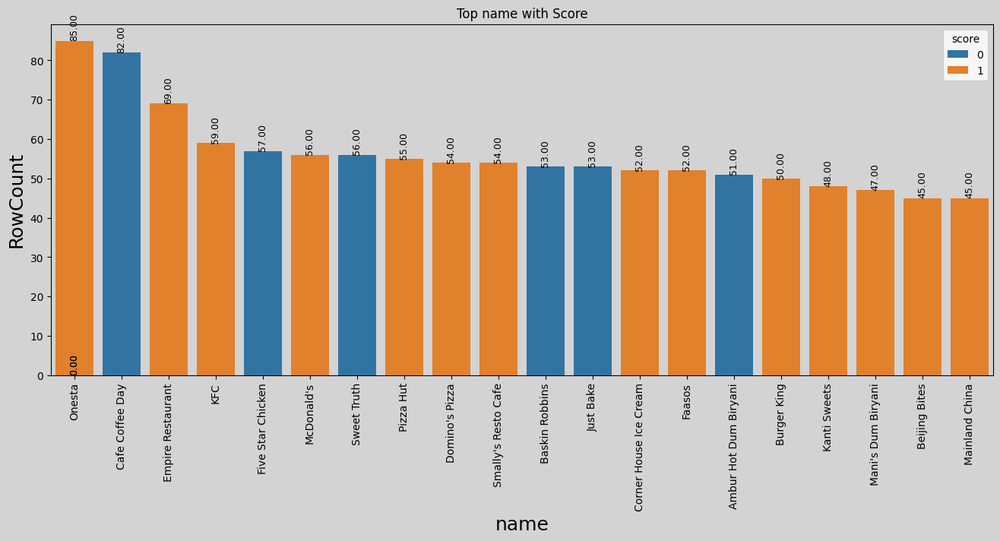

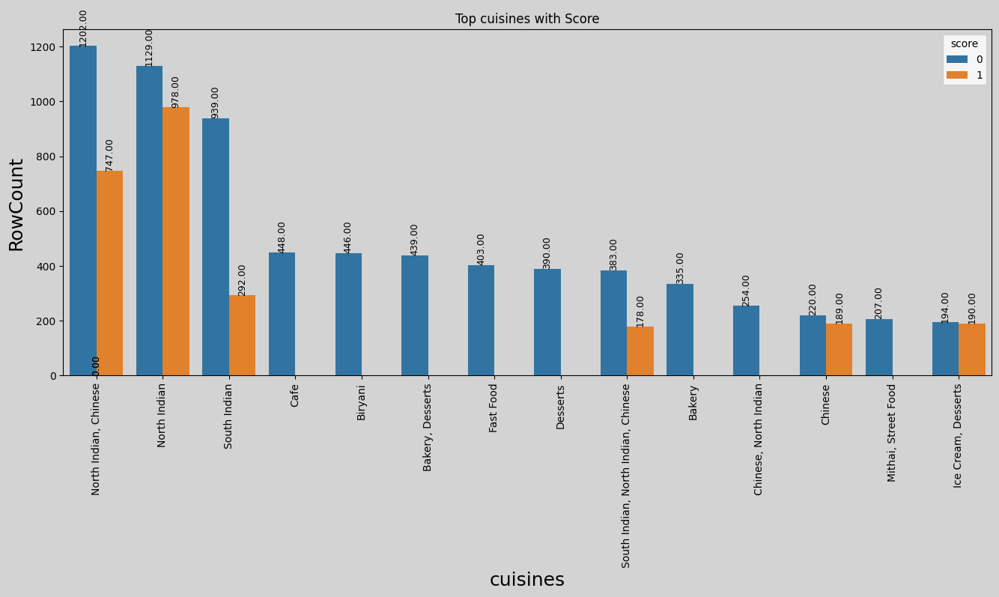

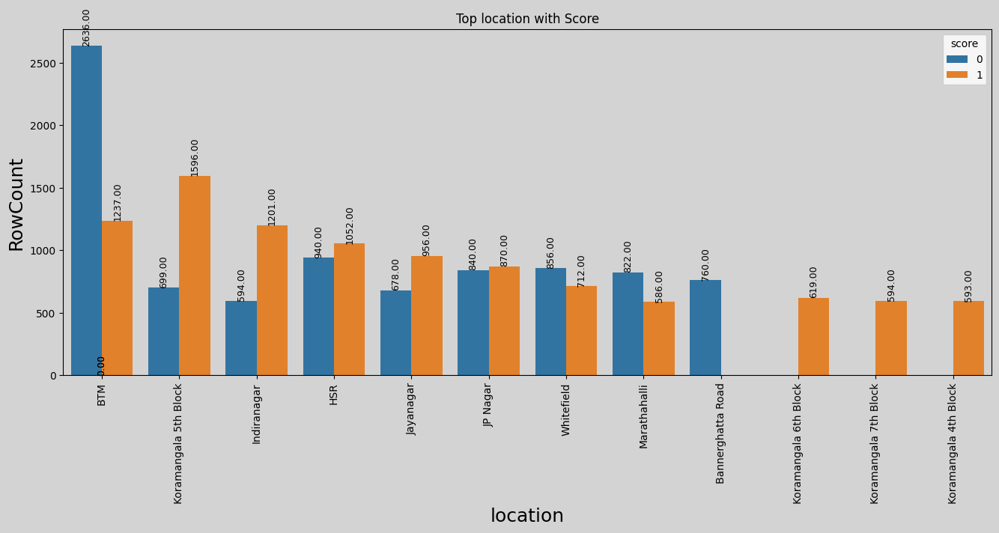

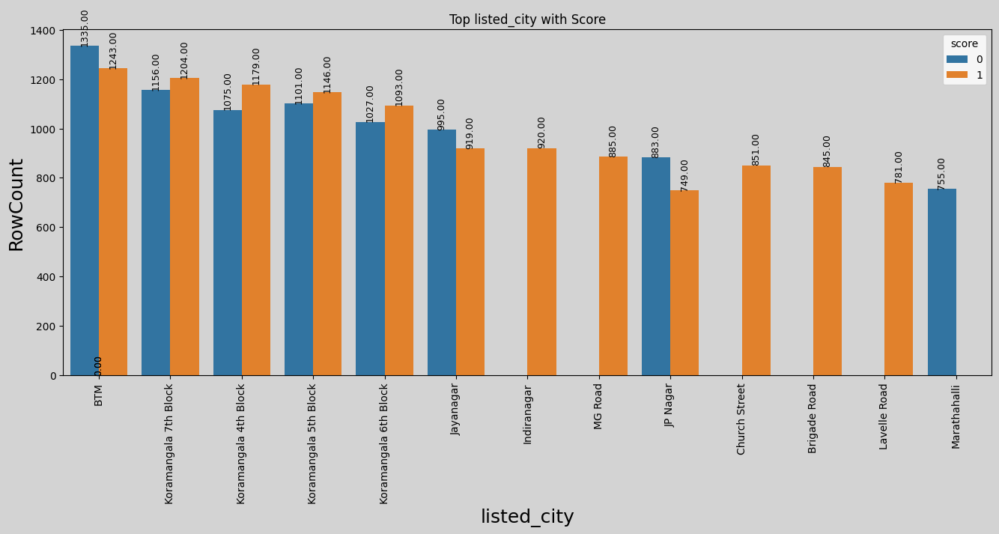

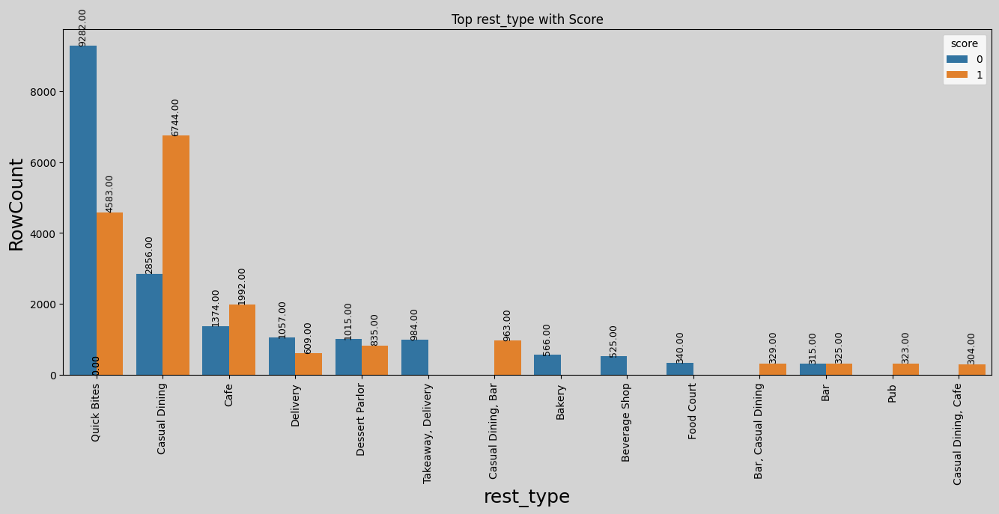

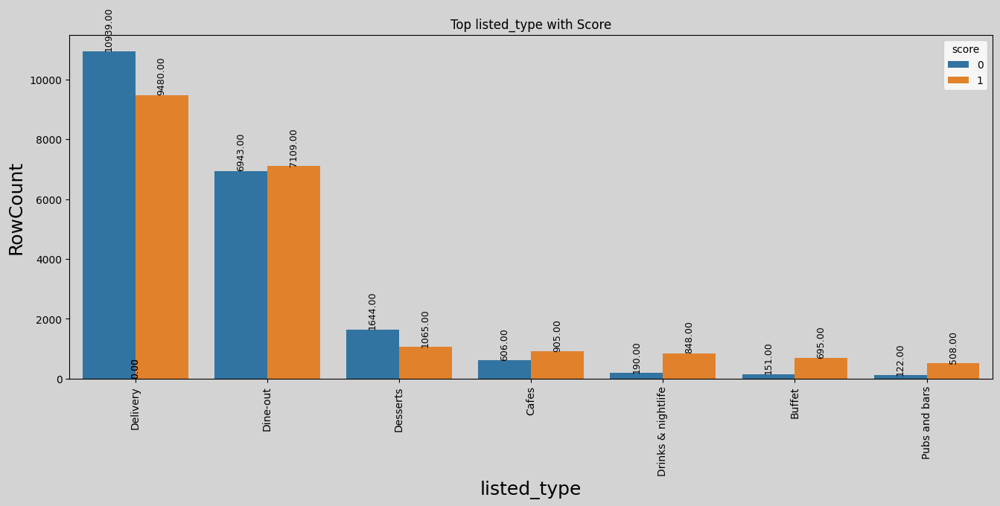

In [139]:
for i in ['name', 'cuisines', 'location', 'listed_city', 'rest_type','listed_type'] :
    Bi_Name = df.groupby([ i , 'score'])['RowCount'].sum().nlargest(20).reset_index()
    BivPlot_color (Bi_Name ,  i , 'RowCount' , 'score' , f'Top {i} with Score')
    print('')

#### - Votes

score,votes_Range,0,1
0,0 : 1000,20595,17007
1,1000 : 3000,0,2802
2,3000 : 5000,0,567
3,5000 : 7000,0,89
4,7000 : 9000,0,80
5,9000 : 11000,0,40
6,11000 : 13000,0,2
7,13000 : 15000,0,17
8,15000 : 17000,0,6


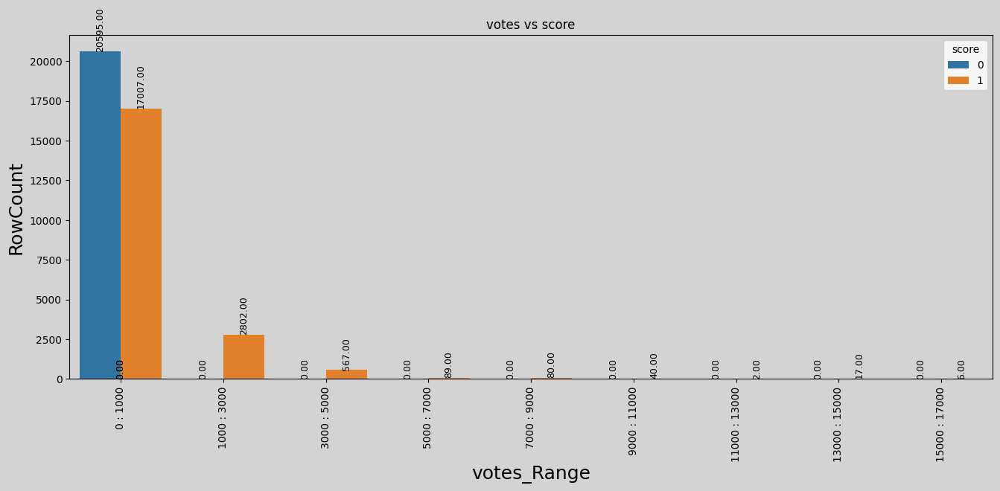

In [140]:
votes_msk = df.groupby(['votes_Range' , 'score'])['RowCount'].sum().reset_index()
display( pd.crosstab (index =votes_msk['votes_Range'] , columns=votes_msk['score'] , values=votes_msk['RowCount'] , aggfunc='sum' ).reset_index() )
BivPlot_color (votes_msk , 'votes_Range' , 'RowCount' , 'score' , f'votes vs score')

#### - rateRange

score,rateRange,0,1
0,0-1,0,0
1,1-2,0,16
2,2-3,2016,1173
3,3-4,18166,10700
4,4-5,413,8721


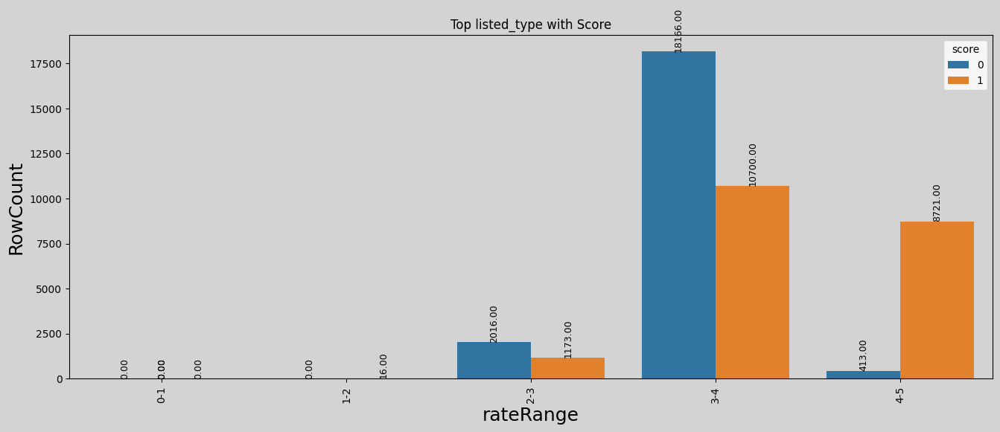

In [141]:
# rateRange
rateRange_msk = df.groupby(['rateRange' , 'score'])['RowCount'].sum().reset_index()
display( pd.crosstab (index =rateRange_msk['rateRange'] , columns=rateRange_msk['score'] , values=rateRange_msk['RowCount'] , aggfunc='sum' ).reset_index() )
BivPlot_color (rateRange_msk , 'rateRange' , 'RowCount' , 'score' , f'Top {i} with Score')

#### - Approx_Cost

score,approx_cost_Range,0,1
0,0 : 100,561,91
1,100 : 200,3523,970
2,200 : 500,12134,7156
3,500 : 1000,3778,7877
4,1000 : 2000,501,3998
5,2000 : 3000,91,446
6,3000 : 4000,5,65
7,4000 : 5000,2,5
8,5000 : 6000,0,2


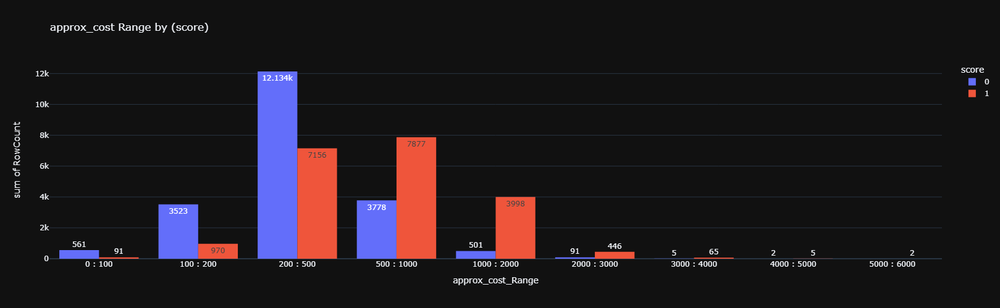

In [142]:
# approx_cost
approx_cost_msk = df.groupby(['approx_cost_Range' , 'score'])['RowCount'].sum().reset_index()
display( pd.crosstab (index =approx_cost_msk['approx_cost_Range'] , columns=approx_cost_msk['score'] , values=approx_cost_msk['RowCount'] , aggfunc='sum' ).reset_index() )
px.histogram(approx_cost_msk , x = 'approx_cost_Range' , y='RowCount' , color='score' , histfunc='sum', template='plotly_dark' , text_auto=True ,barmode='group', title=f'approx_cost Range by (score)' , width=900 , height=500).show()

#### - Numerical : 
    * book_table , menu_item , online_order , phone , approx_cost , rate

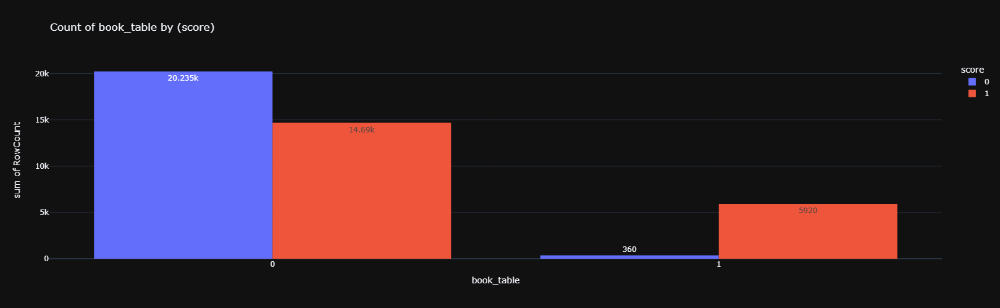

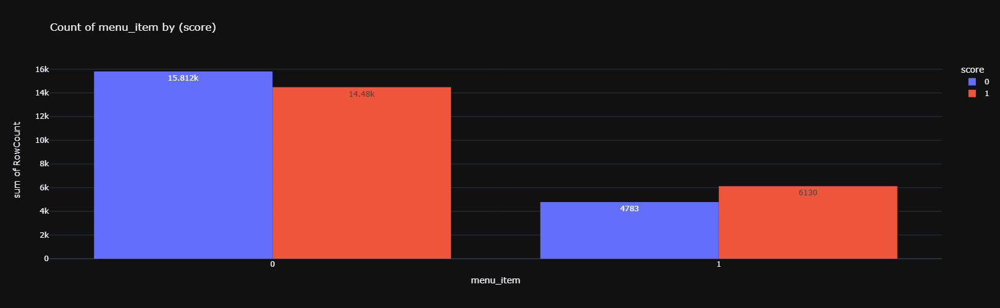

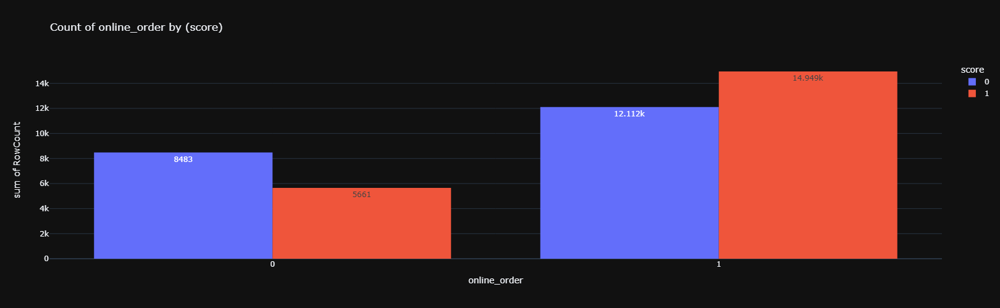

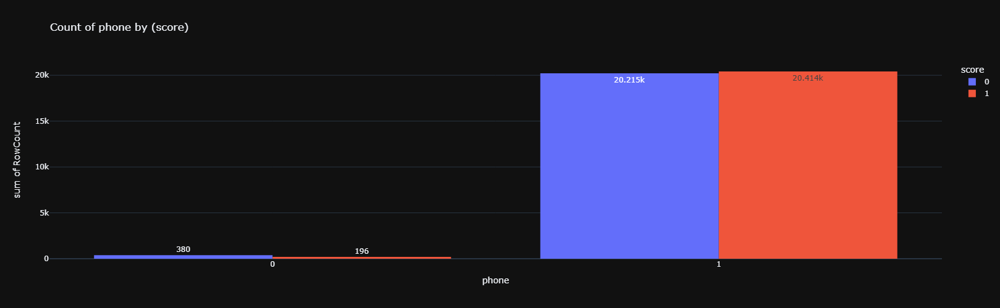

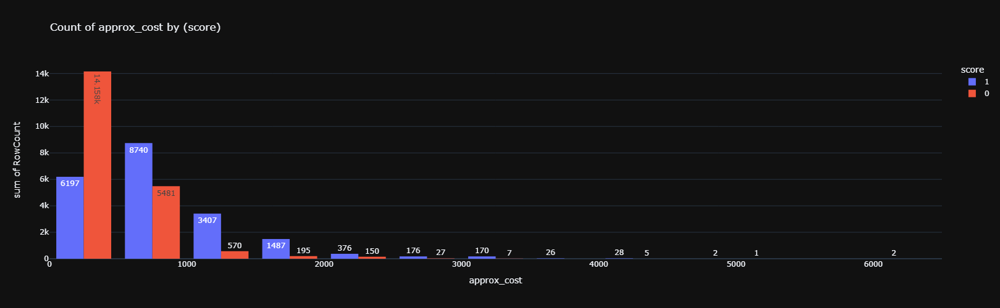

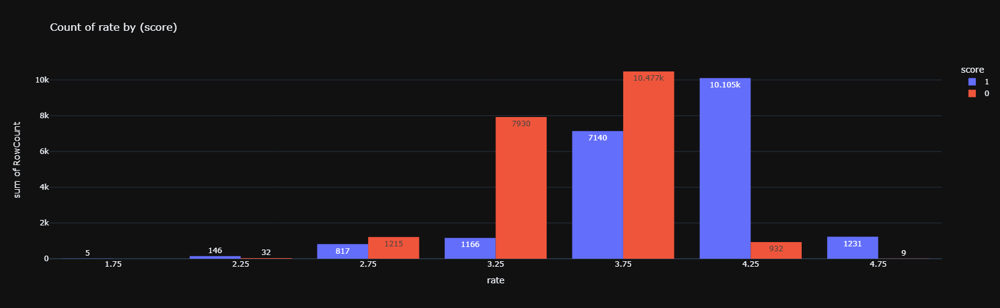

In [143]:
# 'book_table' , 'menu_item' , 'online_order' , 'phone' , 'approx_cost' , 'rate'
for i in ['book_table' , 'menu_item' , 'online_order' , 'phone' , 'approx_cost' , 'rate']:
    rateRange_grb = df.groupby([i , 'score'])['RowCount'].sum().reset_index()
    px.histogram(rateRange_grb , x = i , y='RowCount' , color='score' , histfunc='sum', template='plotly_dark' , text_auto=True ,barmode='group', title=f'Count of {i} by (score)' , width=900 , height=500).show()
    print('')

### 🚩 Multivariate Analysis

In [144]:
df.sample(3).T

,14020,9097,11605
name,Krispy Kreme,House Of Commons,Bangalore Shadi Biriyani
online_order,1,0,1
book_table,0,1,0
rate,4.10,4.80,3.50
votes,259,4390,57
phone,1,1,1
location,Indiranagar,Koramangala 5th Block,Vasanth Nagar
rest_type,Dessert Parlor,Bar,Quick Bites
cuisines,"Desserts, Beverages","Continental, Asian, North Indian","Chinese, North Indian"
approx_cost,300.00,"1,000.00",150.00


#### - Categorical

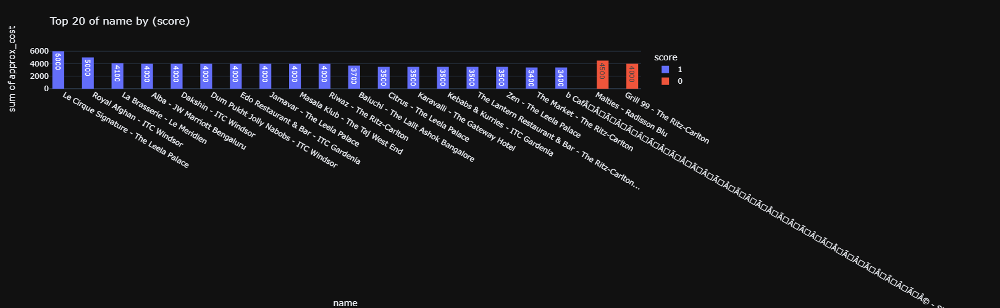

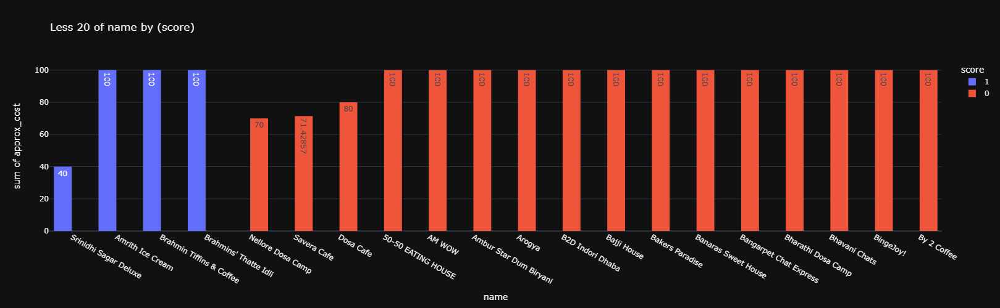

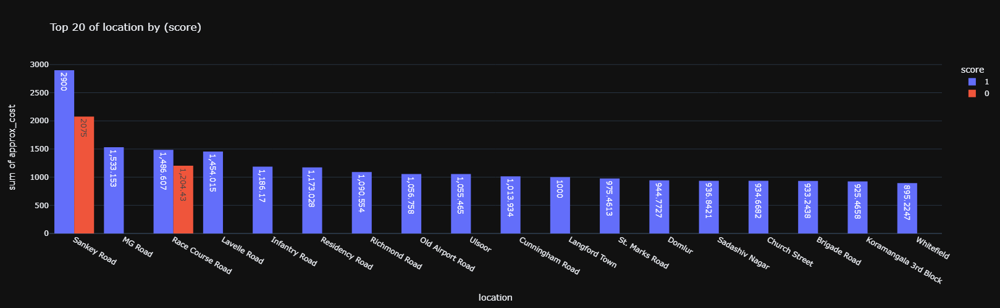

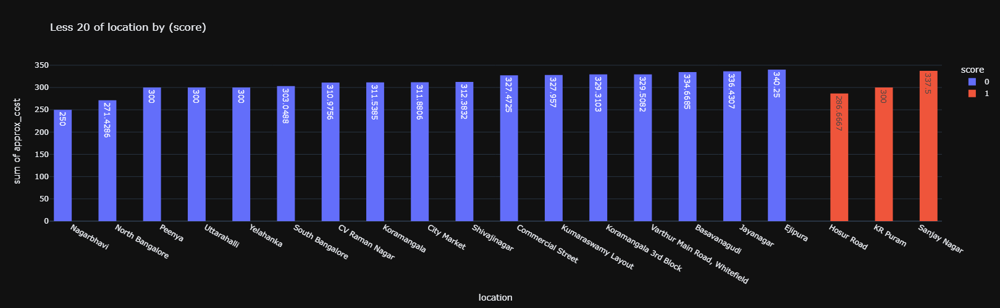

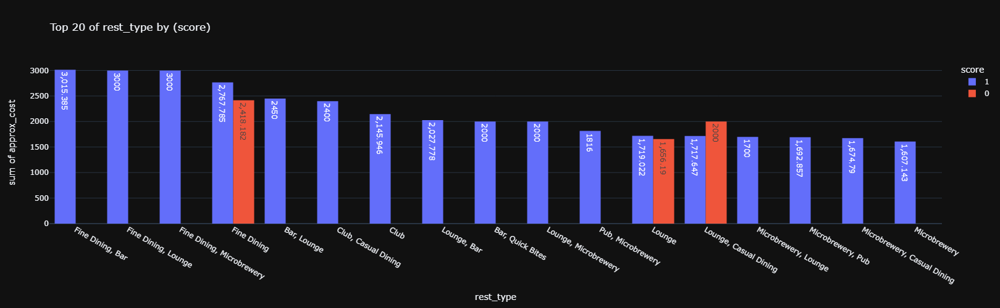

...

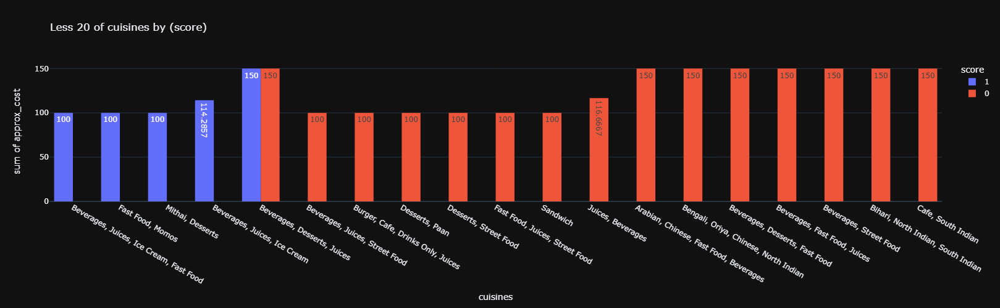

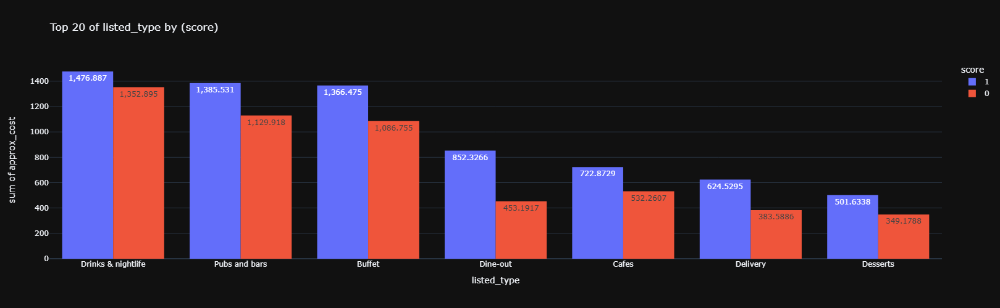

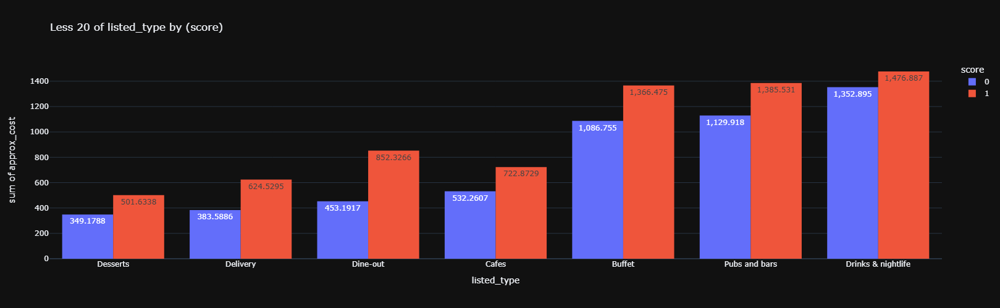

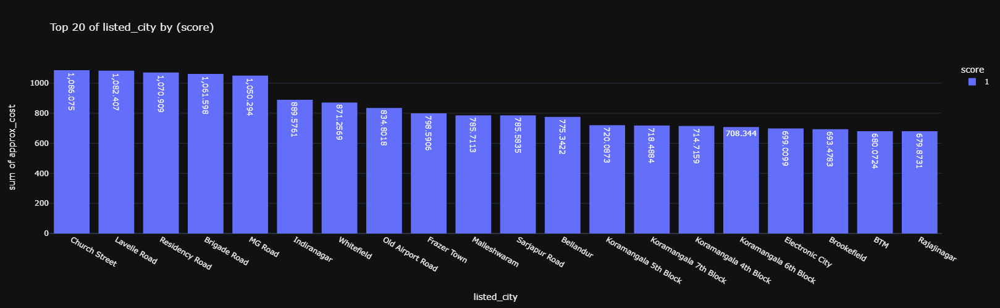

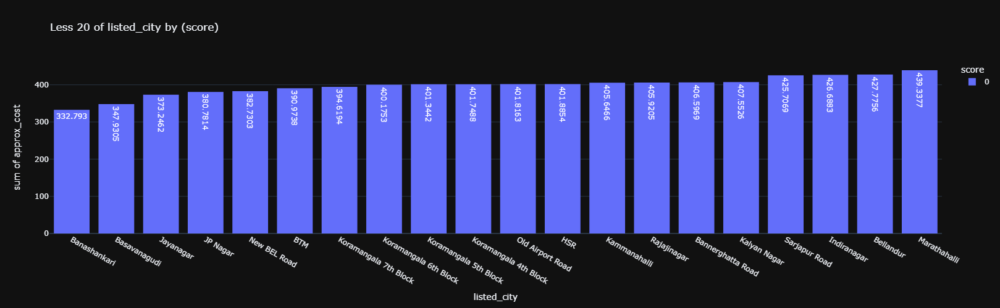

In [145]:
# Top/Less Analysis
for i in Cat_Col.columns.tolist():
    fig = make_subplots(rows=1, cols=2, subplot_titles=(f" - Top_category per {i}"))
    # Group and get the top and least 20 categories
    Top_cat = df.groupby([ i , 'score'])['approx_cost'].mean().nlargest(20).reset_index()
    Less_cat = df.groupby([ i , 'score'])['approx_cost'].mean().nsmallest(20).reset_index()
    px.histogram(Top_cat , x = i , y='approx_cost' , color='score' , histfunc='sum', template='plotly_dark' , text_auto=True ,barmode='group', title=f'Top 20 of {i} by (score)' , width=900 , height=500).show()
    print("")
    px.histogram(Less_cat , x = i , y='approx_cost' , color='score' , histfunc='sum', template='plotly_dark' , text_auto=True ,barmode='group', title=f'Less 20 of {i} by (score)' , width=900 , height=500).show()
    print("")

#### -Votes

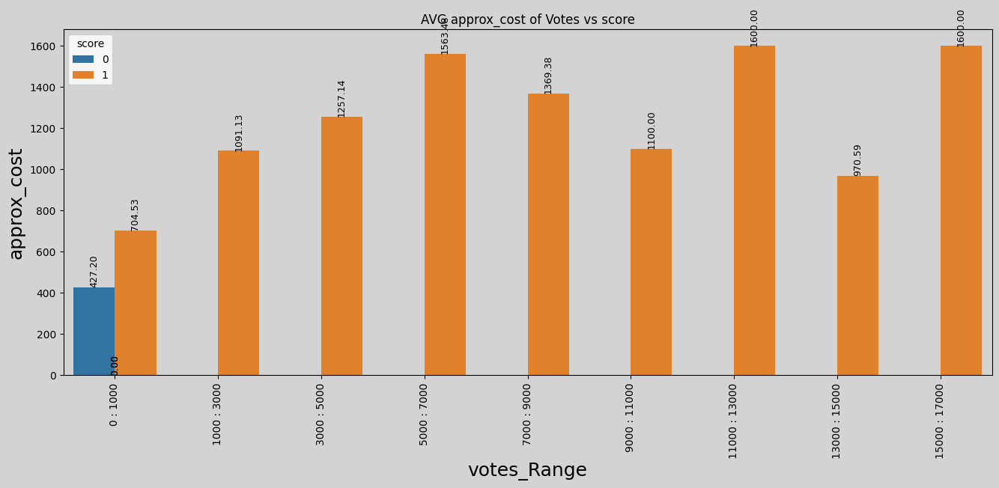

In [146]:
# AVG approx_cost of Votes vs score
rateRange_grb = df.groupby(['votes_Range' , 'score'])['approx_cost'].mean().reset_index()
BivPlot_color (rateRange_grb , 'votes_Range' , 'approx_cost' , 'score' , "AVG approx_cost of Votes vs score")

#### - Rate

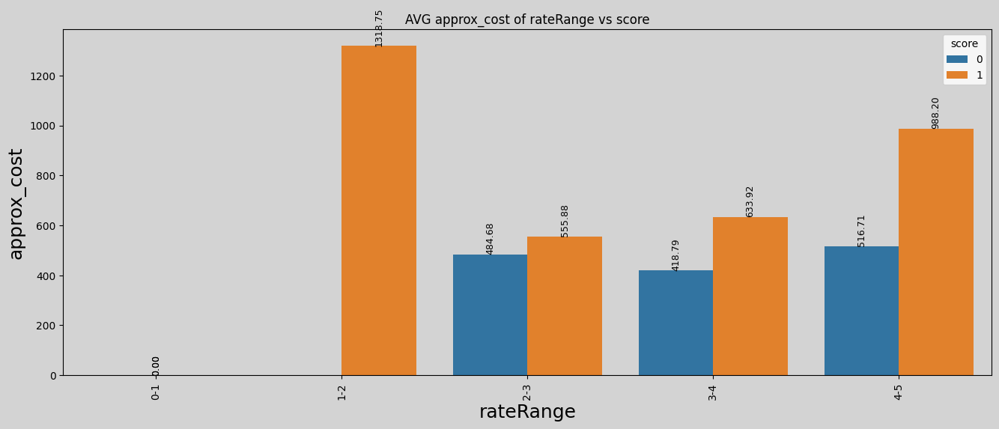

In [147]:
# Rate
rateRange_grb = df.groupby(['rateRange' , 'score'])['approx_cost'].mean().reset_index()
BivPlot_color (rateRange_grb , 'rateRange' , 'approx_cost' , 'score' , "AVG approx_cost of rateRange vs score")

#### - Numerical

In [148]:
Num_Col.sample(1).T

,38907
online_order,0
book_table,1
rate,3.90
votes,158
phone,1
approx_cost,"1,100.00"
menu_item,0
score,1
RowCount,1
rateRange,3-4


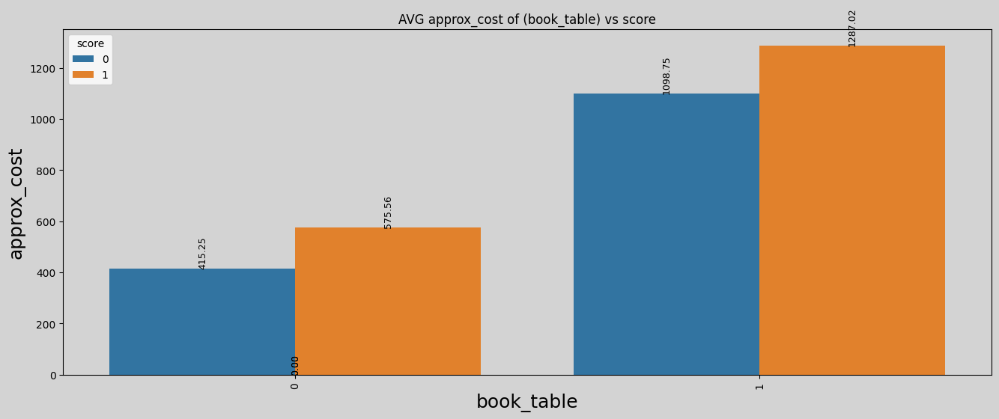

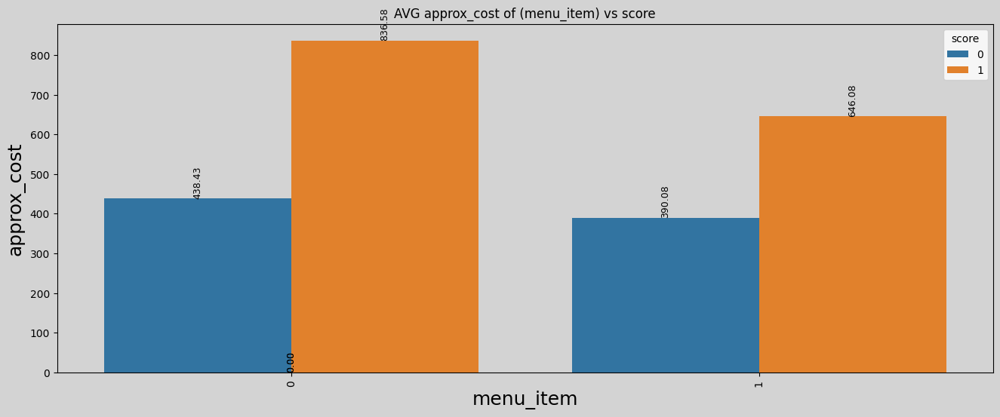

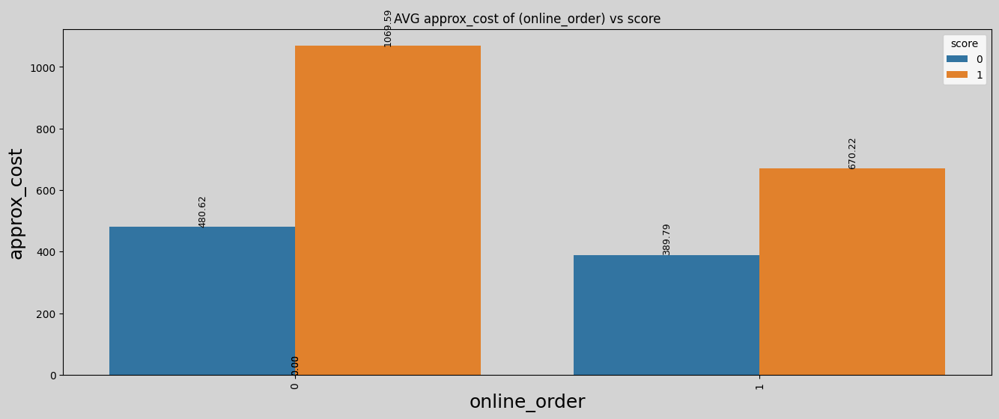

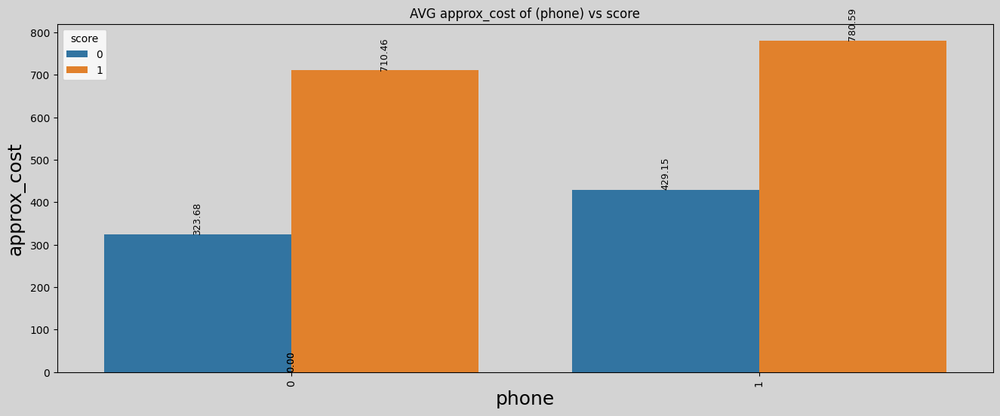

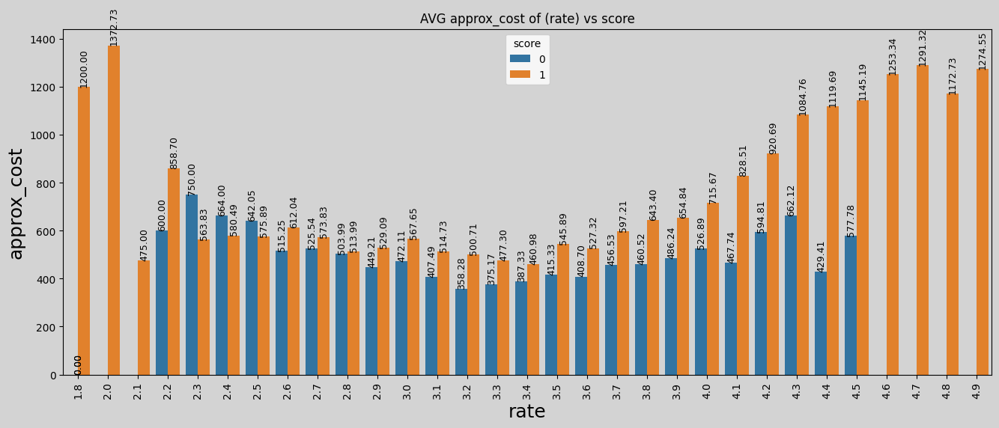

In [149]:
# 'book_table' , 'menu_item' , 'online_order' , 'phone' , 'approx_cost' , 'rate'
for i in ['book_table' , 'menu_item' , 'online_order' , 'phone' , 'rate']:
    rateRange_grb = df.groupby([i , 'score'])['approx_cost'].mean().reset_index()
    BivPlot_color (rateRange_grb , i , 'approx_cost' , 'score' , f"AVG approx_cost of ({i}) vs score")
    print('')

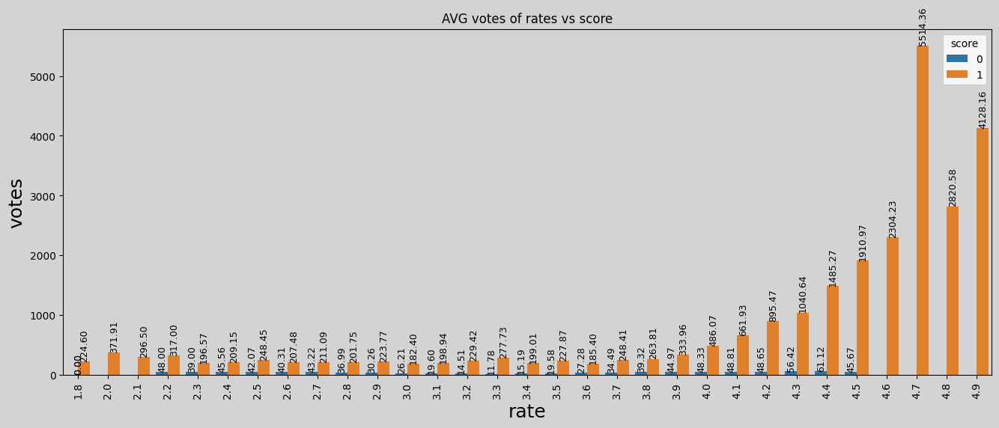

In [150]:
# AVG votes of rates vs score
rate_msk = df.groupby(['rate' , 'score'])['votes'].mean().reset_index()
BivPlot_color (rate_msk , 'rate' , 'votes' , 'score' , "AVG votes of rates vs score")

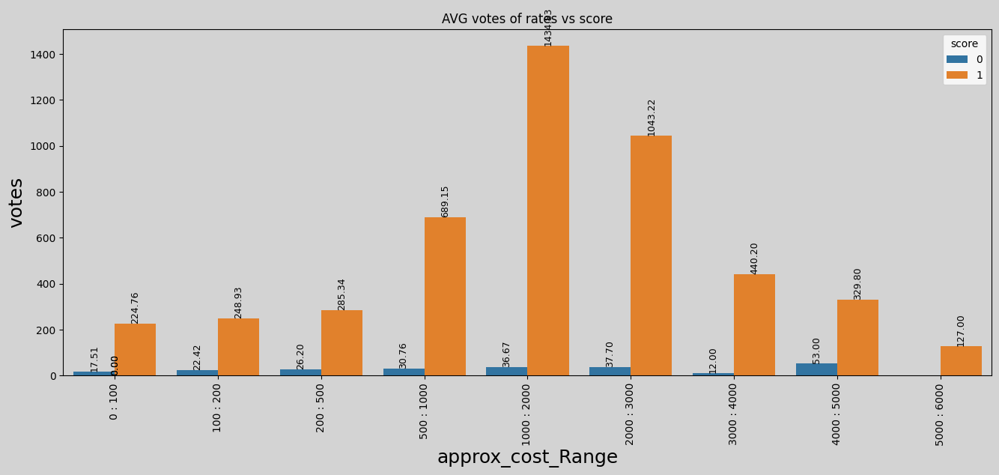

In [151]:
# AVG votes of approx_cost_Range vs score
rate_msk = df.groupby(['approx_cost_Range' , 'score'])['votes'].mean().reset_index()
BivPlot_color (rate_msk , 'approx_cost_Range' , 'votes' , 'score' , "AVG votes of rates vs score")

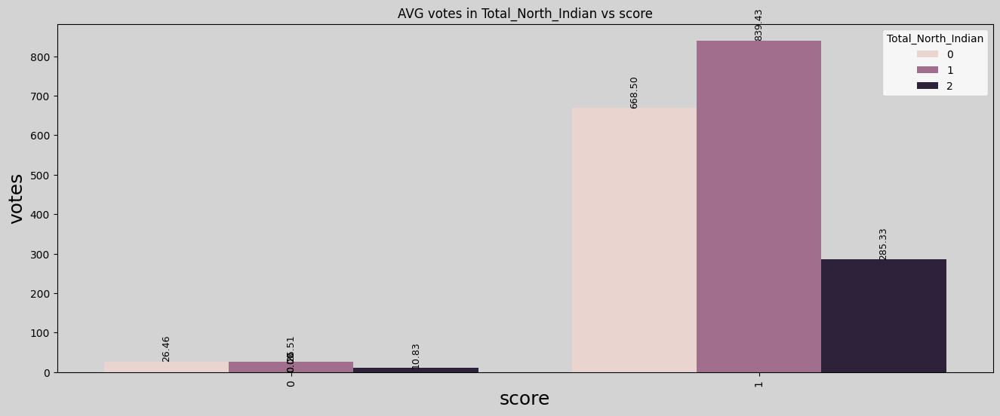

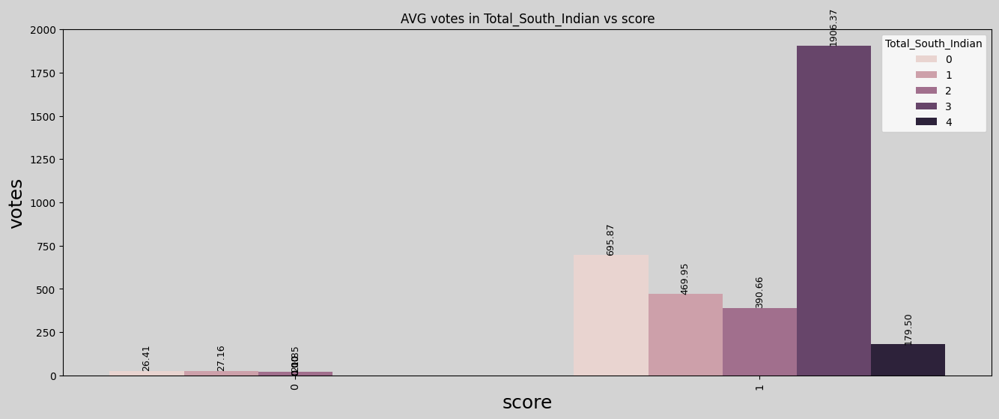

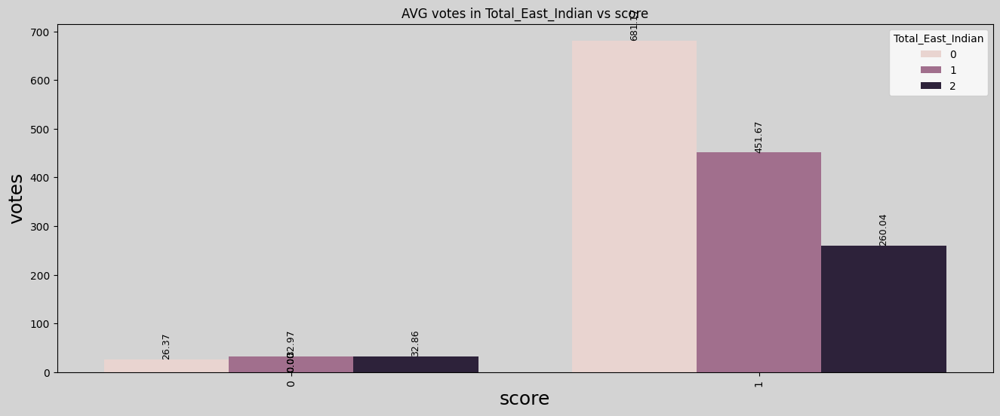

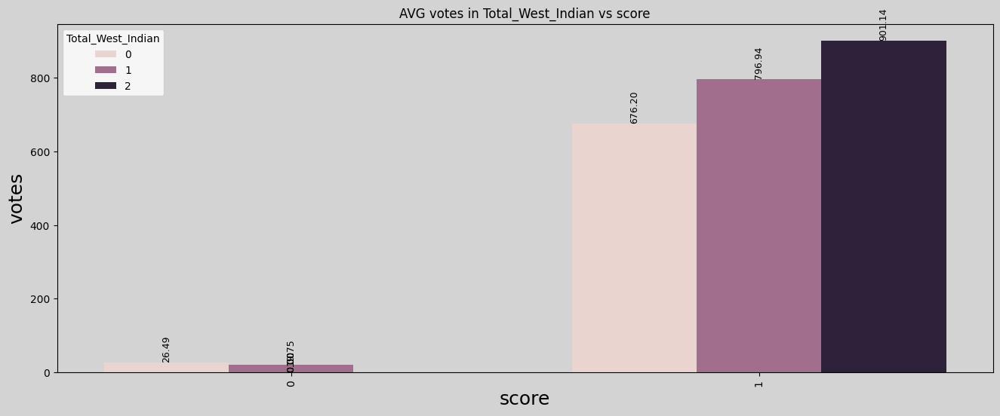

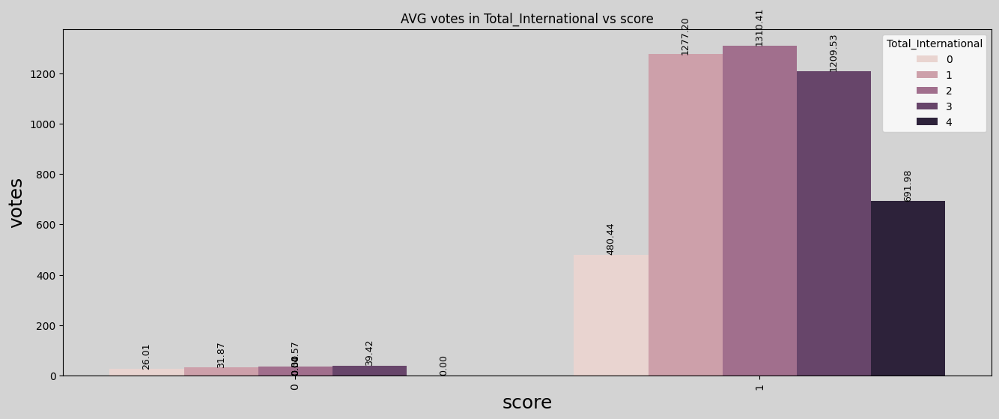

...

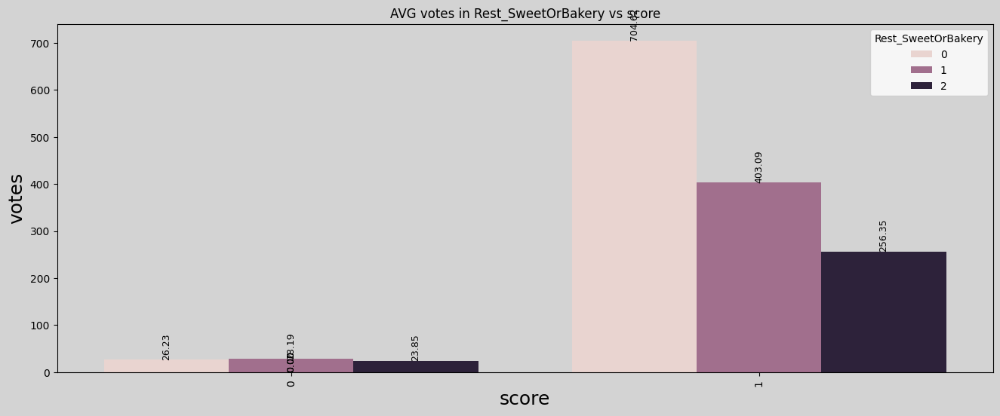

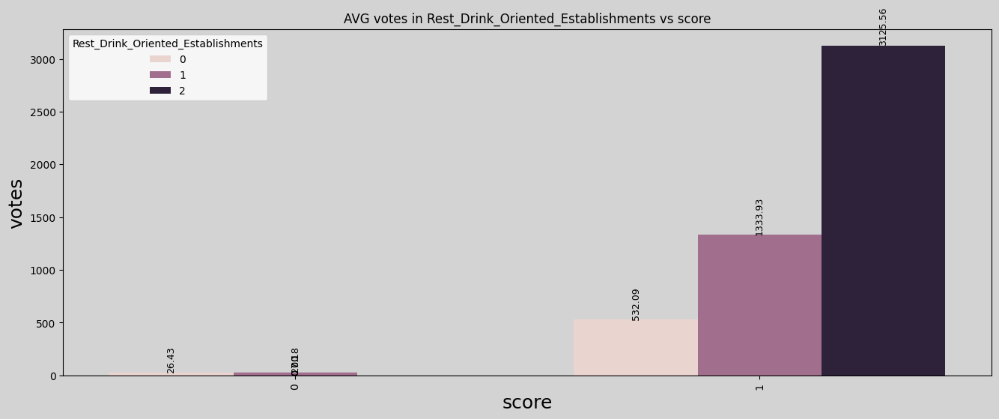

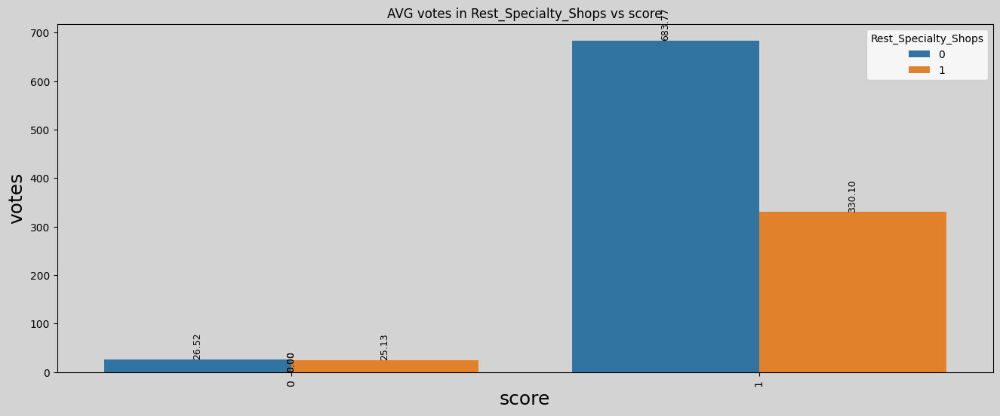

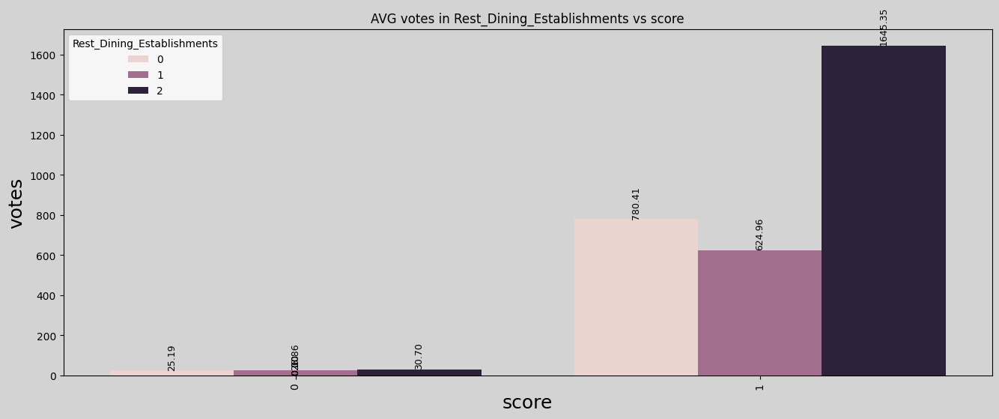

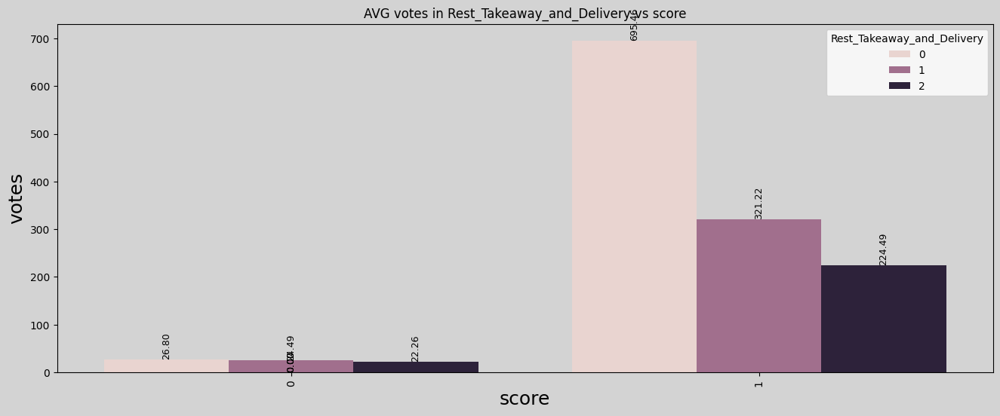

In [152]:
# AVG votes of approx_cost_Range vs score
Newlist = ['Total_North_Indian','Total_South_Indian','Total_East_Indian','Total_West_Indian','Total_International',
           'Total_Asian','Total_Grill/BBQ/Bar_Food','Total_Fast_Food','Total_Beverages/Desserts','Total_Healthy/Fusion','Total_Bakery',
           'Rest_Fine Dining','Rest_SweetOrBakery','Rest_Drink_Oriented_Establishments','Rest_Specialty_Shops','Rest_Dining_Establishments','Rest_Takeaway_and_Delivery']
for i in Newlist:
    rate_msk = df.groupby([i , 'score'])['votes'].mean().reset_index()
    BivPlot_color (rate_msk , 'score' , 'votes' , i , f"AVG votes in {i} vs score")

#### - Rest Type

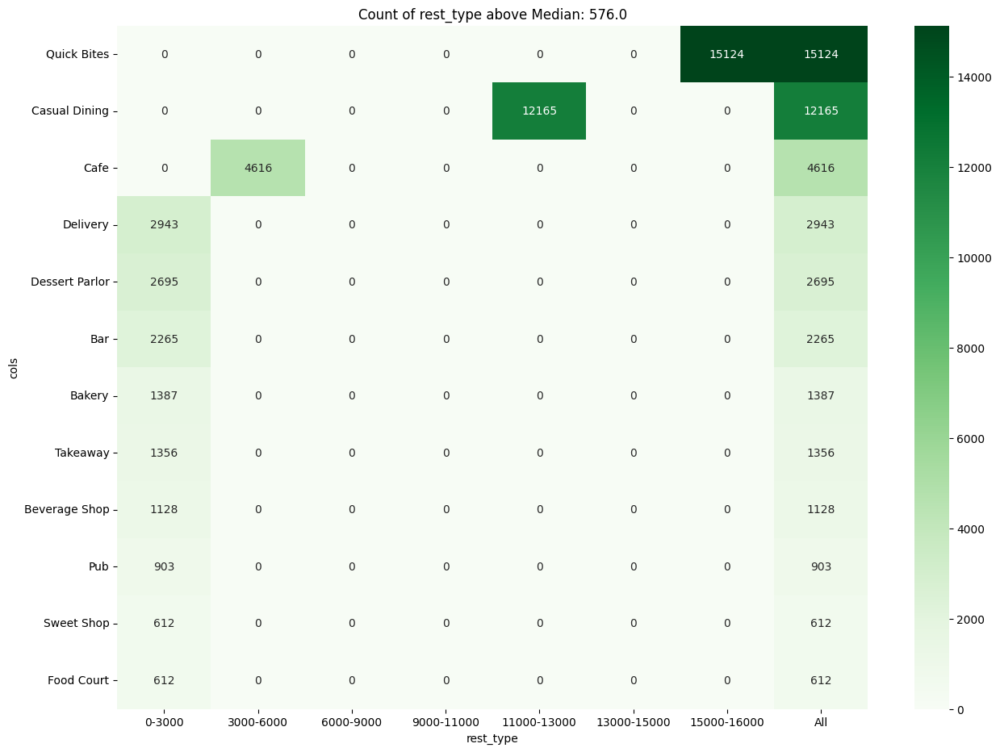

count       24.00
mean     1,983.42
std      3,798.81
min          3.00
25%         61.25
50%        576.00
75%      1,606.50
max     15,124.00
Name: Count, dtype: float64

(0.00        3.00
 0.20       31.40
 0.40      363.20
 0.50      576.00
 0.75    1,606.50
 0.95   11,032.65
 0.97   13,082.29
 1.00   15,124.00
 Name: Count, dtype: float64,
 None,
 <Axes: >)

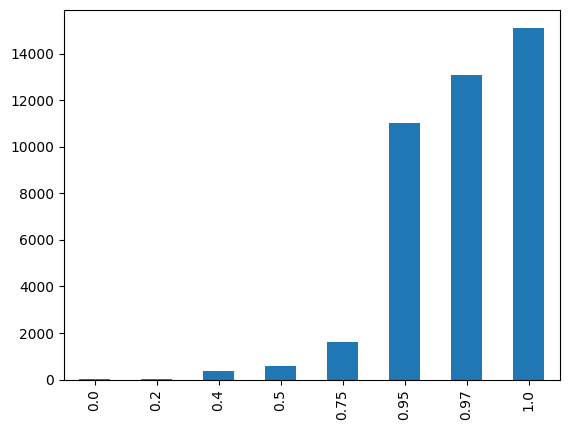

In [153]:
# Return Col_Analyzer Class
Col_analyzer = ColAnalysis( df , 'rest_type', quantile_list=[0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1] , 
    bins_list=[0, 3000, 6000, 9000, 11000, 13000 , 15000 , 16000], 
    labels_list=["0-3000", "3000-6000", "6000-9000", "9000-11000", "11000-13000" , "13000-15000" , "15000-16000"] )

# Display
Col_analyzer.analyze()

# Describe Filltered Data
display( Col_analyzer.calculate_col_counts()['Count'].describe() )

# Plot Quantiles [0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1]
display( Col_analyzer.calculate_col_quantiles())

#### - Cuisines

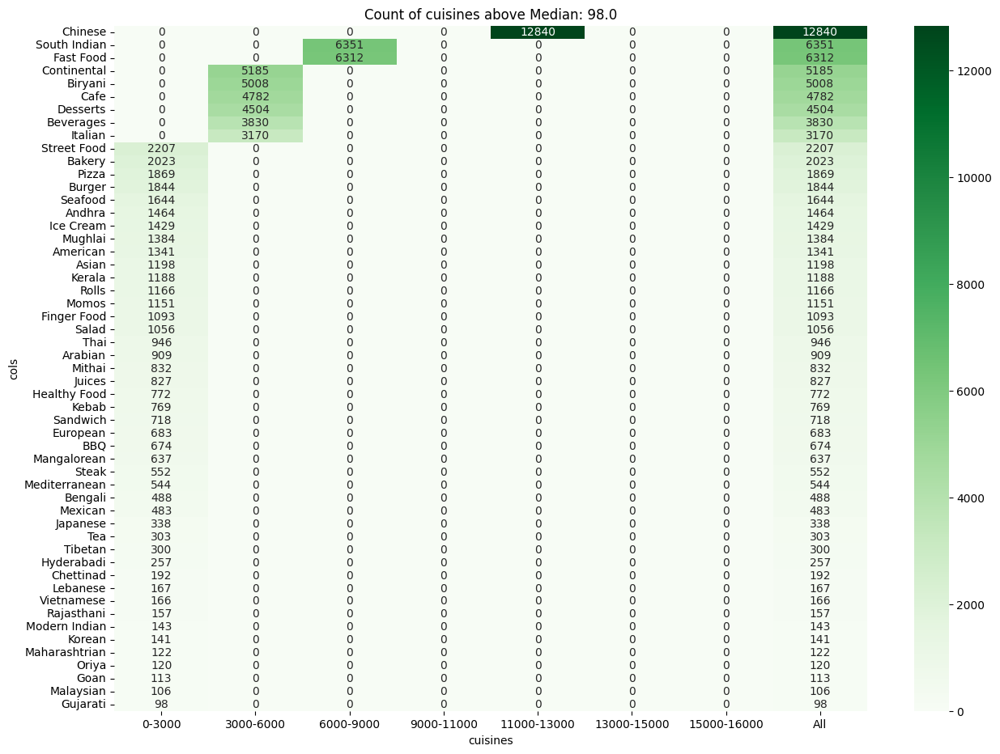

count      105.00
mean     1,003.30
std      2,395.19
min          1.00
25%         23.00
50%        106.00
75%        909.00
max     17,184.00
Name: Count, dtype: float64

(0.00        1.00
 0.20       14.40
 0.40       60.40
 0.50      106.00
 0.75      909.00
 0.95    4,962.80
 0.97    6,176.76
 1.00   17,184.00
 Name: Count, dtype: float64,
 None,
 <Axes: >)

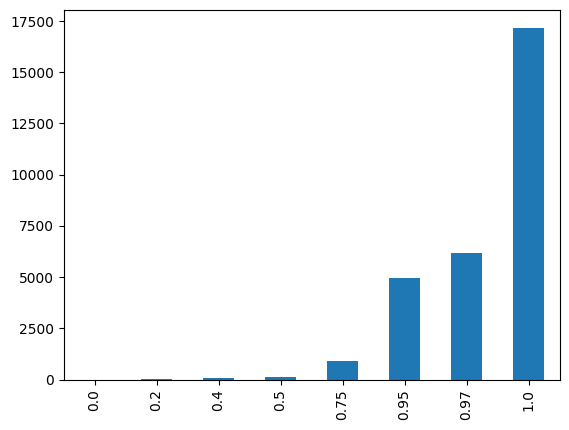

In [154]:
# Return Col_Analyzer Class
Col_analyzer = ColAnalysis(
    df,  
    'cuisines', 
    quantile_list=[0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1] , 
    bins_list=[0, 3000, 6000, 9000, 11000, 13000 , 15000 , 16000], 
    labels_list=["0-3000", "3000-6000", "6000-9000", "9000-11000", "11000-13000" , "13000-15000" , "15000-16000"] )  
Col_analyzer.analyze()

# Describe Filltered Data
display( Col_analyzer.calculate_col_counts()['Count'].describe() )

# Plot Quantiles [0 , 0.2 , 0.4 , 0.5 , 0.75 , 0.95 , 0.97 ,1]
display( Col_analyzer.calculate_col_quantiles())

### 🚩 Distribution and Coorelation Analysis

In [155]:
df.head(1).T

,0
name,Jalsa
online_order,1
book_table,1
rate,4.10
votes,775
phone,1
location,Banashankari
rest_type,Casual Dining
cuisines,"North Indian, Mughlai, Chinese"
approx_cost,800.00


#### - Distribution

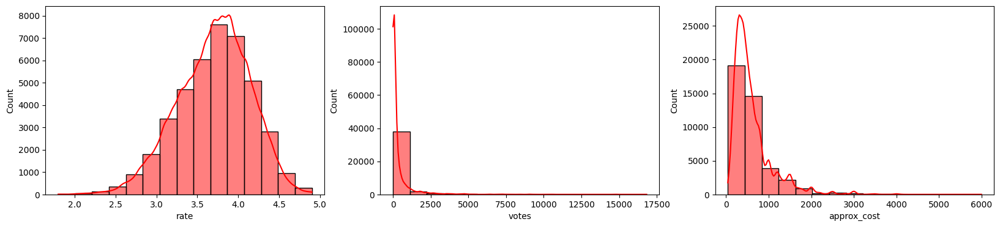

In [156]:
columns = ['rate', 'votes', 'approx_cost']
plt.figure(figsize=(20, 4))
for i,col in enumerate(columns):
    plt.subplot(1, 3, i+1)
    sns.histplot(data = df, x = col, kde = True, bins = 15, color = 'r')
plt.show()


 Total_North_Indian


score,Total_North_Indian,0,1
0,0,20078,19460
1,1,505,1132
2,2,12,18


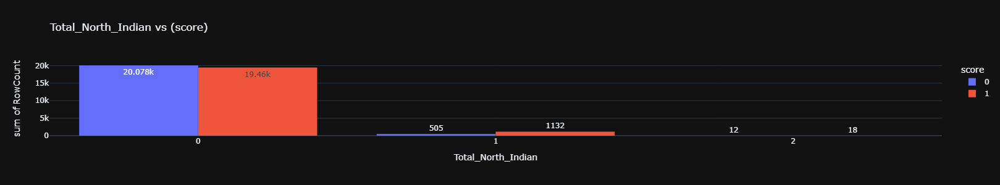


 Total_South_Indian


score,Total_South_Indian,0,1
0,0,"18,931.00","18,798.00"
1,1,"1,593.00","1,657.00"
2,2,71.00,119.00
3,3,0.00,30.00
4,4,0.00,6.00


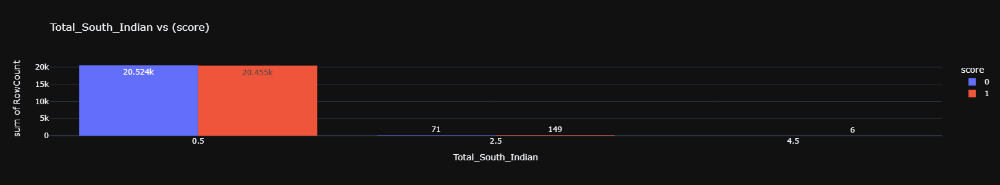


 Total_East_Indian


score,Total_East_Indian,0,1
0,0,20333,20306
1,1,219,280
2,2,43,24


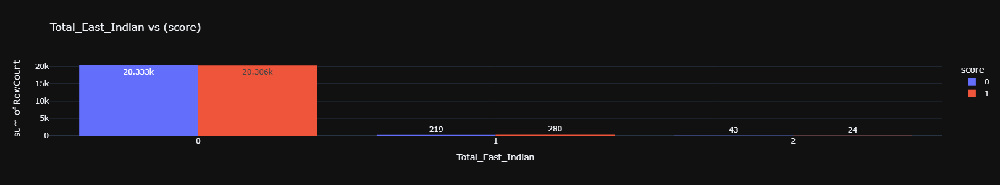


 Total_West_Indian


score,Total_West_Indian,0,1
0,0,"20,490.00","20,385.00"
1,1,105.00,218.00
2,2,0.00,7.00


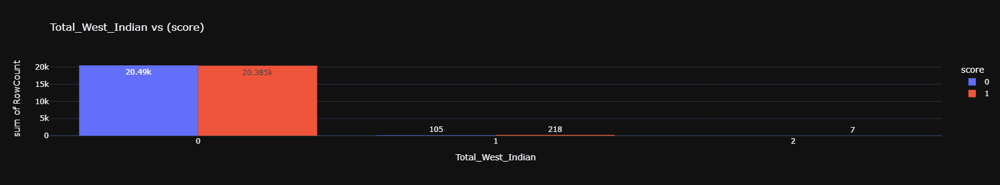


 Total_International


score,Total_International,0,1
0,0,19156,15518
1,1,1162,3470
2,2,264,1348
3,3,12,234
4,4,1,40


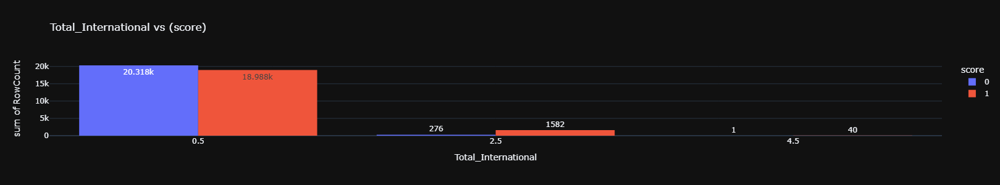


 Total_Asian


score,Total_Asian,0,1
0,0,"14,596.00","13,202.00"
1,1,"5,771.00","6,512.00"
2,2,197.00,632.00
3,3,31.00,163.00
4,4,0.00,42.00
5,5,0.00,59.00


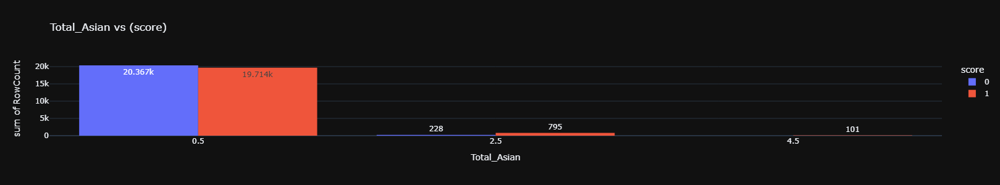


 Total_Grill/BBQ/Bar_Food


score,Total_Grill/BBQ/Bar_Food,0,1
0,0,19488,18763
1,1,1001,1628
2,2,101,212
3,3,5,7


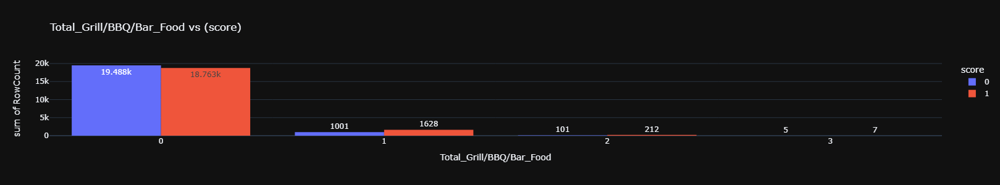


 Total_Fast_Food


score,Total_Fast_Food,0,1
0,0,"15,164.00","15,408.00"
1,1,"4,714.00","4,390.00"
2,2,646.00,786.00
3,3,68.00,8.00
4,4,1.00,18.00
5,5,2.00,0.00


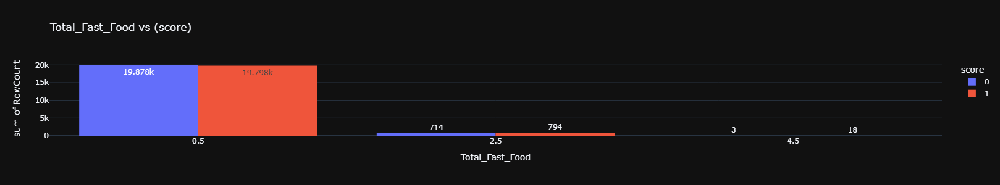


 Total_Beverages/Desserts


score,Total_Beverages/Desserts,0,1
0,0,"15,800.00","16,637.00"
1,1,"3,400.00","2,718.00"
2,2,"1,205.00","1,034.00"
3,3,188.00,221.00
4,4,2.00,0.00


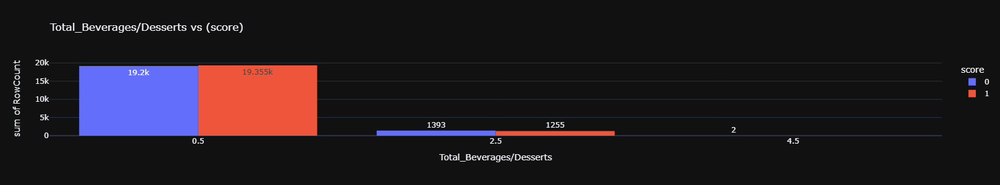


 Total_Healthy/Fusion


score,Total_Healthy/Fusion,0,1
0,0,20156,19351
1,1,375,1044
2,2,64,215


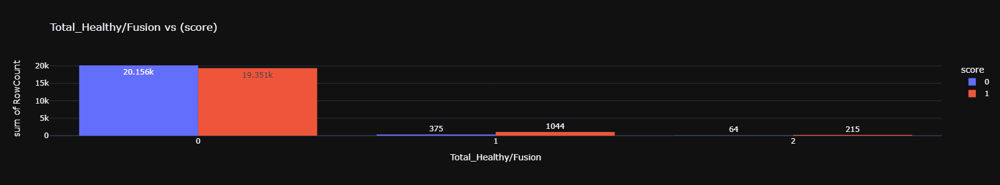


 Total_Bakery


score,Total_Bakery,0,1
0,0,19176,19983
1,1,1419,627


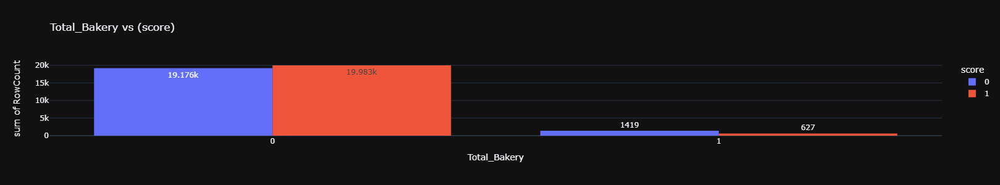


 Rest_Fine Dining


score,Rest_Fine Dining,0,1
0,0,20551,20254
1,1,44,356


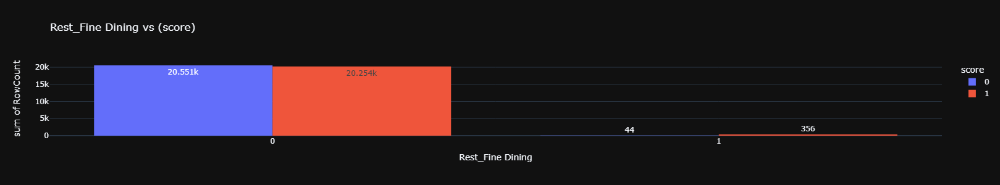


 Rest_SweetOrBakery


score,Rest_SweetOrBakery,0,1
0,0,17911,18791
1,1,2541,1756
2,2,143,63


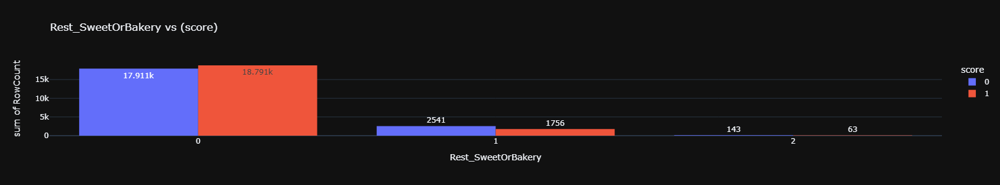


 Rest_Drink_Oriented_Establishments


score,Rest_Drink_Oriented_Establishments,0,1
0,0,"19,947.00","17,385.00"
1,1,648.00,"2,995.00"
2,2,0.00,230.00


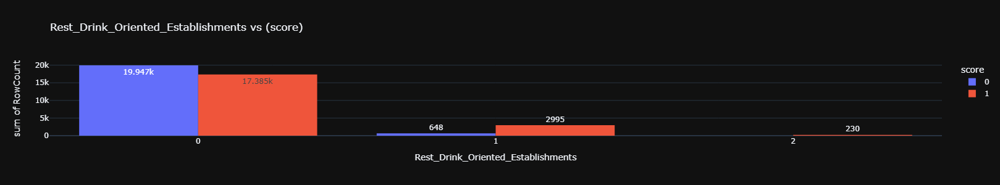


 Rest_Specialty_Shops


score,Rest_Specialty_Shops,0,1
0,0,19584,20248
1,1,1011,362


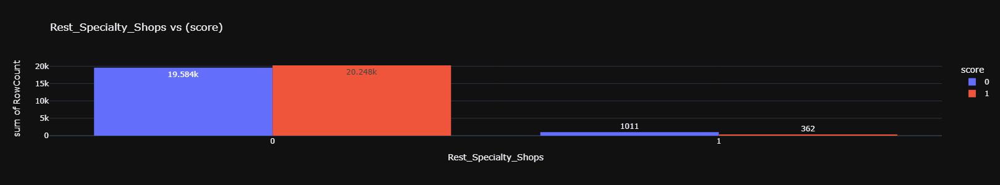


 Rest_Dining_Establishments


score,Rest_Dining_Establishments,0,1
0,0,5372,3449
1,1,15041,16624
2,2,182,537


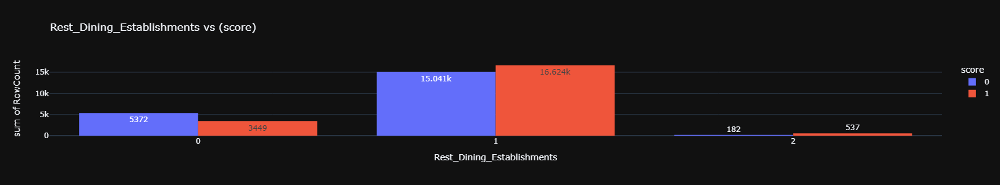


 Rest_Takeaway_and_Delivery


score,Rest_Takeaway_and_Delivery,0,1
0,0,18483,19700
1,1,1128,617
2,2,984,293


In [157]:
NewCols = df.drop(['name','location','rest_type','cuisines','listed_type',
                   'listed_city' , 'online_order','book_table','rate','votes','phone','approx_cost',
                   'menu_item','score','RowCount','rateRange','approx_cost_Range','votes_Range'] ,axis=1).columns.tolist()

for i in NewCols:
    NewColMsk = df.groupby([i , 'score'])['RowCount'].sum().reset_index()
    NewColCross = pd.crosstab(index = NewColMsk[i] , columns= NewColMsk['score'] , values=NewColMsk['RowCount'] , aggfunc='sum').reset_index().replace(np.nan , 0)
    print('\n',i)
    display(NewColCross)
    px.histogram(NewColMsk , x = i , y='RowCount' , color='score' , histfunc='sum', template='plotly_dark' , text_auto=True ,barmode='group', title=f'{i} vs (score)' , width=600 , height=300).show()

['score', 'rate']


,feature,score
0,score,1.00
1,rate,0.52
2,approx_cost,0.38
3,book_table,0.38
4,votes,0.37
5,Total_International,0.24
6,Rest_Drink_Oriented_Establishments,0.21
7,online_order,0.14
8,Rest_Dining_Establishments,0.13
9,Total_Asian,0.10


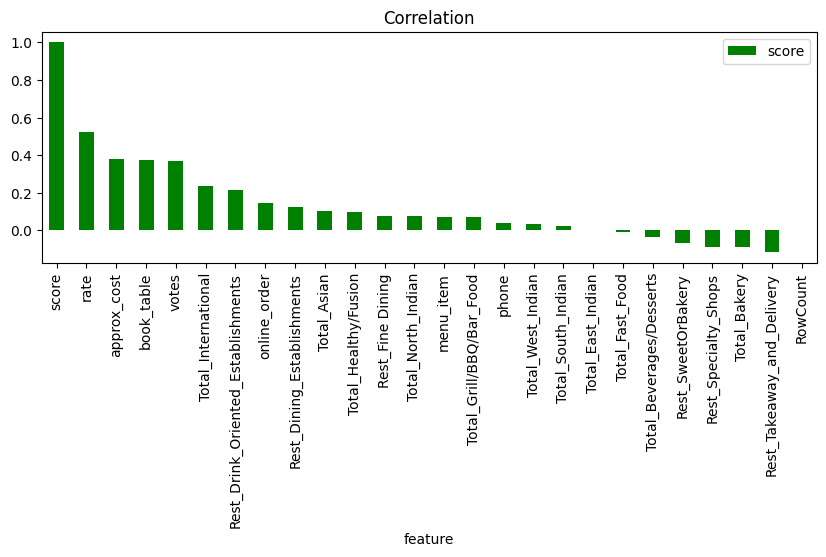

In [158]:
# Correlations
Corr = df.select_dtypes('number').corr()['score'].sort_values(ascending=False).reset_index().rename(columns={'index':'feature'})
Drop_list = Corr[Corr.score > 0.5].feature.tolist()
print(Drop_list)
display(Corr)

Corr.plot.bar(figsize=(10,3),x='feature',y='score',color='g',title='Correlation');

### ☑️ Conclusion 📊

-	How many cuisines in both Scores
-	What is the AVG approx cost in both Scores
-	How many Lications and listed_city Zomato Covers
-	Top 10 Good Restaurants (Votes/Rates)
-	Top 10 Good Restaurants (Votes/Rates) in approx costp
-	To 10 Locations (Votes/Rates) Contains Good Res Restaurants p
-	To 10 Lications Contains Good/Bad Count of Restaurantsp 
-	To 10 listed_city (Votes/Rates) Contains Good Res Restaurantps 
-	To 10 listed_city Contains Good/Bad Count of Restauranpts 
-	To 10 rest_type (Votes/Rates) in Good Restaurapnts 
-	To 10 listed_type (Votes/Rates) in Good Restaurpants 
-	To 10 cuisines (Votes/Rates) in Good Rstaurants 
staurants 
staurants 


* How many cuisines in both Scores


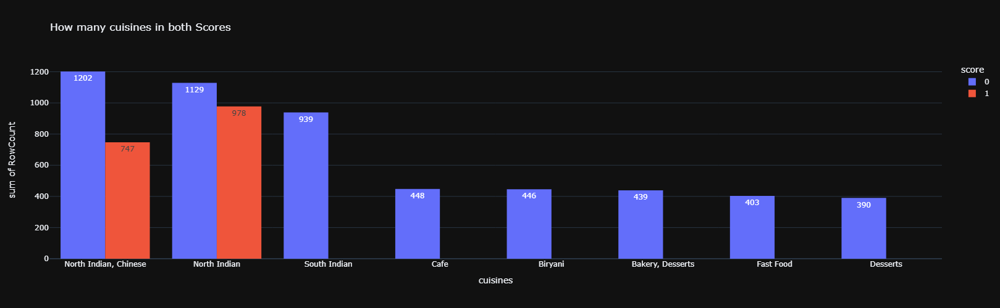

In [159]:
ask_1 = df.groupby(['cuisines' , 'score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_1 , x = 'cuisines' , y='RowCount' , color='score' , template='plotly_dark' , text_auto=True ,barmode='group', title=f'How many cuisines in both Scores' , width=1000 , height=500).show()

* What is the AVG approx cost in both Scores


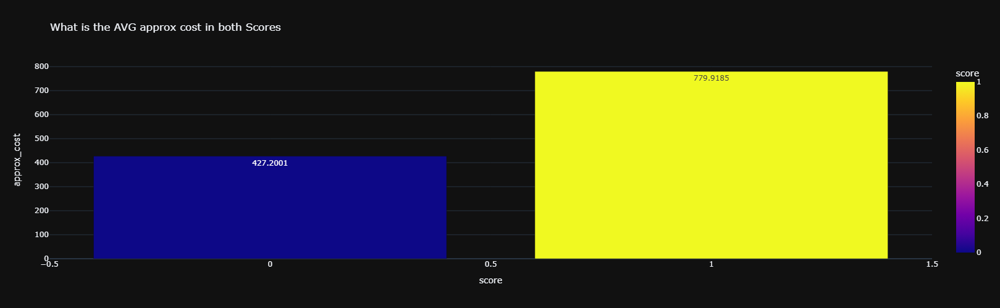

In [160]:
ask_2 = df.groupby(['score'])['approx_cost'].mean().reset_index()
px.bar(ask_2 , x = 'score' , y='approx_cost' , template='plotly_dark' , text_auto=True , color= 'score' ,title= f'What is the AVG approx cost in both Scores' , width=1000 , height=500).show()

* How many Lications and listed_city Zomato Covers

In [161]:
for i in ['location' , 'listed_city']:
    print(f"Total {i} : " , df[i].nunique()  )

Total location :  92
Total listed_city :  30


* Top 10 Good Restaurants (Votes/Rates)


In [162]:
df[ (df.votes >=df.votes.median() ) & (df.rate >= 4.7) ][['name' , 'votes' , 'rate']].groupby(['name']).agg({'votes':'mean' , 'rate':'mean'}).sort_values(by = ['votes' , 'rate'] , ascending = False).head(10)

,votes,rate
name,,
Byg Brewski Brewing Company,"16,588.50",4.90
Toit,"14,956.00",4.70
Truffles,"12,429.53",4.70
The Black Pearl,"9,562.33",4.73
Big Pitcher,"9,036.00",4.70
TBC Sky Lounge,"6,745.00",4.70
Chili's American Grill & Bar,"6,451.17",4.80
Brew and Barbeque - A Microbrewery Pub,"5,746.00",4.70
Flechazo,"4,992.67",4.80


* Top 10 Good Restaurants (Votes/Rates) in approx cost

In [163]:
df[ (df.votes >=df.votes.median() ) & (df.rate >= 4.7) ][['name' , 'votes' ,'rate' ,'approx_cost']].groupby(['name']).agg({'votes':'mean' , 'rate':'mean' , 'approx_cost':'mean'}).sort_values(by = ['approx_cost','votes' , 'rate'] , ascending = False).head(10)

,votes,rate,approx_cost
name,,,
Biergarten,"2,656.20",4.77,"2,200.00"
Punjab Grill,"1,380.00",4.87,"2,000.00"
You Mee,261.67,4.70,"2,000.00"
Big Pitcher,"9,036.00",4.70,"1,800.00"
The Boozy Griffin,"4,700.50",4.80,"1,800.00"
Mainland China,"1,533.67",4.70,"1,700.00"
Byg Brewski Brewing Company,"16,588.50",4.90,"1,600.00"
Barbeque Nation,"4,474.89",4.71,"1,600.00"
AB's - Absolute Barbecues,"4,906.71",4.81,"1,588.24"


* Top 10 Locations (Votes/Rates) Contains Good Res Restaurants

In [164]:
df[ (df.votes >=df.votes.median() ) & (df.rate >= 4.7) & (df.score == 1) ][['name' , 'votes' , 'rate' ,'score']].groupby(['name' , 'score']).agg({'votes':'mean' , 'rate':'mean'}).sort_values(by = ['votes' , 'rate'] , ascending = False).head(10)

,,votes,rate
name,score,,
Byg Brewski Brewing Company,1,"16,588.50",4.90
Toit,1,"14,956.00",4.70
Truffles,1,"12,429.53",4.70
The Black Pearl,1,"9,562.33",4.73
Big Pitcher,1,"9,036.00",4.70
TBC Sky Lounge,1,"6,745.00",4.70
Chili's American Grill & Bar,1,"6,451.17",4.80
Brew and Barbeque - A Microbrewery Pub,1,"5,746.00",4.70
Flechazo,1,"4,992.67",4.80


* Top 10 Locations Contains Good/Bad Count of Restaurants

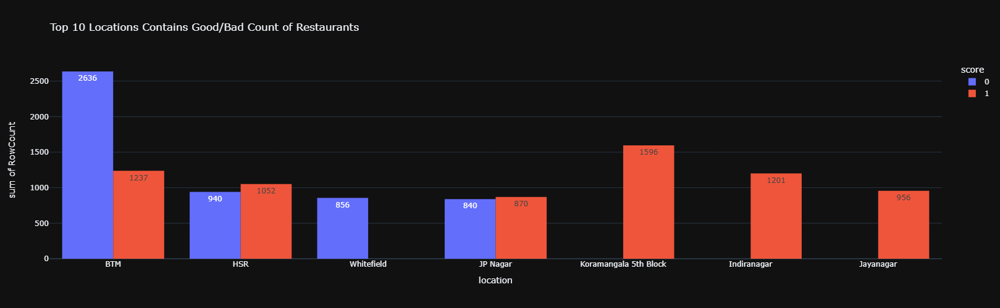

In [165]:
ask_6 = df.groupby(['location','score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_6 , x = 'location' , y='RowCount' , template='plotly_dark' , text_auto=True , color= 'score',barmode='group' ,title= f'Top 10 Locations Contains Good/Bad Count of Restaurants' , width=1000 , height=500).show()

* Top 10 listed_city (Votes/Rates) Contains Good Res Restaurants


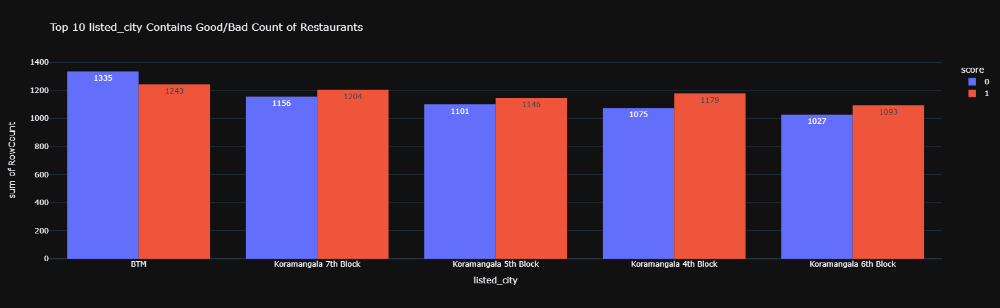

In [166]:
ask_7 = df.groupby(['listed_city','score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_7 , x = 'listed_city' , y='RowCount' , template='plotly_dark' , text_auto=True , color= 'score',barmode='group' ,title= f'Top 10 listed_city Contains Good/Bad Count of Restaurants' , width=1000 , height=500).show()

* Top 10 rest_type (Votes/Rates) in Good Restaurants

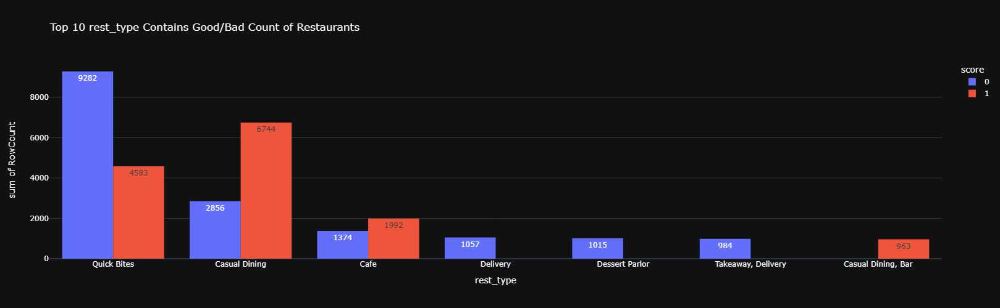

In [167]:
ask_8 = df.groupby(['rest_type','score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_8 , x = 'rest_type' , y='RowCount' , template='plotly_dark' , text_auto=True , color= 'score',barmode='group' ,title= f'Top 10 rest_type Contains Good/Bad Count of Restaurants' , width=1000 , height=500).show()

* Top listed_type (Votes/Rates) in Good Restaurants

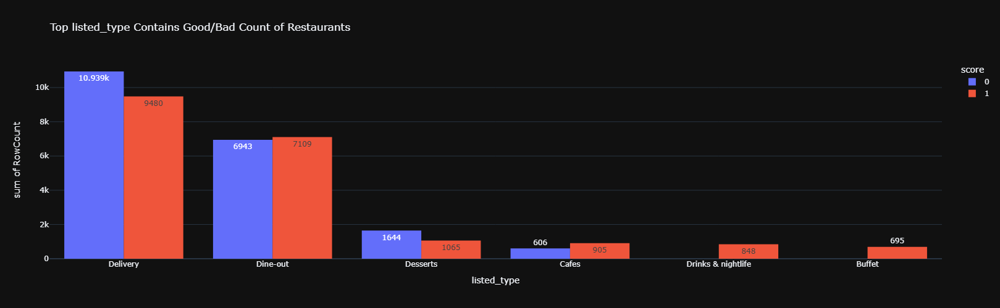

In [168]:
ask_9 = df.groupby(['listed_type','score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_9 , x = 'listed_type' , y='RowCount' , template='plotly_dark' , text_auto=True , color= 'score',barmode='group' ,title= f'Top listed_type Contains Good/Bad Count of Restaurants' , width=1000 , height=500).show()

* Top 10 cuisines (Votes/Rates) in Good Rstaurants staurants staurants

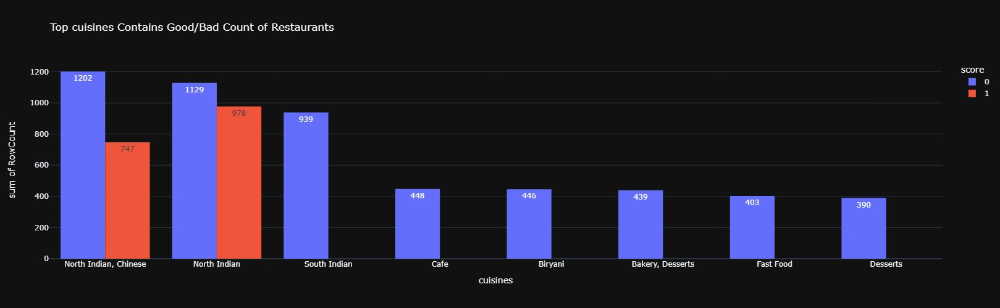

In [169]:
ask_10 = df.groupby(['cuisines','score'])['RowCount'].sum().nlargest(10).reset_index()
px.histogram(ask_10 , x = 'cuisines' , y='RowCount' , template='plotly_dark' , text_auto=True , color= 'score',barmode='group' ,title= f'Top cuisines Contains Good/Bad Count of Restaurants' , width=1000 , height=500).show()

## ✅ 05 - Modeling Import Libraries

In [170]:
from sklearn.model_selection import train_test_split, GridSearchCV
from category_encoders import BinaryEncoder
from sklearn.preprocessing import RobustScaler, OneHotEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score, accuracy_score, precision_score, recall_score

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import cross_val_score

import joblib

## ✅ 06 - Preprocessing 

In [171]:
drop_cols = ['name' , 'rate' , 'votes' , 'location' , 'rest_type' , 'cuisines' , 'RowCount' , 'rateRange' , 'approx_cost_Range' , 'votes_Range' ] # 
ml_df = df.copy()
ml_df = ml_df.drop(drop_cols, axis=1)

x = ml_df.drop('score', axis=1)
y = ml_df['score']
num_cols = ml_df.drop('score' , axis=1).select_dtypes('number').columns.tolist()
cat_cols = ml_df.select_dtypes('O').columns.tolist()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

# Pipeline
num_pipe = Pipeline(steps=[( 'Scaller' , RobustScaler() )])
cat_pipeline = Pipeline ( steps = [("Encoder" , BinaryEncoder(handle_unknown='ignore') )] )

Processor = ColumnTransformer(transformers=[ ('num', num_pipe, num_cols )  ,  ('cat' , cat_pipeline , cat_cols)]).set_output(transform='pandas')

x_train_proc = Processor.fit_transform(x_train)
x_test_proc = Processor.transform(x_test)

Processor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('Scaller', RobustScaler())]),
                                 ['online_order', 'book_table', 'phone',
                                  'approx_cost', 'menu_item',
                                  'Total_North_Indian', 'Total_South_Indian',
                                  'Total_East_Indian', 'Total_West_Indian',
                                  'Total_International', 'Total_Asian',
                                  'Total_Grill/BBQ/Bar_Food', 'Total_Fast_Food',
                                  'Total_Beverages/Desserts',
                                  'Total_Healthy/Fusion', 'Total_Bakery',
                                  'Rest_Fine Dining', 'Rest_SweetOrBakery',
                                  'Rest_Drink_Oriented_Establishments',
                                  'Rest_Specialty_Shops',
                                  'Rest_Dining_Establishments',
                                  'Rest_Takeaway_and_Delivery']),
                                ('cat',
                                 Pipeline(steps=[('Encoder',
                                                  BinaryEncoder(handle_unknown='ignore'))]),
                                 ['listed_type', 'listed_city'])])

#### * Logistic Regrission

## ✅ 07 - Modeling

###  - Logistic Regrission

Train Logistic Regression :  0.726
Test Logistic Regression :  0.727

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4103
           1       0.77      0.65      0.70      4138

    accuracy                           0.73      8241
   macro avg       0.73      0.73      0.73      8241
weighted avg       0.73      0.73      0.73      8241



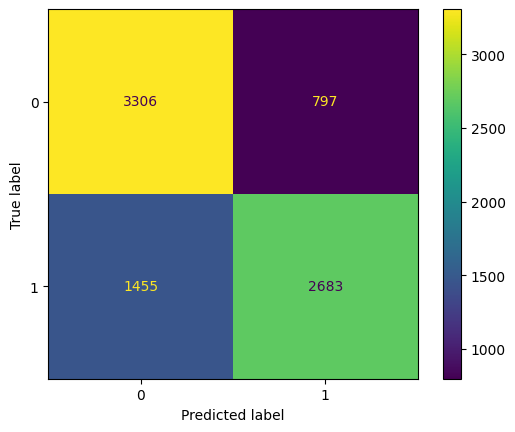

In [172]:
# Logistic Regrission
Log_Reg = LogisticRegression(C=0.04 , max_iter = 400 , penalty = 'l1' ,solver =  'liblinear') 
Log_Reg.fit(x_train_proc , y_train)

Y_pred_log = Log_Reg.predict(x_test_proc)

print("Train Logistic Regression : " , Log_Reg.score(x_train_proc , y_train).round(3))
print("Test Logistic Regression : " , Log_Reg.score(x_test_proc , y_test).round(3))

print("\nClassification Report:")
print(classification_report(y_test , Y_pred_log))
ConfusionMatrixDisplay(confusion_matrix(y_test , Y_pred_log)).plot()

In [ ]:
# Define the hyperparameters grid to search through
param_grid_Log_Reg = {
    'penalty': ['l1', 'l2'],  # Regularization types
    'C': [0.01, 0.02 , 0.03 ,0.1, 1.0, 10.0],  # Inverse of regularization strength
    'max_iter': [100, 200],  # Maximum number of iterations to converge
    'solver': ['liblinear', 'saga']  # Solvers that support l1/l2 regularization
}

# Initialize GridSearch
grid_search_Log_Reg = GridSearchCV(estimator = Log_Reg, param_grid = param_grid_Log_Reg , cv=3, n_jobs=-1, verbose=2)

# Fit the data to perform the search for best parameters
grid_search_Log_Reg.fit(x_train_proc, y_train)

# Output the best parameters found
print("Best Parameters:", grid_search_Log_Reg.best_params_)
print("Best Score:", grid_search_Log_Reg.best_score_)

In [173]:
# Perform cross-validation
cv_scores = cross_val_score(Log_Reg, x_train_proc, y_train)

# Print the cross-validation scores
print('Scores: ', cv_scores)
print('Mean: ', np.mean(cv_scores))
print('Std: ', np.std(cv_scores))

Scores:  [0.72455635 0.72880328 0.72774154 0.72137115 0.72011529]
Mean:  0.7245175220776965
Std:  0.003407133672592749


<Axes: xlabel='score', ylabel='Density'>

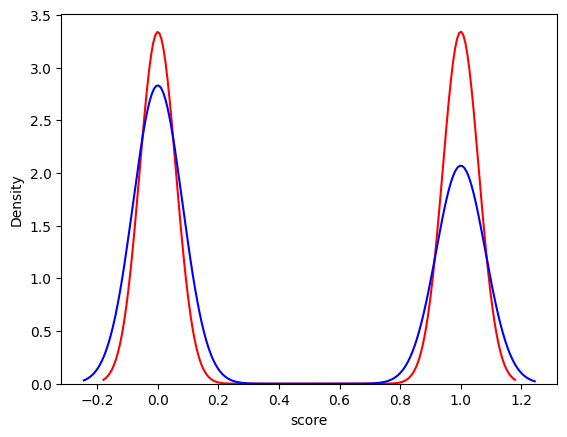

In [174]:
ax = sns.distplot(df.score , hist=False , kde=True , color='r' , label='Actual')
sns.distplot(np.where(Y_pred_log == 0, 0, 1) , hist=False , kde=True , color='b' , label='Predicted')

### - Linear SVC

Train LinearSVC :  0.726
Test LinearSVC :  0.725

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4103
           1       0.77      0.65      0.70      4138

    accuracy                           0.72      8241
   macro avg       0.73      0.72      0.72      8241
weighted avg       0.73      0.72      0.72      8241



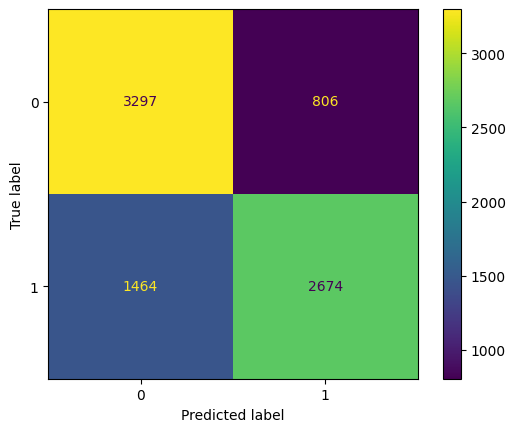

In [175]:
# Linear SVC
svc = LinearSVC(C = 1.0, fit_intercept = False, max_iter = 200, penalty = 'l2')
svc.fit(x_train_proc , y_train)

Y_pred_svc = svc.predict(x_test_proc)

print("Train LinearSVC : " , svc.score(x_train_proc , y_train).round(3))
print("Test LinearSVC : " , svc.score(x_test_proc , y_test).round(3))

print("\nClassification Report:")
print(classification_report(y_test , Y_pred_svc))
ConfusionMatrixDisplay(confusion_matrix(y_test , Y_pred_svc)).plot()

In [ ]:
# Define the hyperparameters grid to search through
param_grid_svc = {
    'penalty' : ['l1', 'l2'] , 
    'C' : [0 , 1.0],
    'max_iter' : [20 , 200 , 300],
    'fit_intercept' : [True , False]}

# Initialize GridSearch
grid_search_svc = GridSearchCV(estimator = svc, param_grid = param_grid_svc , cv=3, n_jobs=-1, verbose=2)

# Fit the data to perform the search for best parameters
grid_search_svc.fit(x_train_proc, y_train)

# Output the best parameters found
print("Best Parameters:", grid_search_svc.best_params_)
print("Best Score:", grid_search_svc.best_score_)

In [192]:
# Perform cross-validation
cv_scores = cross_val_score(svc, x_train_proc, y_train)

# Print the cross-validation scores
print('Scores: ', cv_scores)
print('Mean: ', np.mean(cv_scores))
print('Std: ', np.std(cv_scores))

Scores:  [0.72531473 0.71742757 0.72971333 0.71500076 0.73058252]
Mean:  0.7236077834832176
Std:  0.006342148785998299


<Axes: xlabel='score', ylabel='Density'>

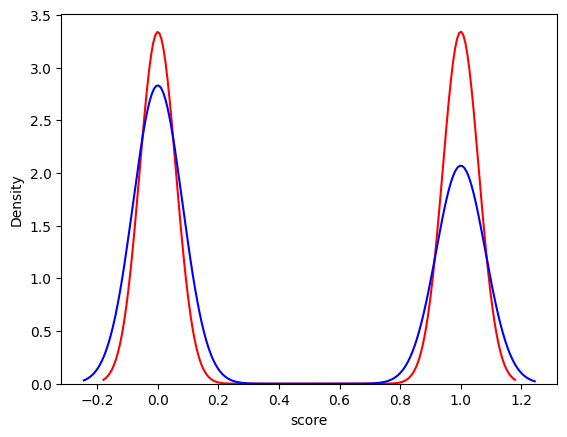

In [176]:
ax = sns.distplot(df.score , hist=False , kde=True , color='r' , label='Actual')
sns.distplot(np.where(Y_pred_svc == 0, 0, 1) , hist=False , kde=True , color='b' , label='Predicted')

### - Decision Tree

Train Decision Tree :  0.798
Test Decision Tree :  0.777

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.82      0.79      4103
           1       0.81      0.73      0.77      4138

    accuracy                           0.78      8241
   macro avg       0.78      0.78      0.78      8241
weighted avg       0.78      0.78      0.78      8241



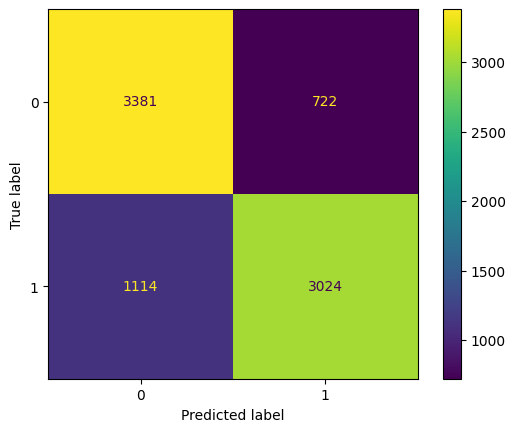

In [177]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
DT = DecisionTreeClassifier( criterion = 'gini', max_depth = 200, max_leaf_nodes= 500, splitter = 'best')
DT.fit(x_train_proc , y_train)
y_pred_DT = DT.predict(x_test_proc)

print("Train Decision Tree : " , DT.score(x_train_proc , y_train).round(3))
print("Test Decision Tree : " , DT.score(x_test_proc , y_test).round(3))

print("\nClassification Report:")
print(classification_report(y_test , y_pred_DT))
ConfusionMatrixDisplay(confusion_matrix(y_test , y_pred_DT)).plot()

In [ ]:
# Define the hyperparameters grid to search through
param_grid_Dtree = {
    'max_depth': [10, 100, 200 , 500],  
    'max_leaf_nodes': [10, 100, 200 , 500],  
    'splitter': ["best", "random"], 
    'criterion' : ["gini", "entropy", "log_loss"]
}

# Initialize GridSearch
grid_search_Dtree = GridSearchCV(estimator = DT, param_grid = param_grid_Dtree , cv=3, n_jobs=-1, verbose=2)

# Fit the data to perform the search for best parameters
grid_search_Dtree.fit(x_train_proc, y_train)

# Output the best parameters found
print("Best Parameters:", grid_search_Dtree.best_params_)
print("Best Score:", grid_search_Dtree.best_score_)

In [178]:
# Perform cross-validation
cv_scores = cross_val_score(DT, x_train_proc, y_train)

# Print the cross-validation scores
print('Scores: ', cv_scores)
print('Mean: ', np.mean(cv_scores))
print('Std: ', np.std(cv_scores))

Scores:  [0.78583346 0.7735477  0.77218262 0.76732899 0.76441141]
Mean:  0.7726608345641671
Std:  0.007362267831907157


<Axes: xlabel='score', ylabel='Density'>

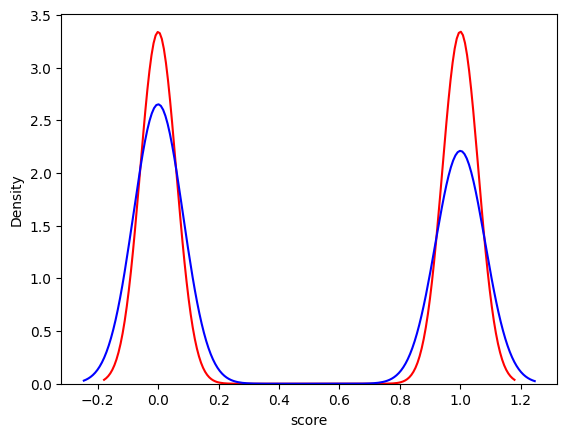

In [179]:
ax = sns.distplot(df.score , hist=False , kde=True , color='r' , label='Actual')
sns.distplot(np.where(y_pred_DT == 0, 0, 1) , hist=False , kde=True , color='b' , label='Predicted')

### - Random Forest Classifier

Train Random Forest :  0.875
Test Random Forest :  0.78

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4106
           1       0.81      0.73      0.77      4135

    accuracy                           0.78      8241
   macro avg       0.78      0.78      0.78      8241
weighted avg       0.78      0.78      0.78      8241



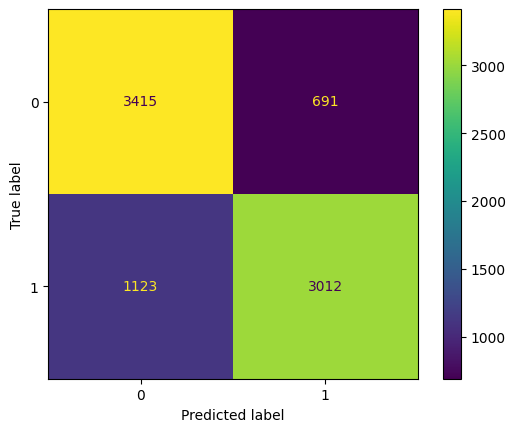

In [197]:
RF = RandomForestClassifier( criterion='gini', max_depth=20 , n_estimators = 100)
RF.fit(x_train_proc , y_train)
y_pred_RF = RF.predict(x_test_proc)

print("Train Random Forest : " , RF.score(x_train_proc , y_train).round(3))
print("Test Random Forest : " , RF.score(x_test_proc , y_test).round(3))

print("\nClassification Report:")
print(classification_report(y_test , y_pred_RF))
ConfusionMatrixDisplay(confusion_matrix(y_test , y_pred_RF)).plot()

In [ ]:
# Define the hyperparameters grid to search through
param_grid_RF = {
    'n_estimators': [50, 100],  # Number of trees in the forest
    'max_depth': [5, 20, 30],  # Maximum depth of the tree
    'criterion': ['gini', 'entropy', 'log_loss']  # Function to measure the quality of a split
}

# Initialize GridSearch
grid_search_RF = GridSearchCV(estimator=RF, param_grid=param_grid_RF, cv=3, n_jobs=-1, verbose=2)

# Fit the data to perform the search for best parameters
grid_search_RF.fit(x_train_proc, y_train)

# Output the best parameters found
print("Best Parameters:", grid_search_RF.best_params_)
print("Best Score:", grid_search_RF.best_score_)

In [198]:
# Perform cross-validation
cv_scores = cross_val_score(RF, x_train_proc, y_train)

# Print the cross-validation scores
print('Scores: ', cv_scores)
print('Mean: ', np.mean(cv_scores))
print('Std: ', np.std(cv_scores))

Scores:  [0.76990748 0.76111027 0.7697558  0.76020021 0.77563714]
Mean:  0.7673221791941731
Std:  0.005849017662859


<Axes: xlabel='score', ylabel='Density'>

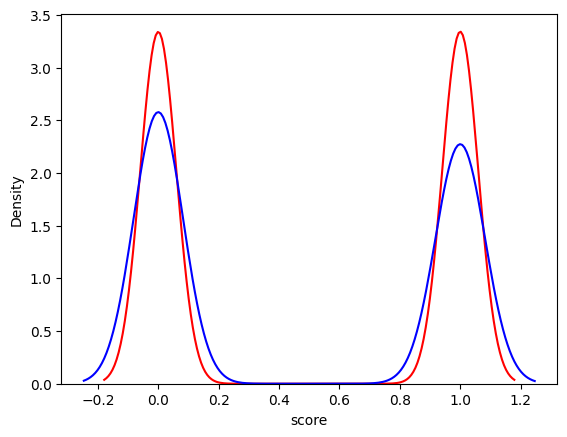

In [199]:
ax = sns.distplot(df.score , hist=False , kde=True , color='r' , label='Actual')
sns.distplot(np.where(y_pred_DT == 0, 0, 1) , hist=False , kde=True , color='b' , label='Predicted')

### - XGB Classifier

xgboost Tree :  0.901
xgboost Tree :  0.792

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.82      0.80      4103
           1       0.81      0.76      0.79      4138

    accuracy                           0.79      8241
   macro avg       0.79      0.79      0.79      8241
weighted avg       0.79      0.79      0.79      8241



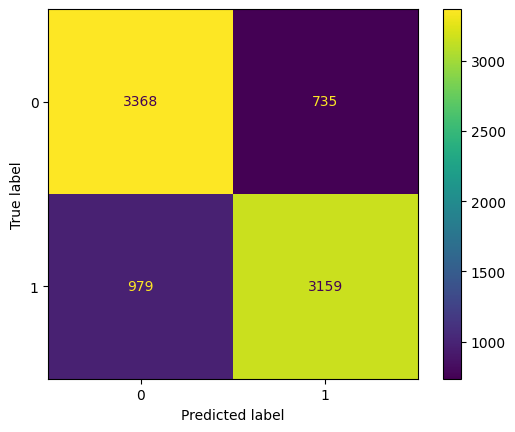

In [180]:
# XGB Classifier
import xgboost as xgb
xgb_clf = xgb.XGBClassifier( gamma = 0.001 , learning_rate = 0.3 , max_depth = 20 ,n_estimators =30 , reg_alpha = 0.1   )  # 'gamma': 0.3, 'learning_rate': 0.2, 'max_depth': 50, 'n_estimators': 50, 'reg_alpha': 0.1}
xgb_clf.fit(x_train_proc , y_train)
y_pred_xgb_clf = xgb_clf.predict(x_test_proc)

print("xgboost Tree : " , xgb_clf.score(x_train_proc , y_train).round(3))
print("xgboost Tree : " , xgb_clf.score(x_test_proc , y_test).round(3))

print("\nClassification Report:")
print(classification_report(y_test , y_pred_xgb_clf))
ConfusionMatrixDisplay(confusion_matrix(y_test , y_pred_xgb_clf)).plot()

In [ ]:
# Define the hyperparameters grid to search through
param_grid_xgb_clf = {
    'n_estimators': [50, 100],  # Number of boosting rounds
    'max_depth': [50 , 100],  # Maximum tree depth
    'learning_rate': [0.01, 0.1, 0.2],  # Step size shrinkage
    'gamma': [0, 0.1, 0.3],  # Minimum loss reduction required to make a further partition
    'reg_alpha': [0, 0.01, 0.1] # L1 regularization term on weights
}
# Initialize GridSearch
grid_search_xgb_clf = GridSearchCV(estimator=xgb_clf, param_grid=param_grid_xgb_clf, cv=3, n_jobs=-1, verbose=2)

# Fit the data to perform the search for best parameters
grid_search_xgb_clf.fit(x_train_proc, y_train)

# Output the best parameters found
print("Best Parameters:", grid_search_xgb_clf.best_params_)
print("Best Score:", grid_search_xgb_clf.best_score_)

In [201]:
# Perform cross-validation
cv_scores = cross_val_score(DT, x_train_proc, y_train)

# Print the cross-validation scores
print('Scores: ', cv_scores)
print('Mean: ', np.mean(cv_scores))
print('Std: ', np.std(cv_scores))

Scores:  [0.77824966 0.76050356 0.7773396  0.76566055 0.77654733]
Mean:  0.7716601409777065
Std:  0.007211476276475009


<Axes: xlabel='score', ylabel='Density'>

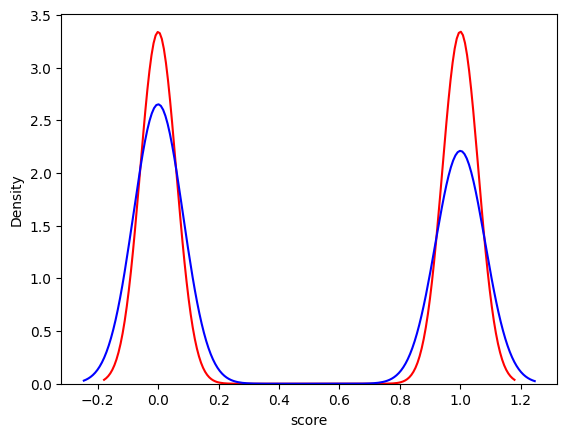

In [181]:
ax = sns.distplot(df.score , hist=False , kde=True , color='r' , label='Actual')
sns.distplot(np.where(y_pred_DT == 0, 0, 1) , hist=False , kde=True , color='b' , label='Predicted')

## ✅ 08 - Deployment

In [182]:
ml_df.head(1).T

,0
online_order,1
book_table,1
phone,1
approx_cost,800.00
menu_item,0
listed_type,Buffet
listed_city,Banashankari
score,1
Total_North_Indian,1
Total_South_Indian,0


In [183]:
# Freatures
ml_df.columns

Index(['online_order', 'book_table', 'phone', 'approx_cost', 'menu_item',
       'listed_type', 'listed_city', 'score', 'Total_North_Indian',
       'Total_South_Indian', 'Total_East_Indian', 'Total_West_Indian',
       'Total_International', 'Total_Asian', 'Total_Grill/BBQ/Bar_Food',
       'Total_Fast_Food', 'Total_Beverages/Desserts', 'Total_Healthy/Fusion',
       'Total_Bakery', 'Rest_Fine Dining', 'Rest_SweetOrBakery',
       'Rest_Drink_Oriented_Establishments', 'Rest_Specialty_Shops',
       'Rest_Dining_Establishments', 'Rest_Takeaway_and_Delivery'],
      dtype='object')

In [184]:
# Save Model(Rando Forest) with Processor
import pickle
pickle.dump(Processor , open('Processor.pkl' , 'wb'))
pickle.dump(xgb_clf , open('xgb_clf_Model.pkl' , 'wb'))

# Load
pickle.load(open('Processor.pkl' , 'rb'))
pickle.load(open('xgb_clf_Model.pkl' , 'rb'))

# Prepocess
Processor_Model = pickle.load(open('Processor.pkl' , 'rb'))
xgb_clf_model = pickle.load(open('xgb_clf_Model.pkl' , 'rb'))

In [185]:
new_data = {
 'online_order' : 1 ,
 'book_table' : 1  ,
 'phone' : 0 ,
 'approx_cost' : 60 ,
 'menu_item' : 1 ,
 'listed_type' : 'Buffet' ,
 'listed_city' : 'Banashankari' ,
 'Total_North_Indian' :  1,
 'Total_South_Indian' : 0 ,
 'Total_East_Indian' :  0,
 'Total_West_Indian' :  1,
 'Total_International' : 0 ,
 'Total_Asian' : 0 ,
 'Total_Grill/BBQ/Bar_Food' :  0,
 'Total_Fast_Food': 0,
 'Total_Beverages/Desserts' :  0,
 'Total_Healthy/Fusion' : 0 ,
 'Total_Bakery' : 0 ,
 'Rest_Fine Dining' : 1 ,
 'Rest_SweetOrBakery' : 1 ,
 'Rest_Drink_Oriented_Establishments' :  0,
 'Rest_Specialty_Shops' : 0 ,
 'Rest_Dining_Establishments' : 0 ,
 'Rest_Takeaway_and_Delivery' : 0}

new_x = pd.DataFrame(new_data, index=[0])

In [186]:
def model_test(data):
    Processor_Model = pickle.load(open('Processor.pkl' , 'rb'))
    RF_model = pickle.load(open('xgb_clf_Model.pkl' , 'rb'))
    N_test = Processor_Model.transform(data)
    Test_Pred = xgb_clf_model.predict(N_test)
    return Test_Pred[0]
model_test(new_x)

1

In [187]:
# Test Model
test = x_test.head(1)
idx = test.index
actual = df.iloc[idx]['score']

N_test = Processor_Model.transform(test)
Test_Pred = xgb_clf.predict(N_test)

display(test)
print('actual Value = ' , actual)
print('Predicted Value = ' , Test_Pred)

,online_order,book_table,phone,approx_cost,menu_item,listed_type,listed_city,Total_North_Indian,Total_South_Indian,Total_East_Indian,...,Total_Fast_Food,Total_Beverages/Desserts,Total_Healthy/Fusion,Total_Bakery,Rest_Fine Dining,Rest_SweetOrBakery,Rest_Drink_Oriented_Establishments,Rest_Specialty_Shops,Rest_Dining_Establishments,Rest_Takeaway_and_Delivery
15492,1,0,1,250.00,1,Delivery,Jayanagar,0,0,0,...,0,0,0,0,0,0,0,0,1,0


actual Value =  15521    0
Name: score, dtype: int64
Predicted Value =  [0]


In [188]:
ml_df.to_csv('df_final.csv' , index=False)

In [189]:
pd.read_csv('df_final.csv').head(2).T

,0,1
online_order,1,1
book_table,1,0
phone,1,1
approx_cost,800.00,800.00
menu_item,0,0
listed_type,Buffet,Buffet
listed_city,Banashankari,Banashankari
score,1,1
Total_North_Indian,1,0
Total_South_Indian,0,0


In [190]:
%%writefile app.py
import streamlit as st
import pandas as pd
import numpy as np

# Visualization Package
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

pd.options.display.float_format = '{:,.2f}'.format
import warnings
warnings.filterwarnings('ignore')


# Preprocessing Package
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import RobustScaler, OneHotEncoder, StandardScaler
from category_encoders import BinaryEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.model_selection import cross_val_score

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score, accuracy_score, precision_score, recall_score
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Pipeline Package
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Model Deployment Package
import pickle
import joblib

# Deployment Package
import streamlit as st

# Read Data

df_org = pd.read_csv('df_final.csv',index_col=0)
pd.options.display.float_format ='{:,.2f}'.format
st.set_page_config (page_title = 'Zomato' , layout = "wide" , page_icon = 'Z')
st.title("Zomato Classification")

# Sidebar
brief = st.sidebar.checkbox(":red[Brief about Project]")
Planning = st.sidebar.checkbox(":green[About Project]")
About_me = st.sidebar.checkbox(":green[About me]")

if brief:
    st.sidebar.header(":red[Brief about Project]")
    st.sidebar.write("""
    * This project involves analyzing the Zomato dataset to classify restaurants based on user ratings and other key factors. 
    * The primary goal is to predict whether a restaurant is "Good" or "Not Good" based on attributes such as the average rating (rate) and total number of votes (votes).
    * :red[So let us see the insights 👀.]
    """)
# Planning
if Planning :
    st.sidebar.header(":green[About Project]")
    st.sidebar.subheader ('Zomato Classification')
    st.sidebar.write("""
    * This project during my Intership @ Epsilon AI (https://www.epsiloneg.com/). 
    * Data Source:
        - Kaggle : https://www.kaggle.com/datasets/himanshupoddar/zomato-bangalore-restaurants?authuser=0
    """)
    st.sidebar.write("""
    * Data Details:
        * Columns : 25 Features
        * Instance : 41205 Instance

    * Features selected in the deployment model:
         * online_order.
         * book_table.
         * phone.
         * approx_cost.
         * menu_item.
         * listed_type.
         * listed_city.
         * Total_North_Indian.
         * Total_South_Indian.
         * Total_East_Indian.
         * Total_West_Indian.
         * Total_International.
         * Total_Asian.
         * Total_Grill/BBQ/Bar_Food.
         * Total_Fast_Food.
         * Total_Beverages/Desserts.
         * Total_Healthy/Fusion.
         * Total_Bakery.
         * Rest_Fine Dining.
         * Rest_SweetOrBakery.
         * Rest_Drink_Oriented_Establishments.
         * Rest_Specialty_Shops.
         * Rest_Dining_Establishments.
         * Rest_Takeaway_and_Delivery.
    """)
# Aboutme
if About_me :
    st.sidebar.header(":green[About me]")
    st.sidebar.write("""
    - Osama SAAD
    - Certified Data Science - Epsilon AI
    - Infor EAM Master Data and Assets Control Section Head @Ibnsina Pharma
    - LinkedIn: 
        https://www.linkedin.com/in/ossama-ahmed-saad-525785b2
    - Github : 
        https://github.com/OsamaSamnudi
    """)

# Tabs :
# Corrected section for creating tabs
tab1, = st.tabs(['🧠Prediction🤖'])

with tab1:
    with st.container():
        st.header("🧠 Prediction🤖")
        col1, col2, col3 , col4 = st.columns([50, 50, 50 , 50])
        
        # Data Collection
        with col1:
            listed_city = st.selectbox("Select listed_city", ["Select"] + df_org.listed_city.unique().tolist())
            approx_cost = float(st.number_input("approx_cost", 0.0, 10000.0))
            Total_North_Indian = int(st.number_input("North_Indian", 0, 1000))
            Total_South_Indian = int(st.number_input("South_Indian", 0, 1000))
            Total_East_Indian = int(st.number_input("East_Indian", 0, 1000))
            Total_West_Indian = int(st.number_input("West_Indian", 0, 1000))
            Total_International = int(st.number_input("International", 0, 1000))

        with col2 :
            listed_type = st.selectbox("Select listed_type", ["Select"] + df_org.listed_type.unique().tolist())
            Total_Asian = int(st.number_input("Asian", 0, 1000))
            Total_Grill_BBQ_Bar_Food = int(st.number_input("Grill/BBQ/Bar Food", 0, 1000))
            Total_Fast_Food = int(st.number_input("Fast Food", 0, 1000))
            Total_Beverages_Desserts = int(st.number_input("Beverages/Desserts", 0, 1000))
            Total_Healthy_Fusion = int(st.number_input("Healthy/Fusion", 0, 1000))
            Total_Bakery = int(st.number_input("Bakery", 0, 1000))
        with col3:
            online_order = st.radio('online_order', [0, 1], horizontal=True)
            book_table = st.radio('book_table', [0, 1], horizontal=True)
            phone = st.radio('phone', [0, 1], horizontal=True)
            menu_item = st.radio('menu_item', [0, 1], horizontal=True)
            Rest_Fine_Dining = st.radio('Fine Dining', [0, 1], horizontal=True)

                    
        with col4 :
            Rest_SweetOrBakery = st.radio('Sweet Or Bakery', [0, 1], horizontal=True)
            Rest_Drink_Oriented_Establishments = st.radio('Drink Oriented Establishments', [0, 1], horizontal=True)
            Rest_Specialty_Shops = st.radio('Specialty Shops', [0, 1], horizontal=True)
            Rest_Dining_Establishments = st.radio('Dining Establishments', [0, 1], horizontal=True)
            Rest_Takeaway_and_Delivery = st.radio('Takeaway and Delivery', [0, 1], horizontal=True)
        
        with st.container():
            st.write('📌 Your Selected Data:')
            col4, col5, col6 = st.columns([5, 200, 2])
            with col5:
                N_data = pd.DataFrame({
                    'online_order': [online_order],
                    'book_table': [book_table],
                    'phone': [phone],
                    'approx_cost': [approx_cost],
                    'menu_item': [menu_item],
                    'listed_type': [listed_type],
                    'listed_city': [listed_city],
                    'Total_North_Indian': [Total_North_Indian],
                    'Total_South_Indian': [Total_South_Indian],
                    'Total_East_Indian': [Total_East_Indian],
                    'Total_West_Indian': [Total_West_Indian],
                    'Total_International': [Total_International],
                    'Total_Asian': [Total_Asian],
                    'Total_Grill/BBQ/Bar_Food': [Total_Grill_BBQ_Bar_Food],
                    'Total_Fast_Food': [Total_Fast_Food],
                    'Total_Beverages/Desserts': [Total_Beverages_Desserts],
                    'Total_Healthy/Fusion': [Total_Healthy_Fusion],
                    'Total_Bakery': [Total_Bakery],
                    'Rest_Fine Dining': [Rest_Fine_Dining],
                    'Rest_SweetOrBakery': [Rest_SweetOrBakery],
                    'Rest_Drink_Oriented_Establishments': [Rest_Drink_Oriented_Establishments],
                    'Rest_Specialty_Shops': [Rest_Specialty_Shops],
                    'Rest_Dining_Establishments': [Rest_Dining_Establishments],
                    'Rest_Takeaway_and_Delivery': [Rest_Takeaway_and_Delivery]
                })

                st.dataframe(N_data, use_container_width=True , height=100)

            if st.button('Predict'):
                Processor_Model = pickle.load(open('Processor.pkl' , 'rb'))
                RF_model = pickle.load(open('xgb_clf_Model.pkl' , 'rb'))
                N_test = Processor_Model.transform(N_data)
                Test_Pred = RF_model.predict(N_test)
                if Test_Pred == 1:
                    Result = 'Good'
                    st.balloons()
                    st.markdown(f"""<span style="font-size:larger; color:green">**Patient Result : {Result}**</span>""" , unsafe_allow_html=True)
                else:
                    Result = 'Not Good'
                    st.markdown(f"""<span style="font-size:larger; color:red">**Patient Result : {Result}**</span>""" , unsafe_allow_html=True)


Overwriting app.py


In [221]:
!streamlit run app.py

^C


In [214]:
!pip install pipreqs

In [229]:
!pipreqs

Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
INFO: Successfully saved requirements file in D:\Data Science (Material)\01-Epslion\04-Internship (Karim Hamdy)\Projects\Zomato-ML-Classification\requirements.txt
